In [129]:
import matplotlib
import pickle
import glob
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio
import numpy as np
import pickle
from torch.optim import lr_scheduler
from os.path import exists
import matplotlib.pyplot as plt
from tqdm import tqdm
import copy
import random
import torchaudio
from torchaudio import transforms
import torchvision.models as models

torch.manual_seed(1)
random.seed(1)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Data loading

In [130]:
def calculate_rms(waveforms):
    reshape=False
    if len(waveforms.shape) == 4:
        waveforms = waveforms.reshape(-1, 16, 1056)
        reshape = True
    return waveforms.square().mean(axis=len(waveforms.shape) - 1).sqrt()

def get_max_rms(rms_waveforms):
    return rms_waveforms.max(axis=1)[0]

combined_waveforms, combined_positions = torch.load("final_results/truck_final_combined_data.pt")
# cv_groups, test_set = torch.load("final_results/truck_combined_data_indexes.pt")

test_set_bins = torch.load("final_results/test_set_bins.pt")
train_set_indexes_7_sorted = torch.load("final_results/train_set_indexes_7_sorted.pt")
combined_rms_waveforms = calculate_rms(combined_waveforms)
indexes = train_set_indexes_7_sorted
print(len(indexes))
torch.manual_seed(1)
random.seed(1)

training_waveforms = combined_waveforms[indexes]
training_positions = combined_positions[indexes]

num = 3220
data = [i for i in range(num)]
split_size = 30
num_splits = num // split_size
num_splits_per_group = num_splits // 4
print(num_splits, num_splits_per_group)
num_used_splits = num_splits_per_group * 4
perm = torch.randperm(num_used_splits)
cv_groups = []
for i in range(4):
    group = []
    for split in perm[num_splits_per_group*i: (num_splits_per_group*i)+num_splits_per_group]:
        group.extend([j for j in range(split_size*split, (split_size*split)+split_size)])
    group.extend([j for j in range((num // 120 * 120)+(25*i), (num // 120 * 120)+(25*i)+25)])
    print(len(group))
    cv_groups.append(torch.tensor(group))
total_test_set = torch.hstack(test_set_bins)
print("total test set", total_test_set.shape)

train_valid_test_sets = []
for valid in cv_groups:
    train = torch.hstack([group for group in cv_groups if group is not valid])
    X_train = training_waveforms[train].reshape(-1, 16, 1056)
    Y_train = training_positions[train]
    X_valid = training_waveforms[valid].reshape(-1, 16, 1056)
    Y_valid = training_positions[valid]
    X_test = combined_waveforms[total_test_set].reshape(-1, 16, 1056)
    Y_test = combined_positions[total_test_set]
    print(X_train.shape, Y_train.shape, X_valid.shape, Y_valid.shape, X_test.shape, Y_test.shape)
    train_valid_test_sets.append([X_train, Y_train, X_valid, Y_valid, X_test, Y_test])
    print(int(Y_valid[0, 0].item()), int(Y_valid[0, 1].item()))
print(train_valid_test_sets[3][3][0])

3220
107 26
805
805
805
805
total test set torch.Size([1150])
torch.Size([2415, 16, 1056]) torch.Size([2415, 2]) torch.Size([805, 16, 1056]) torch.Size([805, 2]) torch.Size([1150, 16, 1056]) torch.Size([1150, 2])
471 322
torch.Size([2415, 16, 1056]) torch.Size([2415, 2]) torch.Size([805, 16, 1056]) torch.Size([805, 2]) torch.Size([1150, 16, 1056]) torch.Size([1150, 2])
422 187
torch.Size([2415, 16, 1056]) torch.Size([2415, 2]) torch.Size([805, 16, 1056]) torch.Size([805, 2]) torch.Size([1150, 16, 1056]) torch.Size([1150, 2])
145 201
torch.Size([2415, 16, 1056]) torch.Size([2415, 2]) torch.Size([805, 16, 1056]) torch.Size([805, 2]) torch.Size([1150, 16, 1056]) torch.Size([1150, 2])
246 115
tensor([246.3203, 115.5686])


# Required Functions

In [131]:
class ScaledSigmoid(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.sigmoid = nn.Sigmoid()
    def forward(self, x):
        return self.sigmoid(x) * torch.tensor([700, 500]).to(device)
    
def squared_loss(a, b):
    return (((a-b)**2)).sum(axis=1).mean()

def mel_spec(waveform, f=400):
    transform = transforms.MelSpectrogram(16000, n_fft=f)
    result = transform(waveform.cpu()).cuda()
    return result

def spec(waveform, f=400):
    transform=transforms.Spectrogram(n_fft=f)
    result = transform(waveform.cpu()).cuda()
    return result

# Model Class and Training

In [132]:
def squared_loss(a, b):
    return (((a-b)**2)).sum(axis=1).mean()

def mae_loss(a, b):
    return (((a-b)**2)).sum(axis=1).sqrt().mean()

def z_norm(a):
    return ((a-a.mean(axis=1, keepdim=True))/a.std(axis=1, keepdim=True))

def train_model(model, data, batch_size=32, epochs=200, new_parameters="", saving="use_saved", 
                shuffle_data=True, save=False, verbose=True, 
                validation_losses=None, train_losses = None, lr=0.01, mel_spect=False, f=400, gamma=0.99):
    torch.manual_seed(1)
    random.seed(1)
    if not new_parameters:
        print(new_parameters[-1])
    X_train, Y_train, X_val, Y_val, X_test, Y_test = data
    
    if mel_spect:
        X_train = mel_spec(X_train, f=f).cuda()
        X_val = mel_spec(X_val, f=f).cuda()
        X_test = mel_spec(X_test, f=f).cuda()
    else:
        X_train = spec(X_train, f=f).cuda()
        X_val = spec(X_val, f=f).cuda()
        X_test = spec(X_test, f=f).cuda()
    
    Y_train = Y_train.cuda()
    Y_val = Y_val.cuda()
    Y_test = Y_test.cuda()
    
    # Normalize the data
    X_train = z_norm(X_train)
    X_val = z_norm(X_val)
    X_test = z_norm(X_test)
    lowest_train_loss = 0
    if validation_losses is None:
        validation_losses = []
        train_losses = []
    parameters = f"models_6/b{batch_size},e{epochs},LR{lr},{mel_spect},{f},{(int(Y_val[0, 0].item()), int(Y_val[0, 1].item()))}" + new_parameters
    print(parameters)
    if saving == "delete":
        os.remove(parameters + "_model.pt")
        os.remove(parameters + "_loss.pt")
        return
    if exists(parameters + "_loss.pt") and saving=="use_saved":
        model.load_state_dict(torch.load(parameters + "_model.pt"))
        train_losses, validation_losses, lowest_train_loss, lowest_valid_loss = torch.load(parameters + "_loss.pt")
        with torch.no_grad():
            test_loss = mae_loss(model(X_test), Y_test)
        print("Using saved model", new_parameters, str(lr), str(lowest_train_loss).ljust(8), str(lowest_valid_loss).ljust(8), str(int(test_loss)).ljust(8))
        return model, train_losses, validation_losses, parameters[7:], lowest_train_loss, lowest_valid_loss, test_loss
        
    if shuffle_data:
        perm=torch.randperm(len(X_train))
        X_train, Y_train = X_train[perm], Y_train[perm]

    
    
    lowest_valid_loss = torch.tensor(10000000)
    
    if type(lr) == float:
        optimizer = optim.Adam(params=model.parameters(), lr=lr)
        curr_lr = lr
        scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma = gamma)
    else:
        optimizer = optim.Adam(params=model.parameters(), lr=lr[0][0])
        epochs = 0
        curr_lr = lr[0][0]
        lr_change_epochs = []
        for _, epoch_num in lr:
            lr_change_epochs.append(epochs)
            epochs += epoch_num
    pbar = tqdm(range(epochs), ncols=125)
    num_times_saved=0
    loss = nn.MSELoss()
    for epoch in pbar:
        if type(lr) != float:
            if epoch in lr_change_epochs:
                new_lr = lr[lr_change_epochs.index(epoch)][0]
                curr_lr = new_lr
                for g in optimizer.param_groups:
                    g['lr'] = new_lr
        for batch in range(len(X_train) // batch_size):
            model.train()
            optimizer.zero_grad()
            outputs_train = model(X_train[batch_size * batch: batch_size * (batch + 1)])
            
            batch_train_loss = loss(outputs_train, Y_train[batch_size * batch: batch_size * (batch + 1)])
            batch_train_loss.backward()
            optimizer.step()
        
        with torch.no_grad():
            train_loss = mae_loss(model(X_train), Y_train)
            validation_loss = mae_loss(model(X_val), Y_val)
            
        if validation_loss < lowest_valid_loss:
            with torch.no_grad():
                test_loss = mae_loss(model(X_test), Y_test)
            lowest_valid_loss = validation_loss
            lowest_train_loss = train_loss
            if "sav" in saving:
                torch.save(model.state_dict(), parameters + "_model.pt")
                num_times_saved += 1
            torch.save(model.state_dict(), "temp_model.pt")
        validation_losses.append(validation_loss.detach().cpu().item())
        train_losses.append(train_loss.detach().cpu().item())
        if type(lr) == float:
            scheduler.step()
            curr_lr = scheduler.get_last_lr()
        pbar.set_description(str(epoch) +" Tr:"+ str(round(train_loss.item(), 2))+" V:"+ 
                             str(round(validation_loss.item(), 2))+" Te:"+ str(round(test_loss.item(), 2)) + " "+
                             str(num_times_saved) + " "+str(round(lowest_valid_loss.item(), 4)) + " "+str(curr_lr))
    if "sav" in saving:
        torch.save((train_losses, validation_losses, lowest_train_loss, lowest_valid_loss), parameters + "_loss.pt")
    model.load_state_dict(torch.load("temp_model.pt"))
    with torch.no_grad():
        test_loss = mae_loss(model(X_test), Y_test)

    return model, train_losses, validation_losses, parameters[7:], lowest_train_loss, lowest_valid_loss, test_loss

def plot(results, title="Plot of Train and Validation Loss, "):
    plt.rcParams['figure.figsize'] = [20, 5]
    plt.plot(results[1], label="Train Loss")
    plt.plot(results[2], label="Validation Loss")
    param = results[3]
    plt.title(title + param)
    plt.legend()
    plt.show()

# Figure out what the best model is

In [133]:
from copy import deepcopy
def test_model(model, train_valid_test_sets, add_to_title="", num_to_test=4, lr=0.01, epochs=600, param="", mel_spect=False, f=400, saving="use_saved", plot_graph=True, gamma=0.99):
    torch.save(model, "temp_model_44.pt")
    torch.save(model.state_dict(), "temp_model_45.pt")
    if len(param) == 0:
        print("WARNING WILL NOT SAVE PROPERLY")
    averaged_train_loss = 0.0
    averaged_valid_loss = 0.0
    averaged_test_loss = 0.0
    for i in range(num_to_test):
        model = torch.load("temp_model_44.pt")
        model.load_state_dict(torch.load("temp_model_45.pt"))

        results = train_model(model.cuda(), train_valid_test_sets[i], batch_size=32, 
                              lr=lr, epochs=epochs, new_parameters=",eLR"+param, mel_spect=mel_spect, f=f,saving=saving, gamma=gamma)
        model, train_losses, validation_losses, parameter_parts, lowest_train_loss, lowest_valid_loss, test_loss = results
        
        averaged_train_loss += lowest_train_loss / num_to_test
        averaged_valid_loss += lowest_valid_loss / num_to_test
        averaged_test_loss += test_loss / num_to_test
        if plot_graph:
            plot(results, title=f"{param} Cross Validation Set {i}{add_to_title}")
    print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
    print(averaged_train_loss, averaged_valid_loss, averaged_test_loss)
    print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


# Testing 400 Spectrograms

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(471, 322),eLRno dropout
Using saved model ,eLRno dropout [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(21.5946, device='cuda:0') tensor(43.0686, device='cuda:0') 58      


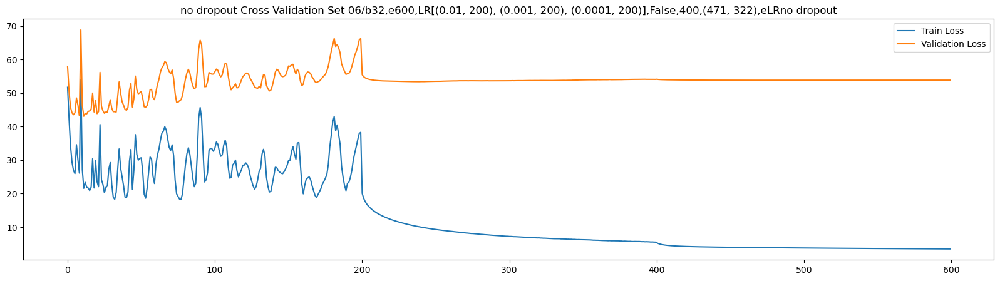

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(422, 187),eLRno dropout
Using saved model ,eLRno dropout [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(21.7314, device='cuda:0') tensor(37.3618, device='cuda:0') 57      


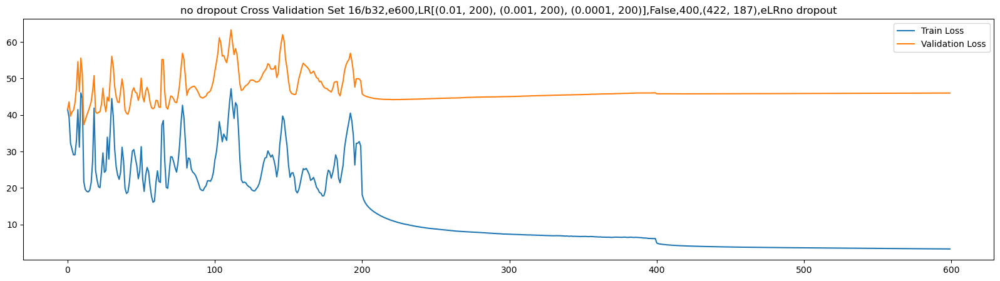

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(145, 201),eLRno dropout
Using saved model ,eLRno dropout [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(23.8497, device='cuda:0') tensor(43.9514, device='cuda:0') 58      


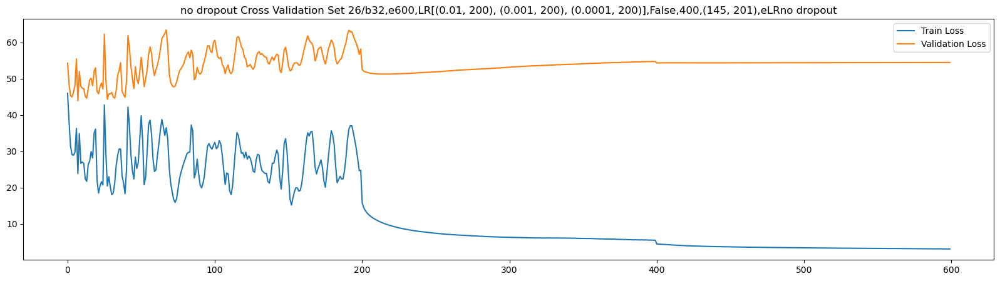

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(246, 115),eLRno dropout
Using saved model ,eLRno dropout [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(23.9169, device='cuda:0') tensor(39.2527, device='cuda:0') 58      


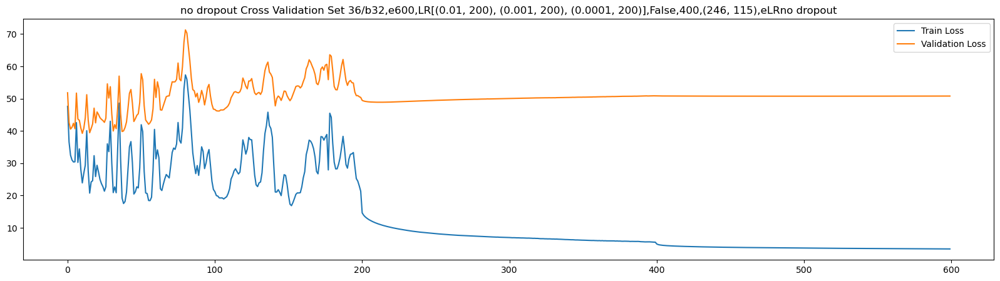

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(22.7732, device='cuda:0') tensor(40.9086, device='cuda:0') tensor(58.2294, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(471, 322),eLRno dropout
Using saved model ,eLRno dropout [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(27.4103, device='cuda:0') tensor(40.5093, device='cuda:0') 57      


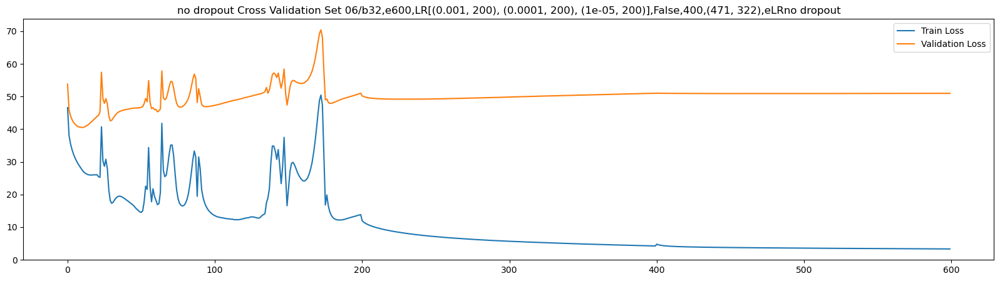

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(422, 187),eLRno dropout
Using saved model ,eLRno dropout [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(29.4224, device='cuda:0') tensor(36.4521, device='cuda:0') 58      


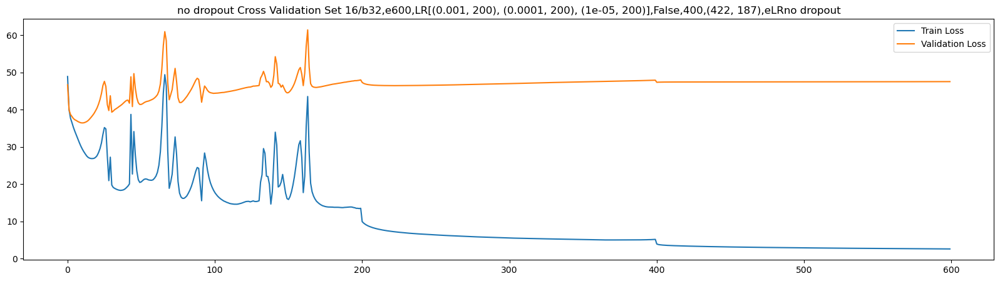

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(145, 201),eLRno dropout
Using saved model ,eLRno dropout [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(26.3720, device='cuda:0') tensor(41.7344, device='cuda:0') 57      


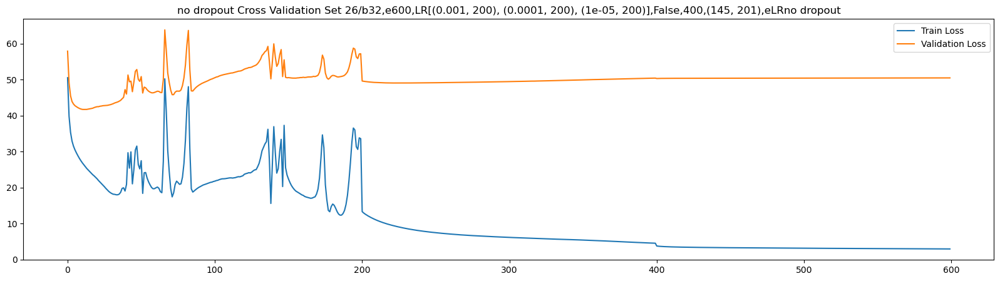

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(246, 115),eLRno dropout
Using saved model ,eLRno dropout [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(30.3302, device='cuda:0') tensor(37.3538, device='cuda:0') 59      


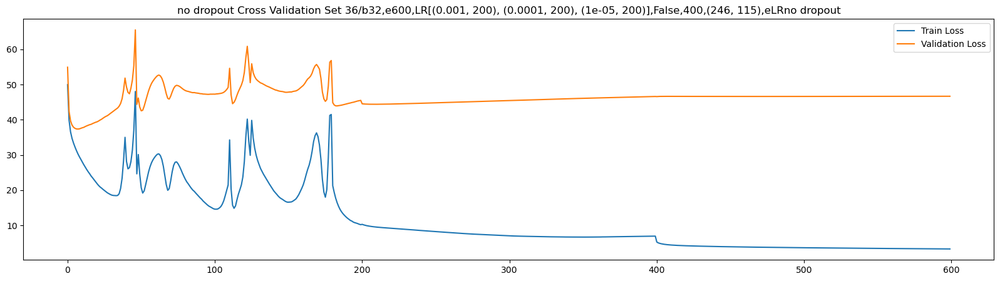

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(28.3837, device='cuda:0') tensor(39.0124, device='cuda:0') tensor(58.3410, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(471, 322),eLRno dropout
Using saved model ,eLRno dropout [(0.0001, 200), (1e-05, 200), (1e-06, 200)] tensor(25.9672, device='cuda:0') tensor(39.8448, device='cuda:0') 57      


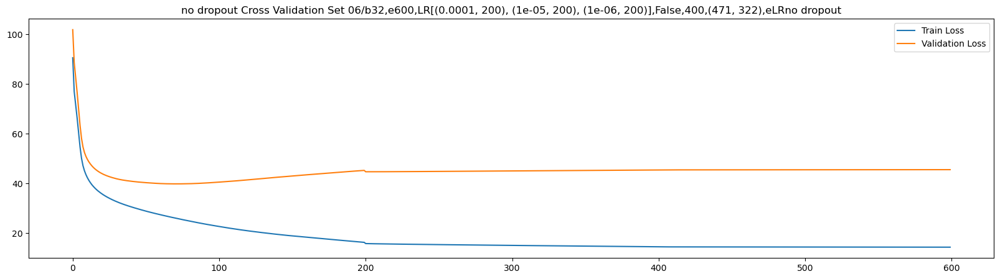

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(422, 187),eLRno dropout


599 Tr:15.04 V:41.88 Te:58.58 65 35.5283 1e-06: 100%|██████████████████████████████████████| 600/600 [01:48<00:00,  5.55it/s]


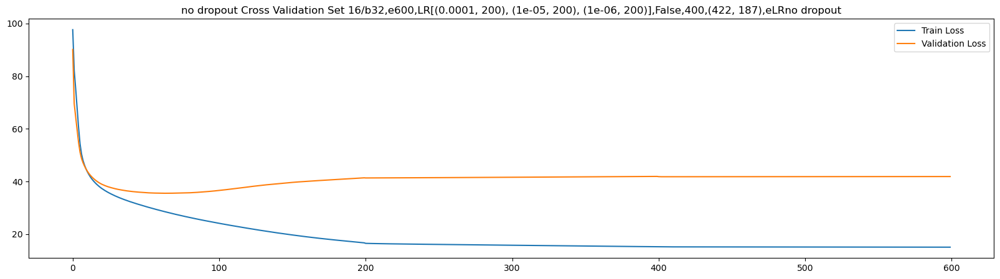

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(145, 201),eLRno dropout


599 Tr:14.29 V:45.37 Te:57.32 74 41.1171 1e-06: 100%|██████████████████████████████████████| 600/600 [01:48<00:00,  5.55it/s]


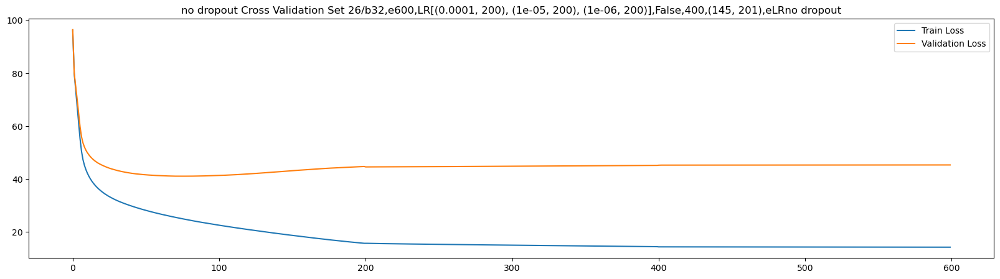

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(246, 115),eLRno dropout


599 Tr:14.85 V:42.6 Te:59.13 59 35.9905 1e-06: 100%|███████████████████████████████████████| 600/600 [01:47<00:00,  5.56it/s]


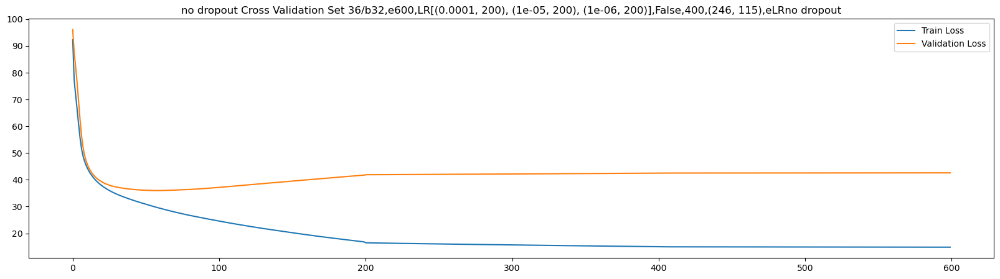

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(27.2950, device='cuda:0') tensor(38.1202, device='cuda:0') tensor(58.1206, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Results with dropout ****************************************************************
models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(471, 322),eLRwd


599 Tr:17.6 V:36.7 Te:51.73 17 36.2135 0.0001: 100%|███████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


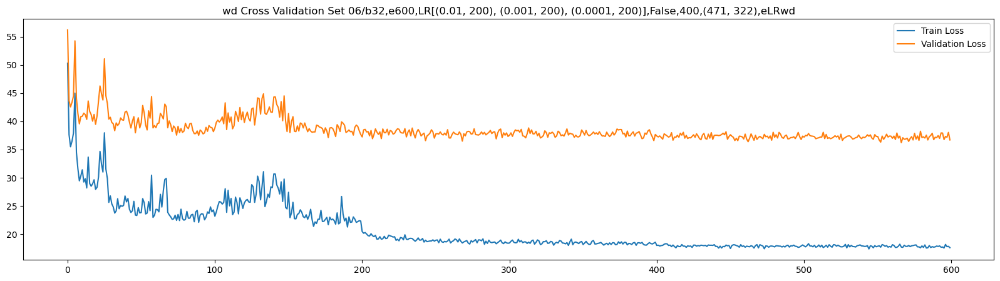

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(422, 187),eLRwd


599 Tr:18.23 V:33.32 Te:54.62 29 31.8873 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.22it/s]


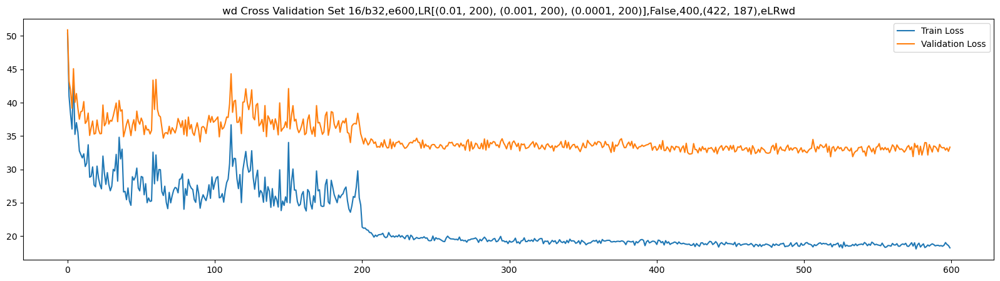

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(145, 201),eLRwd


599 Tr:17.84 V:39.06 Te:52.25 20 38.1667 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


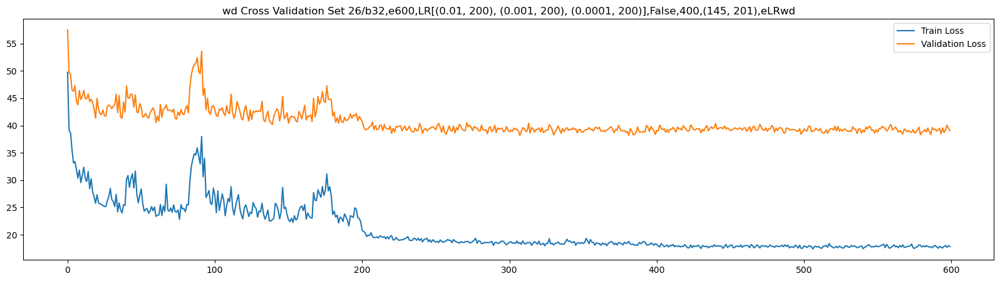

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(246, 115),eLRwd


599 Tr:19.06 V:34.92 Te:53.52 18 33.2567 0.0001: 100%|█████████████████████████████████████| 600/600 [01:54<00:00,  5.22it/s]


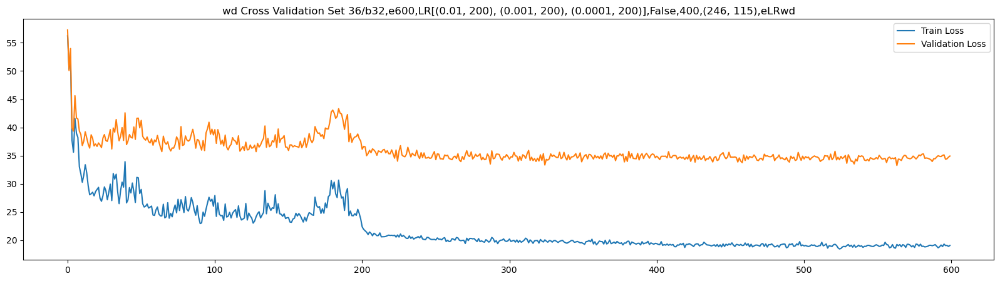

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(18.5954, device='cuda:0') tensor(34.8811, device='cuda:0') tensor(53.5688, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(471, 322),eLRwd


599 Tr:19.48 V:37.58 Te:53.07 27 36.166 1e-05: 100%|███████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


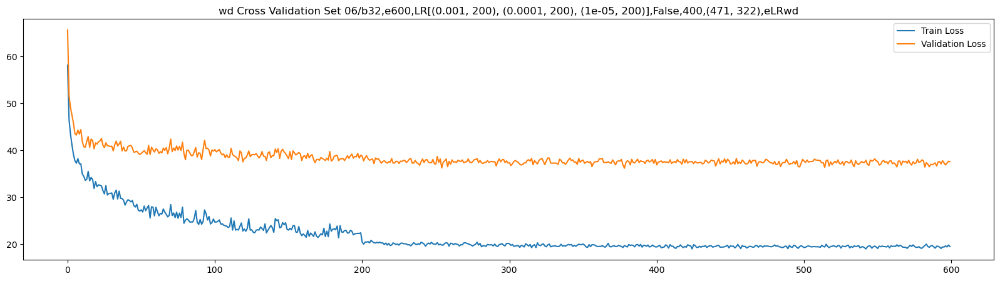

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(422, 187),eLRwd


599 Tr:19.97 V:33.5 Te:55.29 30 32.6126 1e-05: 100%|███████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


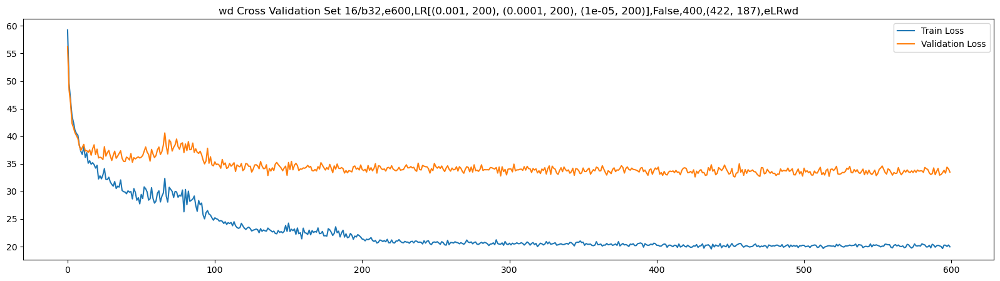

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(145, 201),eLRwd


599 Tr:19.15 V:38.31 Te:51.97 28 37.6496 1e-05: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.22it/s]


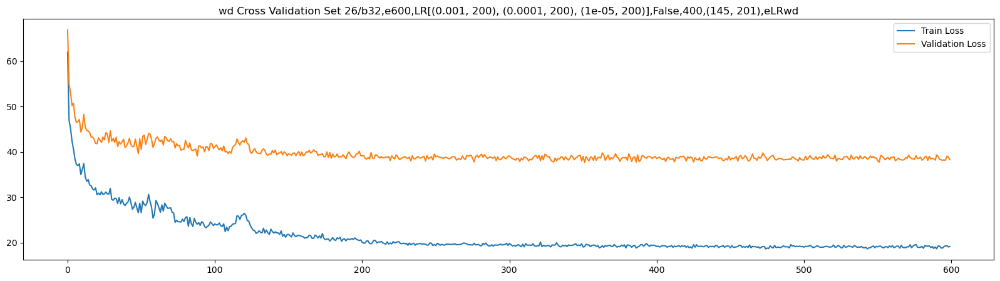

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(246, 115),eLRwd


599 Tr:20.1 V:35.21 Te:54.89 30 33.4848 1e-05: 100%|███████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


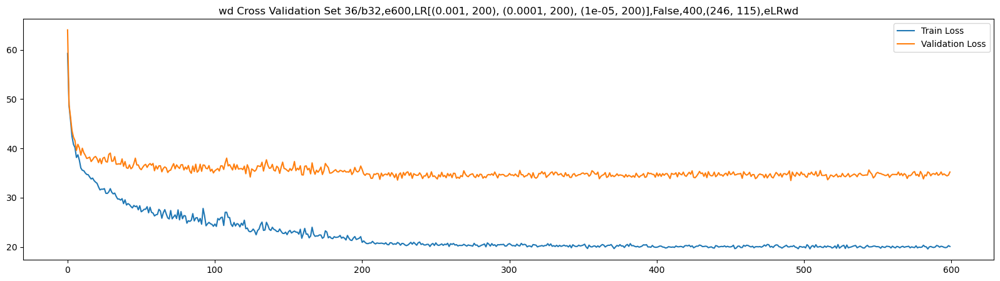

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(19.7334, device='cuda:0') tensor(34.9782, device='cuda:0') tensor(54.0507, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(471, 322),eLRwd


599 Tr:27.61 V:40.72 Te:56.29 48 39.0345 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


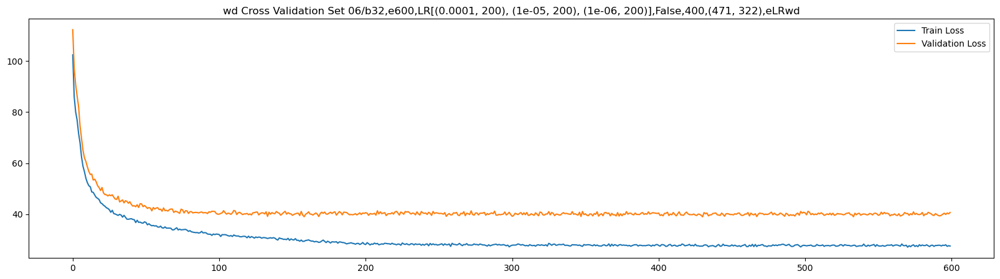

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(422, 187),eLRwd


599 Tr:28.5 V:36.04 Te:57.02 44 34.5383 1e-06: 100%|███████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


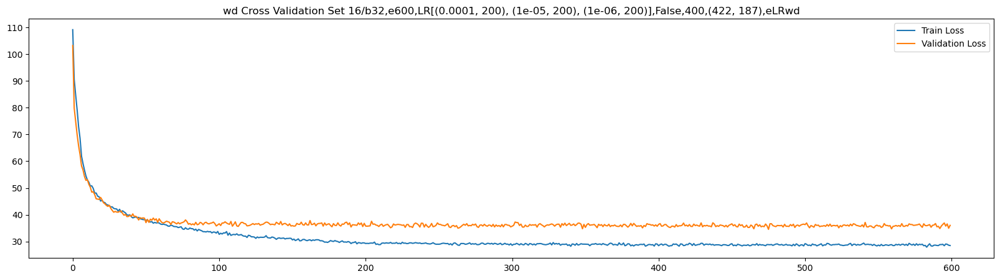

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(145, 201),eLRwd


599 Tr:26.64 V:40.13 Te:54.41 49 39.6594 1e-06: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


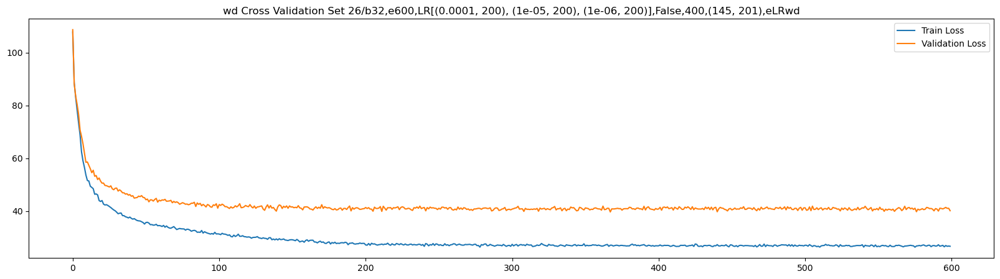

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(246, 115),eLRwd


599 Tr:28.04 V:36.65 Te:57.74 45 35.1099 1e-06: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.24it/s]


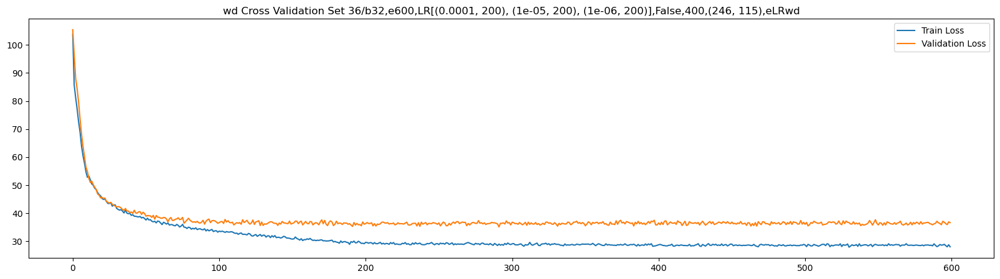

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(28.1115, device='cuda:0') tensor(37.0855, device='cuda:0') tensor(55.9226, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [149]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=1),
    nn.LayerNorm((8, 199, 4)),
    nn.ReLU(),
    # nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 98, 1)),
    nn.ReLU(),
    # nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(392, 2),
    ScaledSigmoid()
).cuda()

thing = test_model(model, train_valid_test_sets, mel_spect=False, f=400,
                 num_to_test=4, epochs=600, lr =[(0.01, 200), (0.001, 200), (0.0001, 200)], gamma=0.99,
                  param="no dropout", saving="use_saved", plot_graph=True)
thing = test_model(model, train_valid_test_sets, mel_spect=False, f=400,
                 num_to_test=4, epochs=600, lr =[(0.001, 200), (0.0001, 200), (0.00001, 200)], gamma=0.99,
                  param="no dropout", saving="use_saved", plot_graph=True)
thing = test_model(model, train_valid_test_sets, mel_spect=False, f=400,
                 num_to_test=4, epochs=600, lr =[(0.0001, 200), (0.00001, 200), (0.000001, 200)], gamma=0.99,
                  param="no dropout", saving="use_saved", plot_graph=True)
print("Results with dropout ****************************************************************")
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=1),
    nn.LayerNorm((8, 199, 4)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 98, 1)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(392, 2),
    ScaledSigmoid()
).cuda()
thing = test_model(model, train_valid_test_sets, mel_spect=False, f=400,
                 num_to_test=4, epochs=600, lr =[(0.01, 200), (0.001, 200), (0.0001, 200)], gamma=0.99,
                  param="wd", saving="use_saved", plot_graph=True)
thing = test_model(model, train_valid_test_sets, mel_spect=False, f=400,
                 num_to_test=4, epochs=600, lr =[(0.001, 200), (0.0001, 200), (0.00001, 200)], gamma=0.99,
                  param="wd", saving="use_saved", plot_graph=True)
thing = test_model(model, train_valid_test_sets, mel_spect=False, f=400,
                 num_to_test=4, epochs=600, lr =[(0.0001, 200), (0.00001, 200), (0.000001, 200)], gamma=0.99,
                  param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,300,(471, 322),eLRwd


599 Tr:17.4 V:37.19 Te:52.04 21 36.7769 0.0001: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


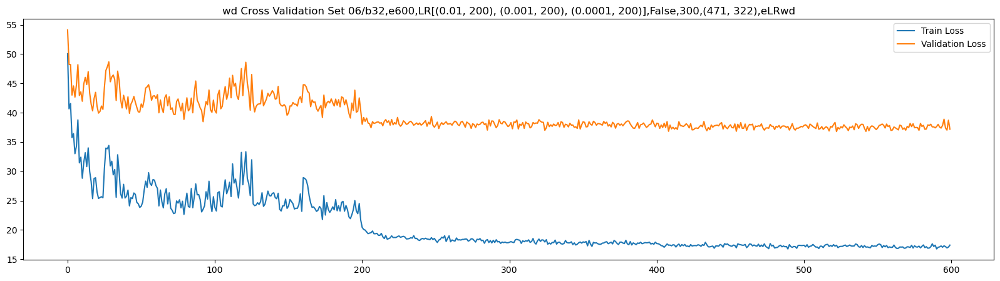

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,300,(422, 187),eLRwd


599 Tr:18.39 V:33.87 Te:55.17 20 32.9802 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


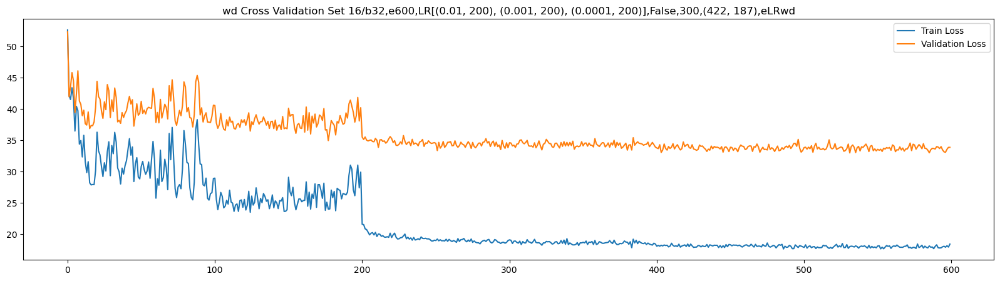

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,300,(145, 201),eLRwd


599 Tr:17.27 V:39.19 Te:51.45 22 38.1892 0.0001: 100%|█████████████████████████████████████| 600/600 [01:54<00:00,  5.22it/s]


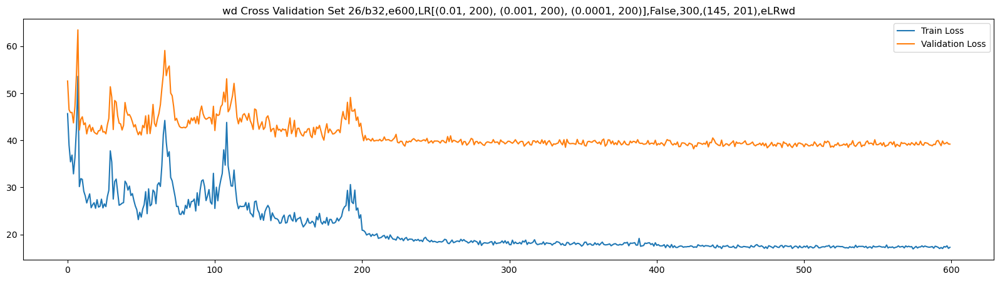

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,300,(246, 115),eLRwd


599 Tr:18.27 V:34.15 Te:52.45 27 33.0991 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


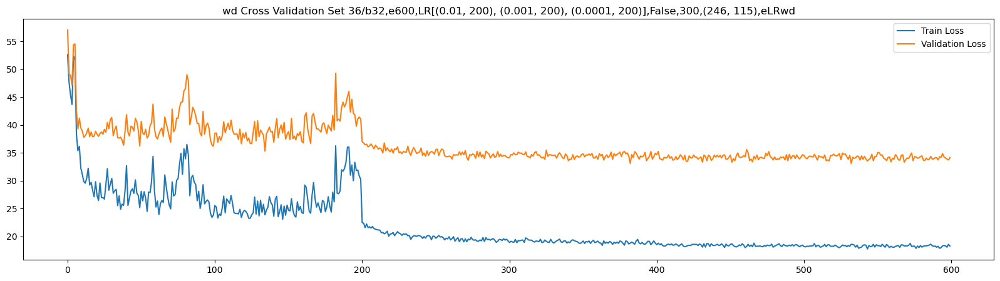

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(17.8060, device='cuda:0') tensor(35.2613, device='cuda:0') tensor(52.6969, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,300,(471, 322),eLRwd


599 Tr:18.63 V:39.34 Te:53.75 25 37.6174 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


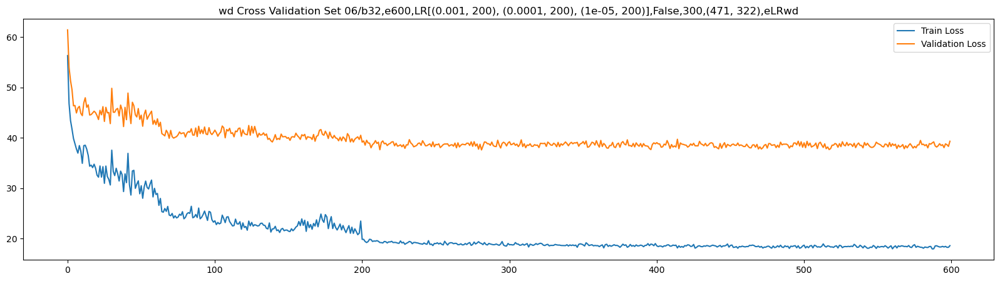

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,300,(422, 187),eLRwd


599 Tr:19.18 V:34.36 Te:53.33 27 33.2484 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


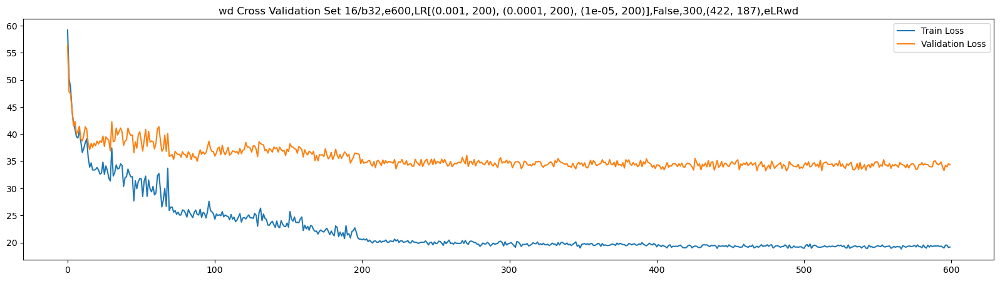

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,300,(145, 201),eLRwd


599 Tr:18.02 V:39.45 Te:50.88 24 38.2982 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.13it/s]


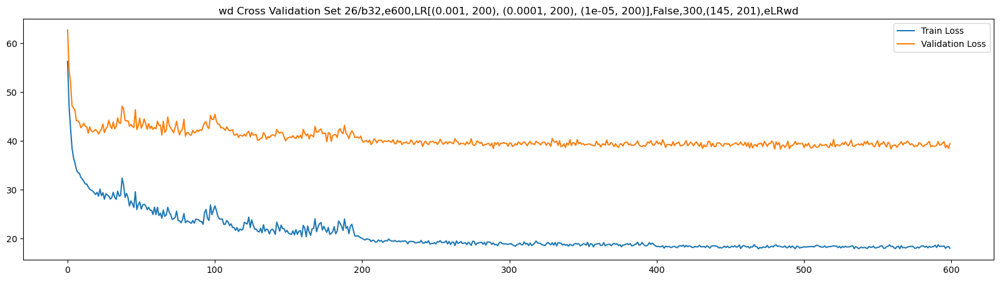

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,300,(246, 115),eLRwd


599 Tr:18.85 V:34.67 Te:54.44 32 34.2718 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.15it/s]


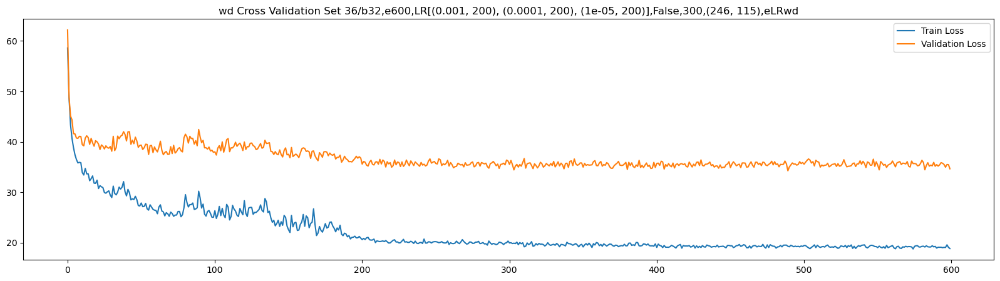

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(19.0830, device='cuda:0') tensor(35.8590, device='cuda:0') tensor(53.3465, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,300,(471, 322),eLRwd


599 Tr:26.18 V:41.79 Te:53.57 52 40.0105 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


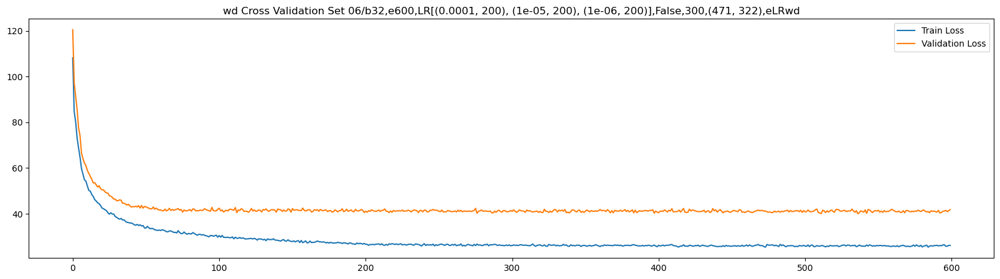

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,300,(422, 187),eLRwd


599 Tr:27.22 V:36.52 Te:56.23 46 34.8502 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


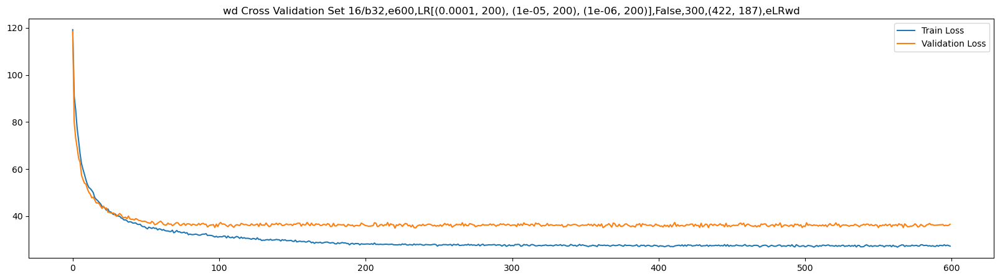

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,300,(145, 201),eLRwd


599 Tr:25.3 V:41.2 Te:53.28 42 39.8213 1e-06: 100%|████████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


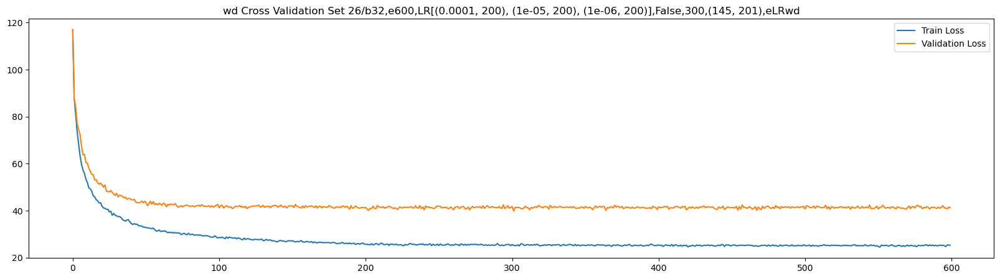

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,300,(246, 115),eLRwd


599 Tr:27.27 V:36.5 Te:56.11 44 35.871 1e-06: 100%|████████████████████████████████████████| 600/600 [01:55<00:00,  5.22it/s]


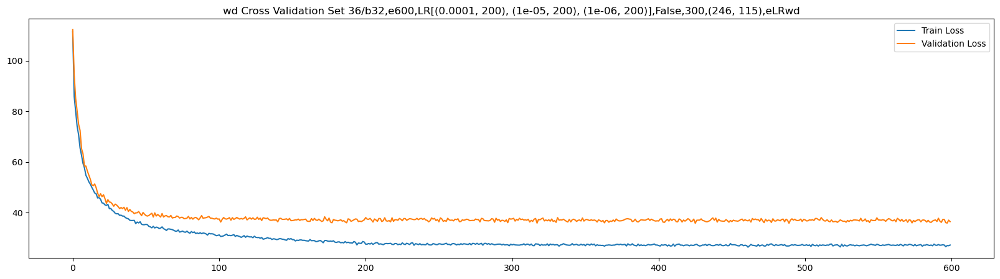

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(26.5711, device='cuda:0') tensor(37.6382, device='cuda:0') tensor(54.8442, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,300,(471, 322),eLRwd


599 Tr:39.25 V:46.62 Te:60.59 85 44.8519 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:56<00:00,  5.17it/s]


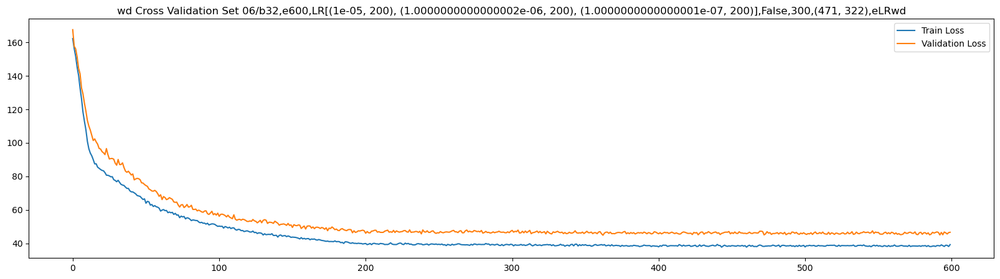

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,300,(422, 187),eLRwd


599 Tr:39.8 V:40.05 Te:61.34 87 38.6395 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:55<00:00,  5.19it/s]


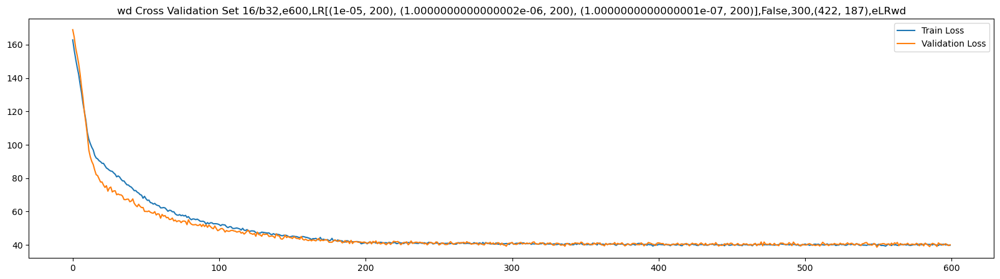

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,300,(145, 201),eLRwd


599 Tr:37.32 V:47.26 Te:61.25 92 45.5666 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:56<00:00,  5.17it/s]


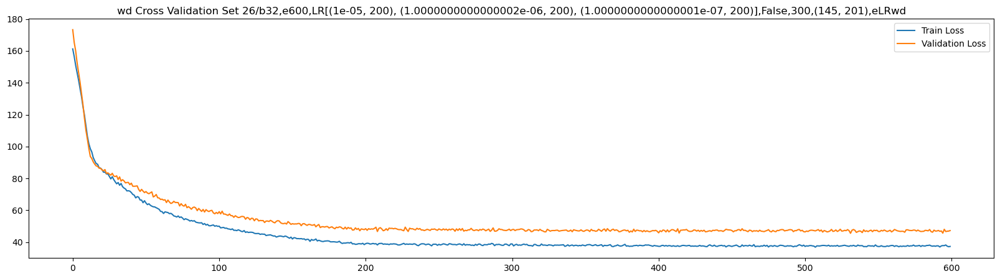

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,300,(246, 115),eLRwd


599 Tr:39.55 V:43.02 Te:62.11 89 42.1269 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.20it/s]


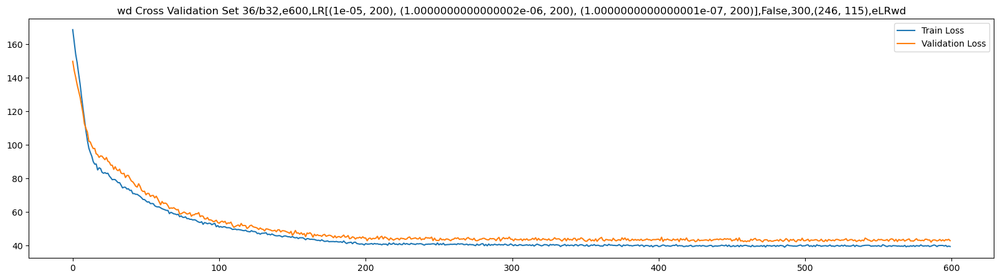

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(39.0408, device='cuda:0') tensor(42.7962, device='cuda:0') tensor(61.4582, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,300,(471, 322),eLRwd


599 Tr:80.02 V:93.17 Te:105.39 89 89.6104 1e-08: 100%|█████████████████████████████████████| 600/600 [01:56<00:00,  5.17it/s]


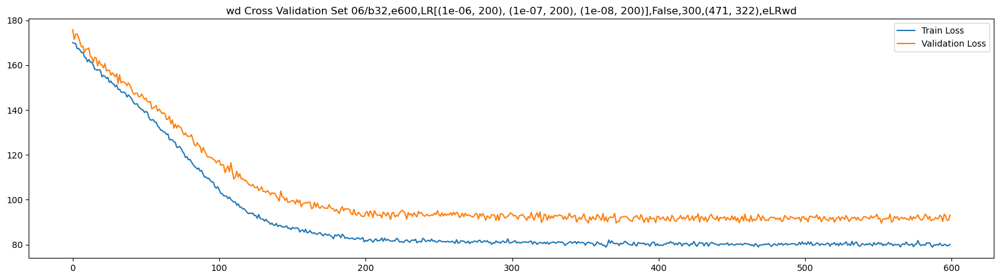

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,300,(422, 187),eLRwd


599 Tr:85.06 V:73.61 Te:104.72 99 72.2992 1e-08: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


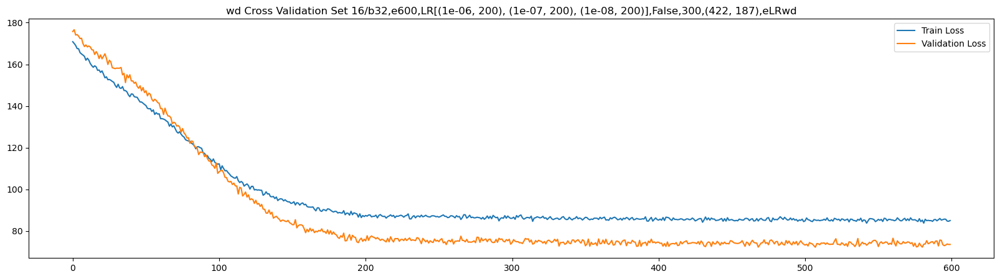

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,300,(145, 201),eLRwd


599 Tr:81.06 V:83.46 Te:103.67 97 81.4111 1e-08: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


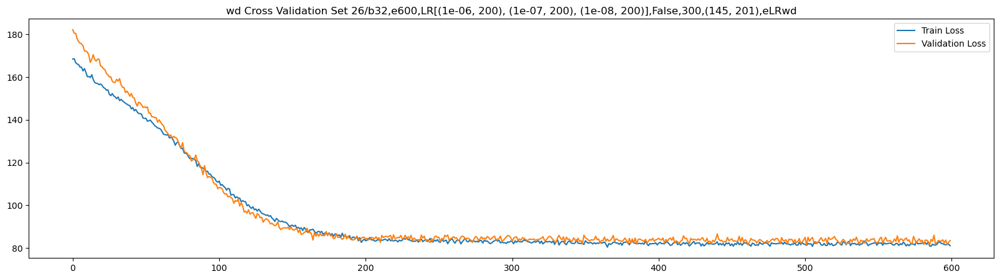

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,300,(246, 115),eLRwd


599 Tr:80.86 V:90.62 Te:105.56 73 86.9284 1e-08: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


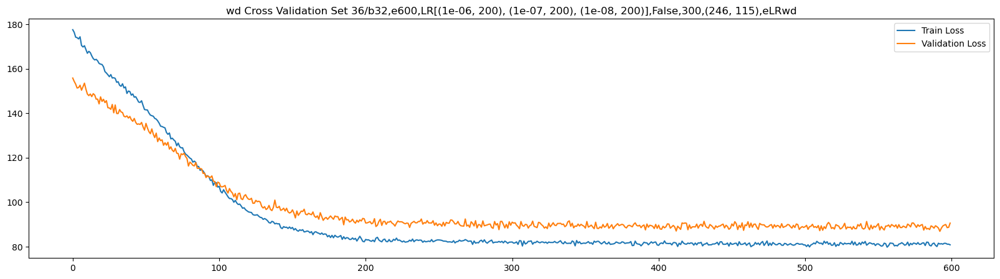

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(82.1041, device='cuda:0') tensor(82.5623, device='cuda:0') tensor(104.7741, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [150]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=1),
    nn.LayerNorm((8, 149, 6)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 73, 2)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(584, 2),
    ScaledSigmoid()
).cuda()
f = 300
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,200,(471, 322),eLRwd


599 Tr:17.5 V:39.88 Te:52.37 18 38.5888 0.0001: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


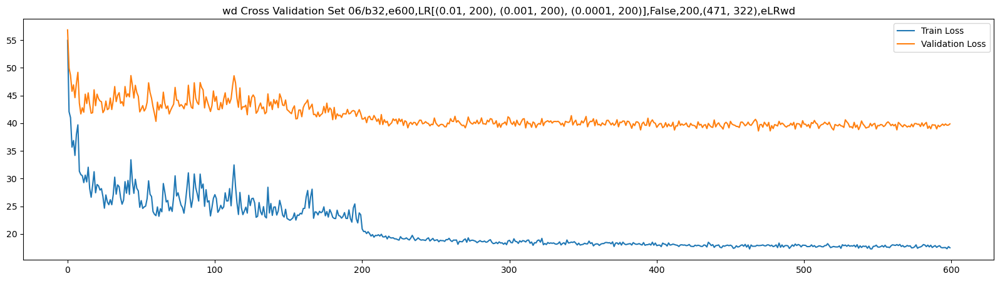

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,200,(422, 187),eLRwd


599 Tr:18.16 V:34.6 Te:53.63 19 33.2889 0.0001: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


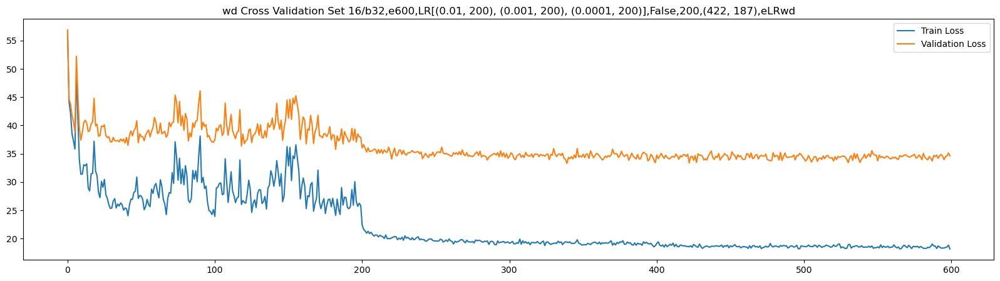

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,200,(145, 201),eLRwd


599 Tr:17.8 V:39.6 Te:51.23 22 37.7972 0.0001: 100%|███████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


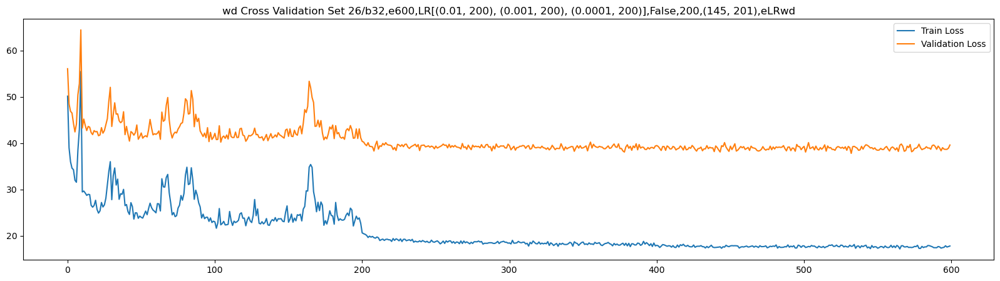

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,200,(246, 115),eLRwd


599 Tr:18.7 V:34.91 Te:53.54 28 33.8504 0.0001: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


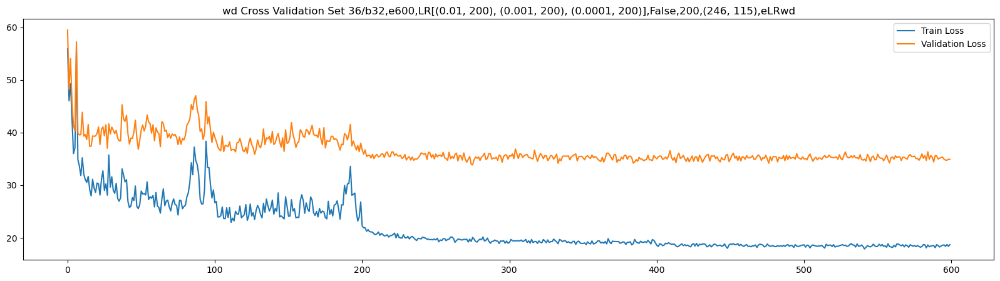

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(18.7581, device='cuda:0') tensor(35.8813, device='cuda:0') tensor(52.5556, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,200,(471, 322),eLRwd


599 Tr:19.08 V:38.94 Te:54.06 24 38.4156 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


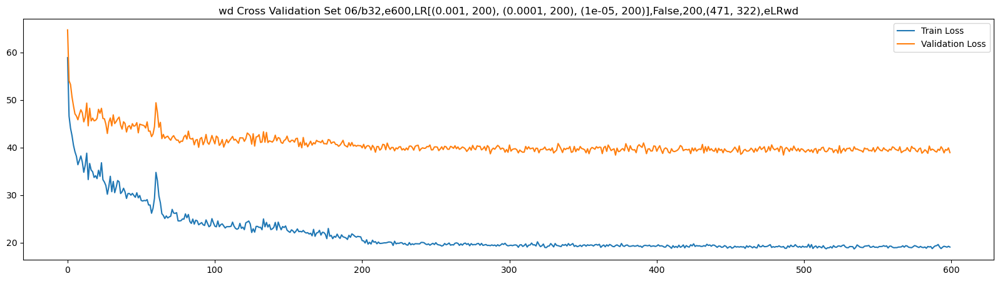

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,200,(422, 187),eLRwd


599 Tr:19.88 V:35.03 Te:54.49 22 34.1803 1e-05: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.22it/s]


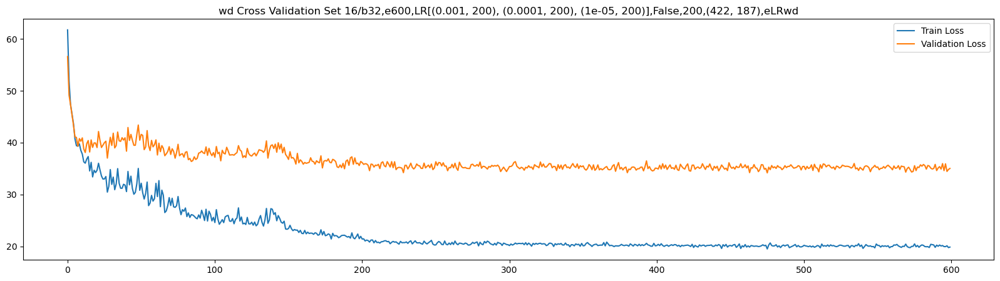

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,200,(145, 201),eLRwd


599 Tr:19.11 V:40.24 Te:52.61 32 39.5443 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


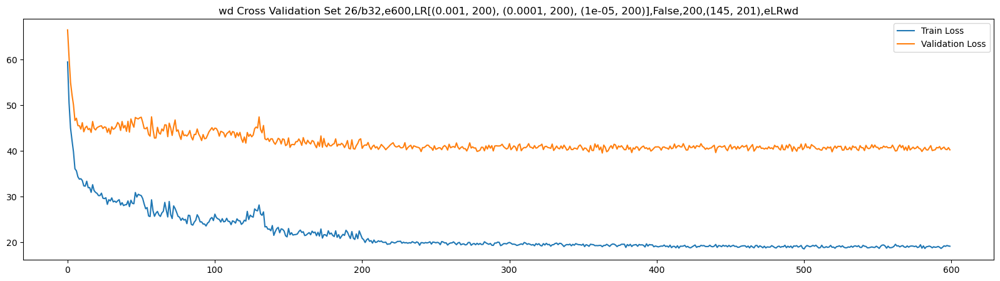

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,200,(246, 115),eLRwd


599 Tr:20.04 V:35.73 Te:55.37 32 34.6511 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


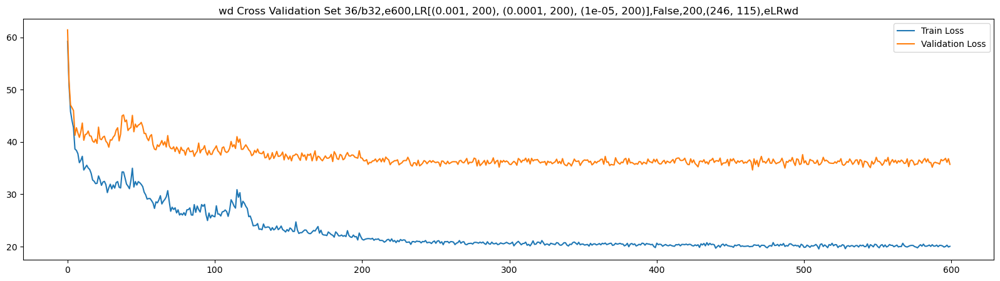

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(19.4884, device='cuda:0') tensor(36.6978, device='cuda:0') tensor(54.2552, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,200,(471, 322),eLRwd


599 Tr:26.51 V:40.17 Te:55.7 47 39.687 1e-06: 100%|████████████████████████████████████████| 600/600 [01:55<00:00,  5.17it/s]


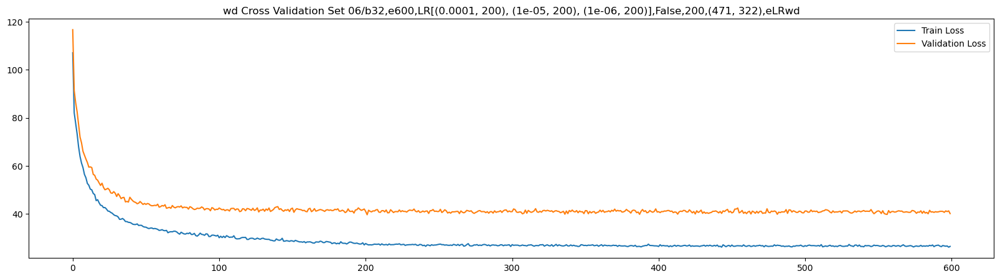

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,200,(422, 187),eLRwd


599 Tr:27.96 V:36.92 Te:57.85 45 35.9348 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


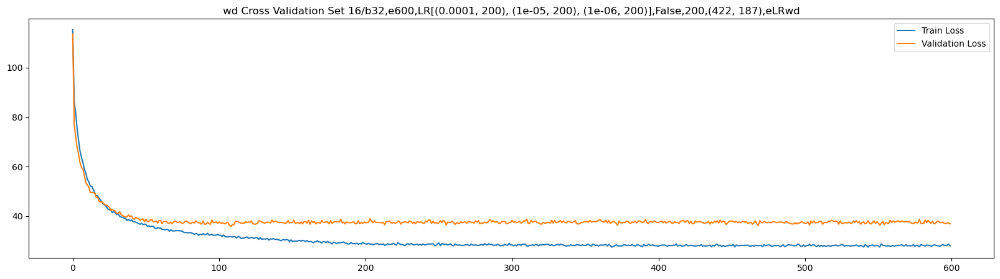

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,200,(145, 201),eLRwd


599 Tr:25.76 V:43.92 Te:55.12 43 41.7667 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


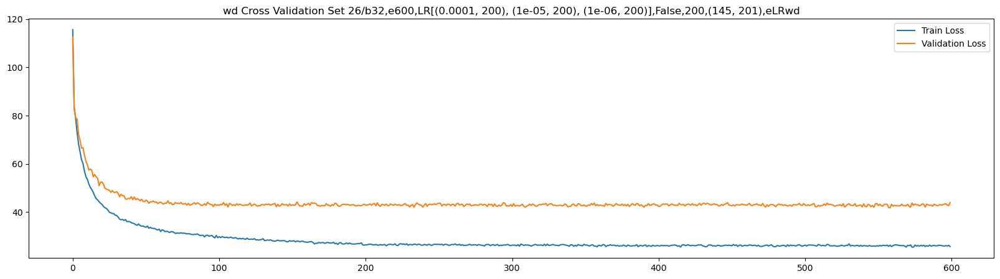

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,200,(246, 115),eLRwd


599 Tr:28.3 V:38.78 Te:56.85 38 36.8963 1e-06: 100%|███████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


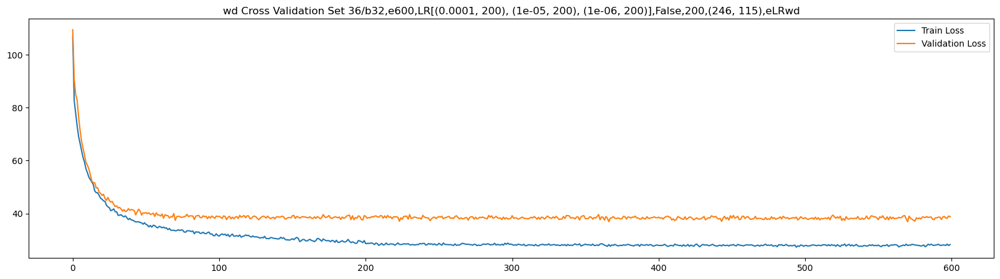

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(28.3252, device='cuda:0') tensor(38.5712, device='cuda:0') tensor(56.2392, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,200,(471, 322),eLRwd


599 Tr:39.33 V:48.02 Te:63.12 89 46.8685 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.19it/s]


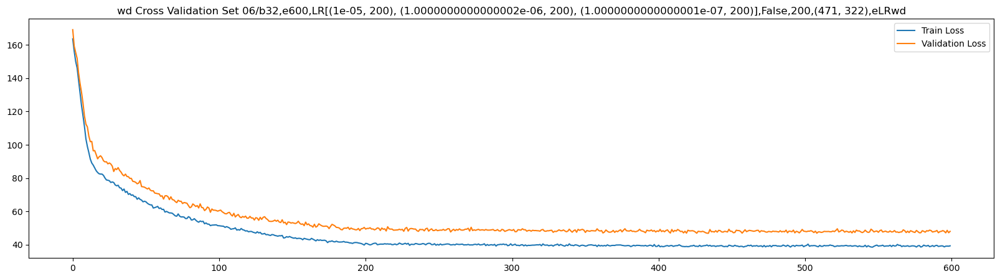

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,200,(422, 187),eLRwd


599 Tr:40.9 V:42.66 Te:64.02 80 40.3857 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:56<00:00,  5.16it/s]


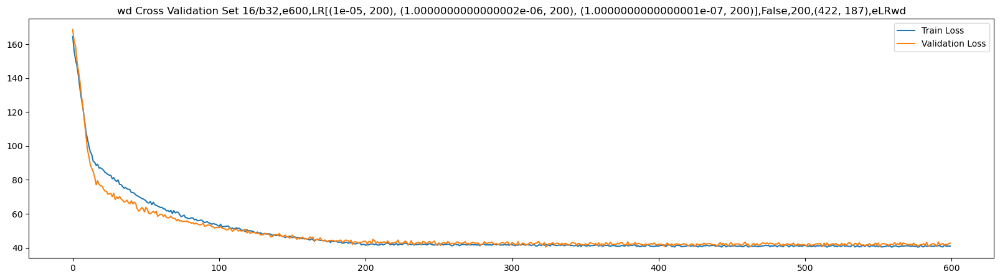

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,200,(145, 201),eLRwd


599 Tr:38.66 V:47.93 Te:62.09 86 46.1278 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.20it/s]


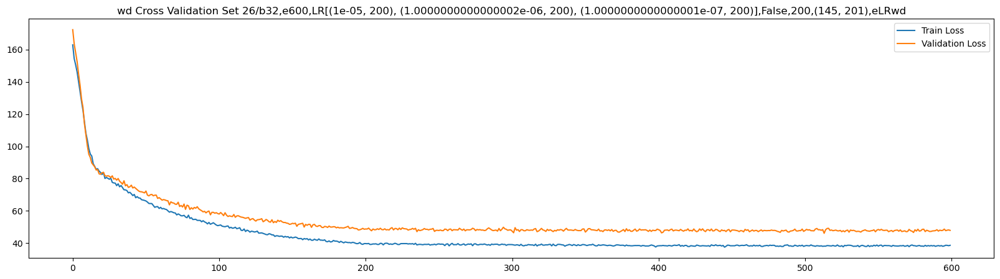

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,200,(246, 115),eLRwd


599 Tr:40.29 V:43.29 Te:63.72 84 42.1515 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.17it/s]


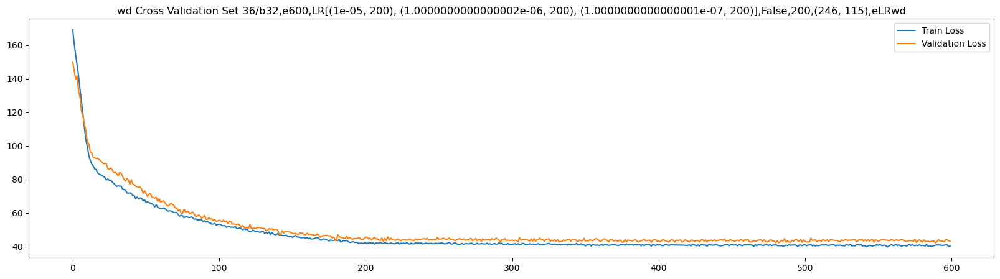

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(40.0744, device='cuda:0') tensor(43.8834, device='cuda:0') tensor(63.5517, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,200,(471, 322),eLRwd


599 Tr:78.82 V:88.62 Te:102.28 93 84.4965 1e-08: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


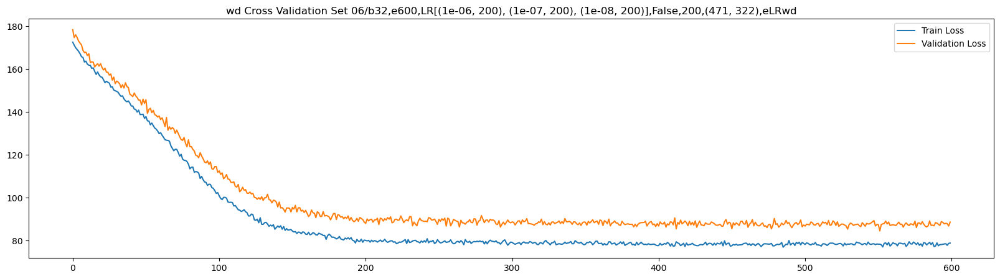

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,200,(422, 187),eLRwd


599 Tr:82.54 V:72.61 Te:102.91 105 69.7424 1e-08: 100%|████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


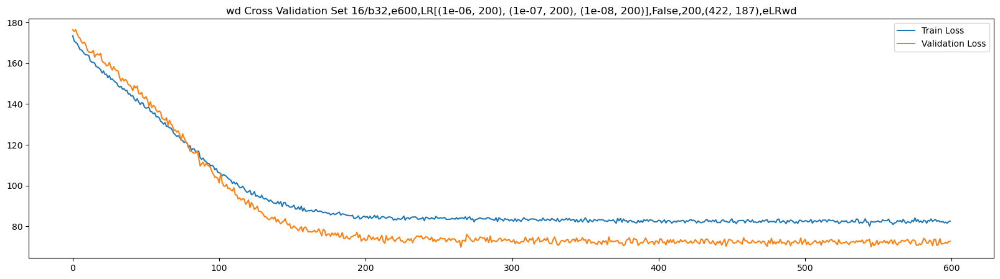

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,200,(145, 201),eLRwd


599 Tr:80.29 V:80.89 Te:101.13 101 78.2799 1e-08: 100%|████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


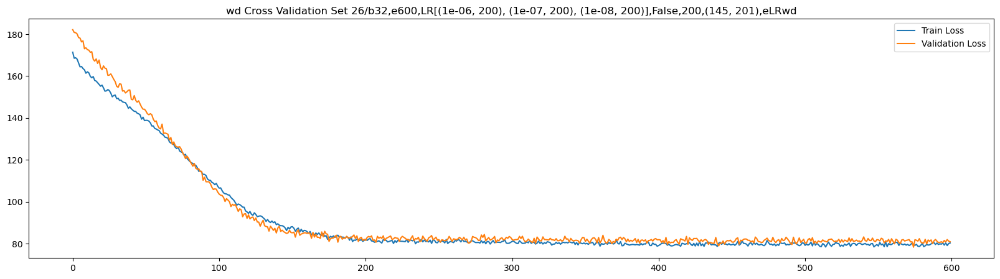

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,200,(246, 115),eLRwd


599 Tr:78.78 V:89.25 Te:104.79 82 83.9786 1e-08: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


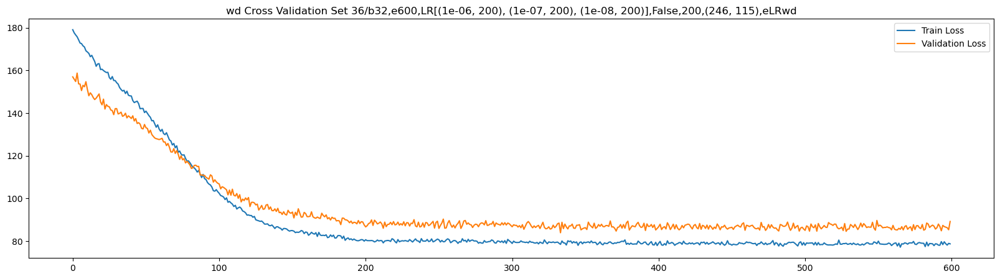

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(80.0575, device='cuda:0') tensor(79.1244, device='cuda:0') tensor(102.8893, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [151]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=1),
    nn.LayerNorm((8, 99, 9)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 48, 3)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(576, 2),
    ScaledSigmoid()
).cuda()
f = 200
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,500,(471, 322),eLRwd


599 Tr:412.36 V:416.51 Te:441.41 1 416.5146 0.0001: 100%|██████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


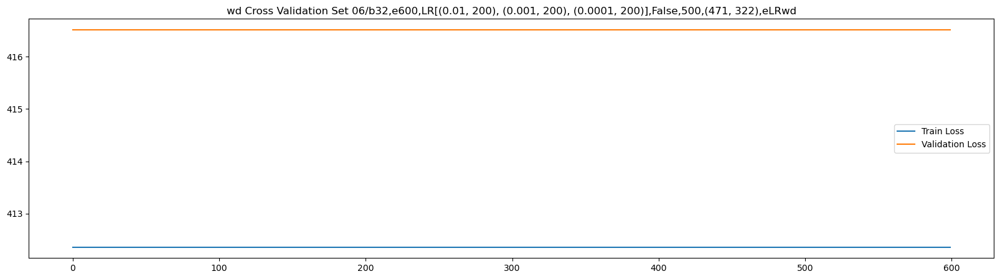

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,500,(422, 187),eLRwd


599 Tr:369.58 V:380.64 Te:405.49 1 380.6386 0.0001: 100%|██████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


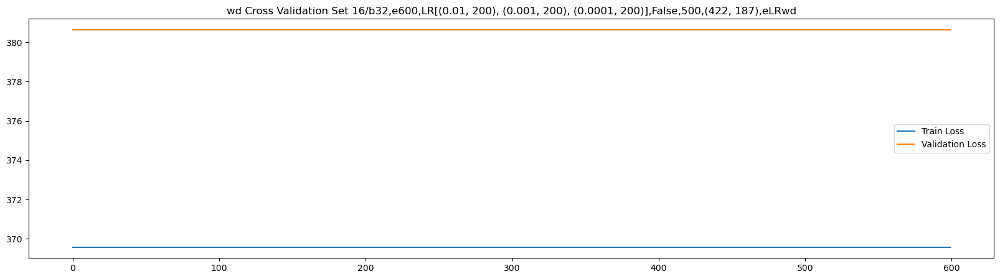

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,500,(145, 201),eLRwd


599 Tr:384.01 V:337.35 Te:405.49 1 337.3459 0.0001: 100%|██████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


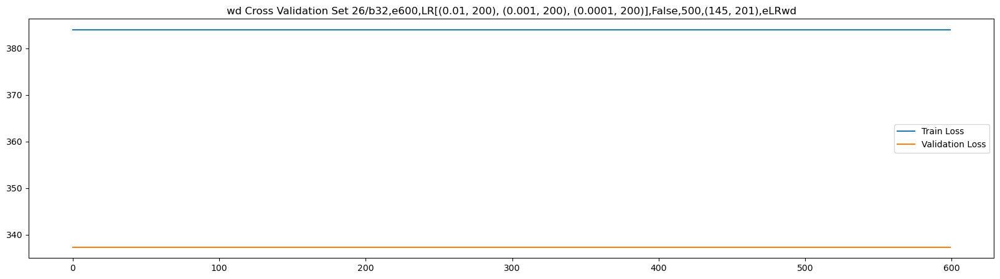

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,500,(246, 115),eLRwd


599 Tr:407.91 V:429.86 Te:441.41 1 429.8646 0.0001: 100%|██████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


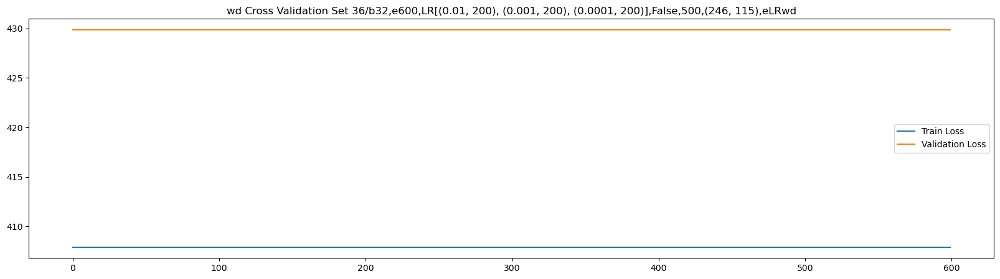

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(393.4645, device='cuda:0') tensor(391.0909, device='cuda:0') tensor(423.4543, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,500,(471, 322),eLRwd


599 Tr:17.07 V:41.88 Te:56.86 30 40.0126 1e-05: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


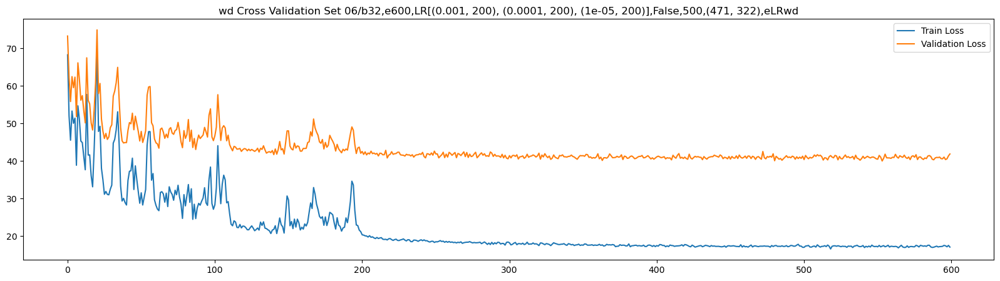

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,500,(422, 187),eLRwd


599 Tr:18.04 V:35.67 Te:58.23 31 34.9507 1e-05: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.24it/s]


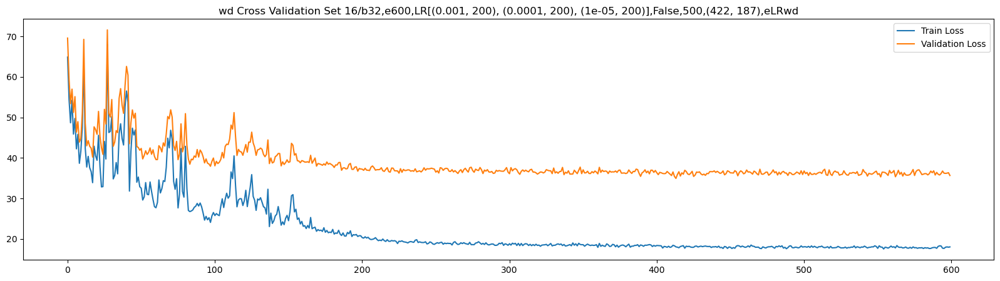

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,500,(145, 201),eLRwd


599 Tr:16.71 V:40.69 Te:55.56 29 39.2602 1e-05: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


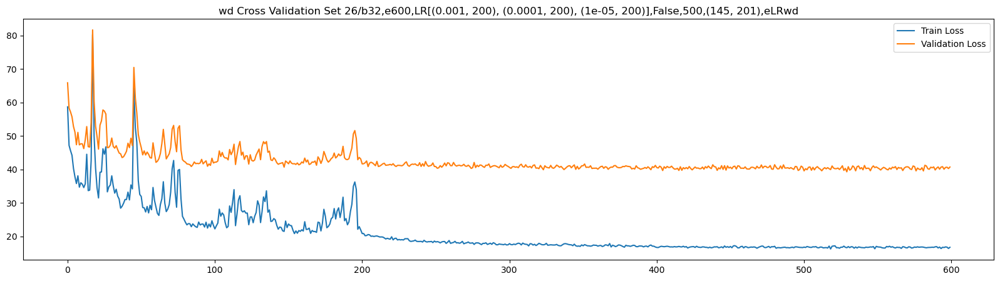

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,500,(246, 115),eLRwd


599 Tr:17.79 V:35.17 Te:58.87 28 34.6757 1e-05: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.25it/s]


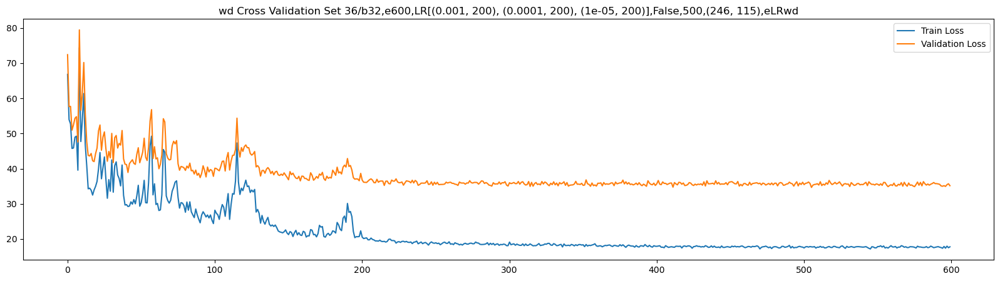

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(17.4376, device='cuda:0') tensor(37.2248, device='cuda:0') tensor(57.6213, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,500,(471, 322),eLRwd


599 Tr:24.33 V:43.25 Te:61.37 47 42.2017 1e-06: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.22it/s]


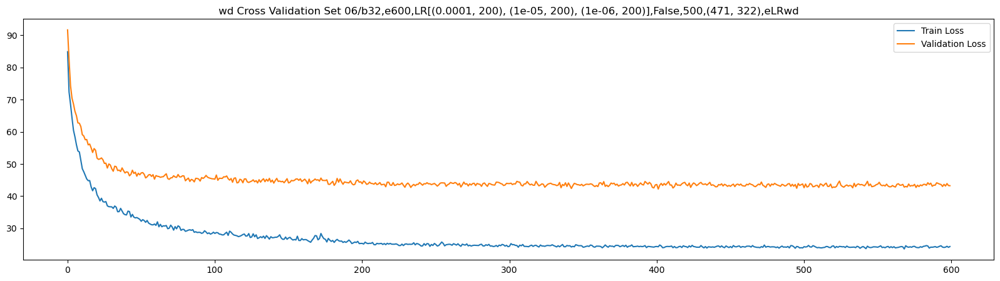

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,500,(422, 187),eLRwd


599 Tr:25.33 V:38.72 Te:60.52 51 37.7098 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


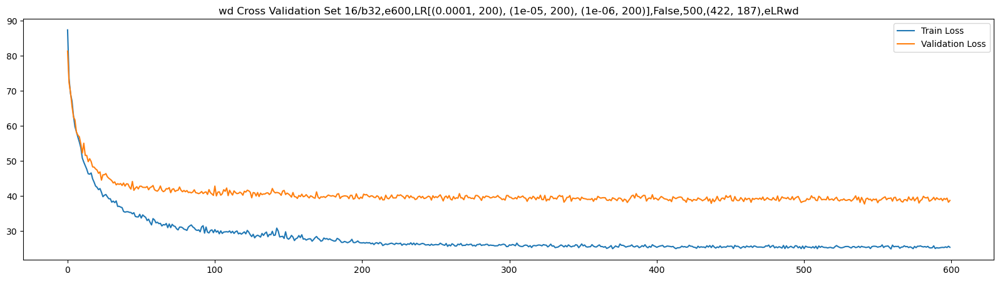

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,500,(145, 201),eLRwd


599 Tr:23.88 V:42.83 Te:58.99 48 41.0327 1e-06: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


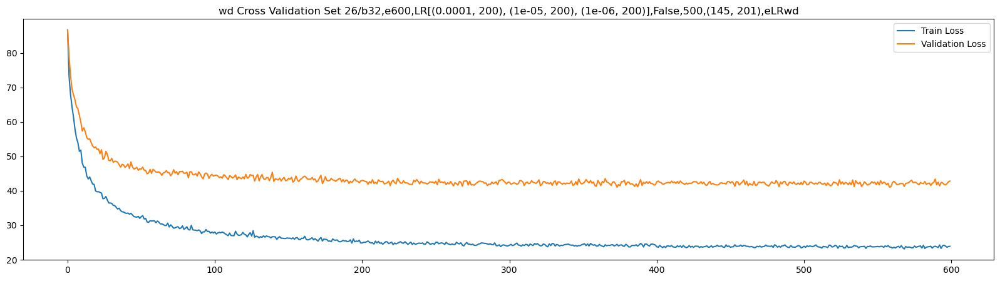

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,500,(246, 115),eLRwd


599 Tr:25.04 V:38.98 Te:61.17 48 38.0899 1e-06: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


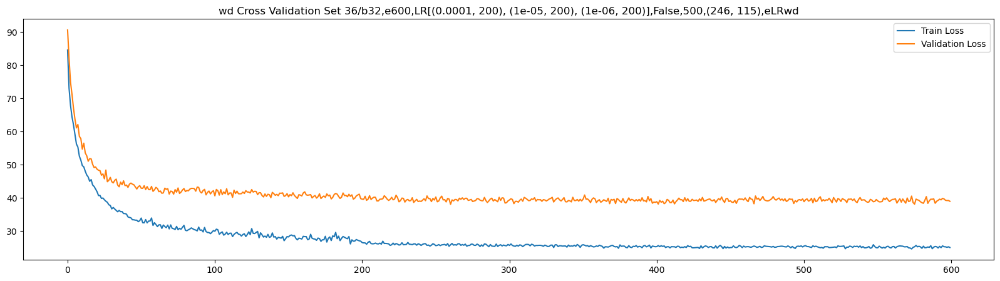

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(24.8075, device='cuda:0') tensor(39.7585, device='cuda:0') tensor(60.2335, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,500,(471, 322),eLRwd


599 Tr:35.94 V:48.3 Te:66.11 79 46.5597 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:54<00:00,  5.22it/s]


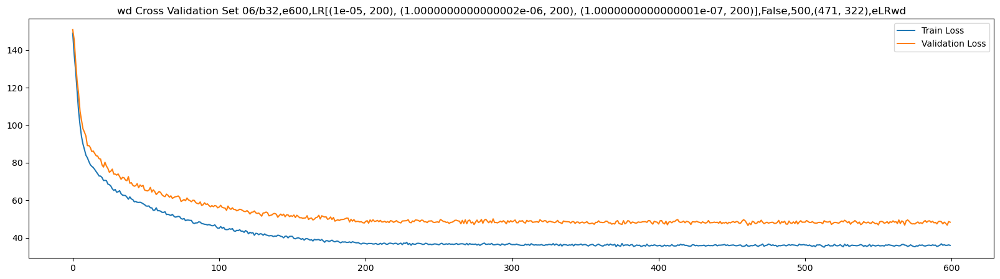

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,500,(422, 187),eLRwd


599 Tr:36.64 V:43.84 Te:66.3 64 42.6332 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:55<00:00,  5.19it/s]


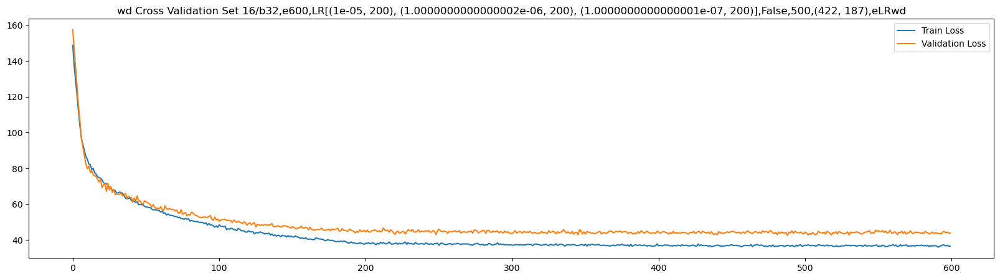

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,500,(145, 201),eLRwd


599 Tr:35.56 V:48.53 Te:65.03 74 46.6305 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.17it/s]


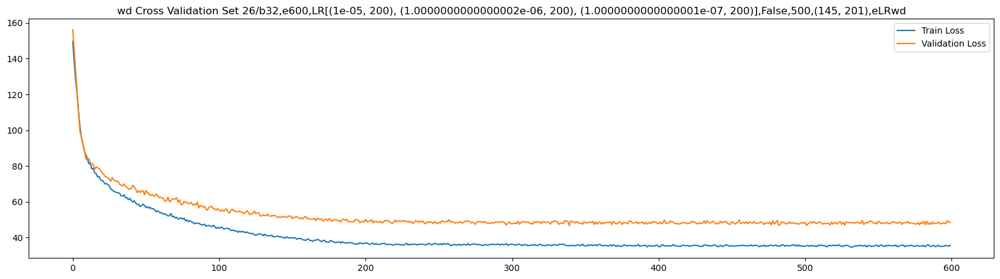

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,500,(246, 115),eLRwd


599 Tr:36.58 V:45.18 Te:66.85 69 44.3158 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.19it/s]


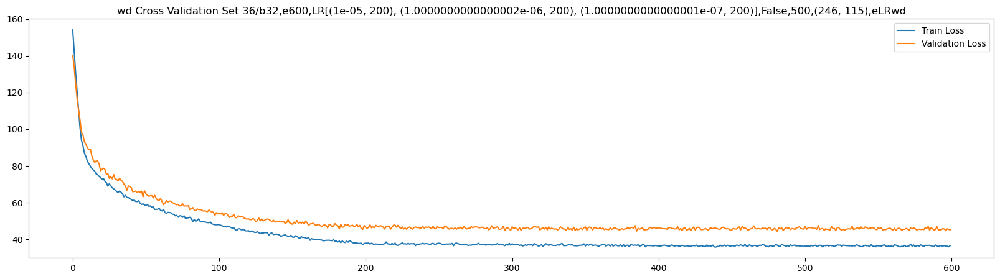

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(36.1981, device='cuda:0') tensor(45.0348, device='cuda:0') tensor(65.6751, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,500,(471, 322),eLRwd


599 Tr:68.25 V:77.04 Te:91.94 74 74.1564 1e-08: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


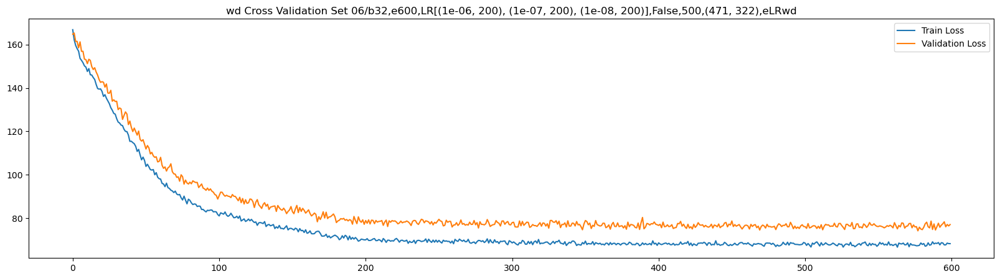

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,500,(422, 187),eLRwd


599 Tr:69.47 V:69.13 Te:92.38 81 66.1913 1e-08: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


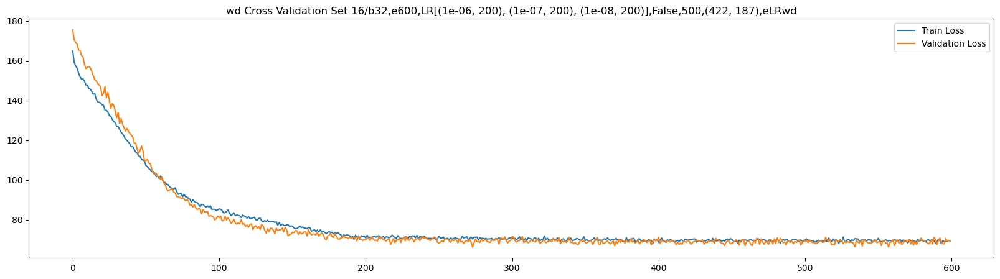

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,500,(145, 201),eLRwd


599 Tr:67.78 V:72.59 Te:91.44 86 70.439 1e-08: 100%|███████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


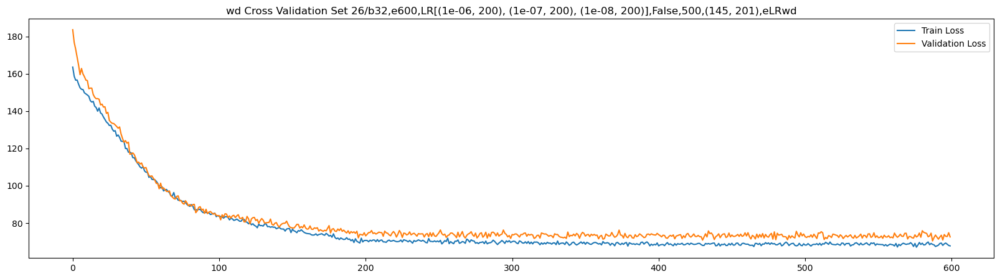

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,500,(246, 115),eLRwd


599 Tr:69.03 V:74.88 Te:94.52 80 72.4121 1e-08: 100%|██████████████████████████████████████| 600/600 [01:54<00:00,  5.23it/s]


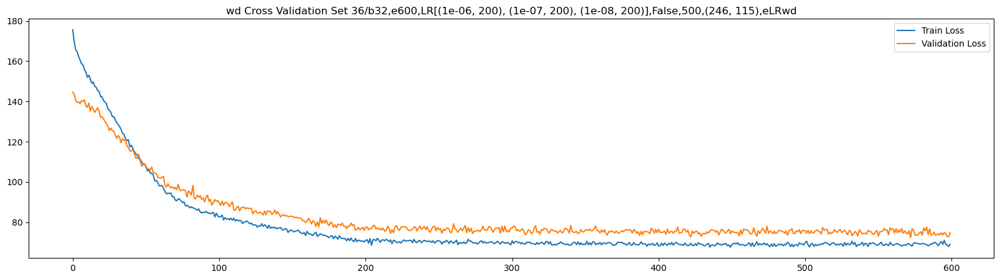

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(68.7082, device='cuda:0') tensor(70.7997, device='cuda:0') tensor(91.9610, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [152]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=1, stride=1),
    nn.LayerNorm((8, 251, 5)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=1),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 249, 3)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(2988, 2),
    ScaledSigmoid()
).cuda()
f = 500
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,600,(471, 322),eLRwd


599 Tr:18.71 V:41.79 Te:55.75 31 39.9062 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


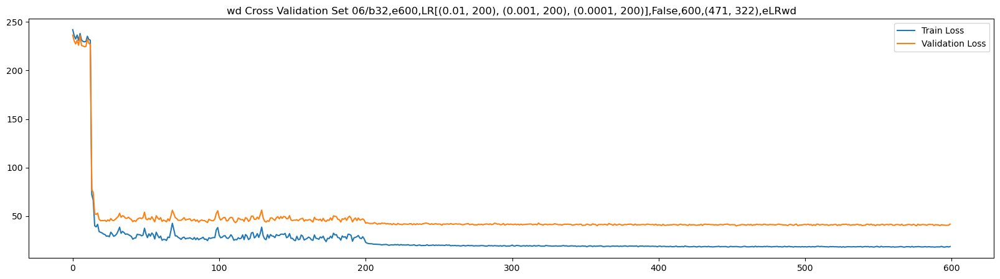

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,600,(422, 187),eLRwd


599 Tr:369.58 V:380.64 Te:405.49 1 380.6386 0.0001: 100%|██████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


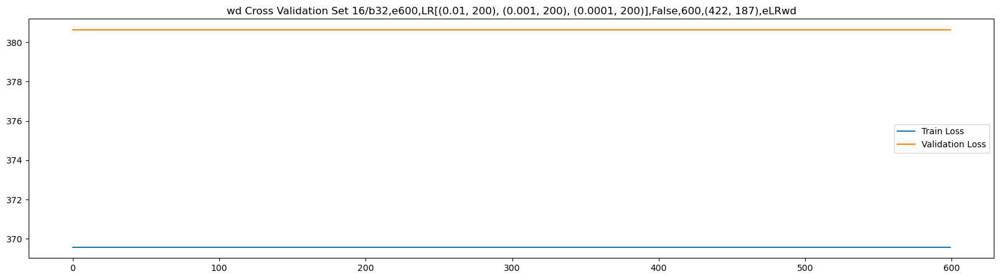

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,600,(145, 201),eLRwd


599 Tr:230.31 V:221.2 Te:238.38 63 221.1489 0.0001: 100%|██████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


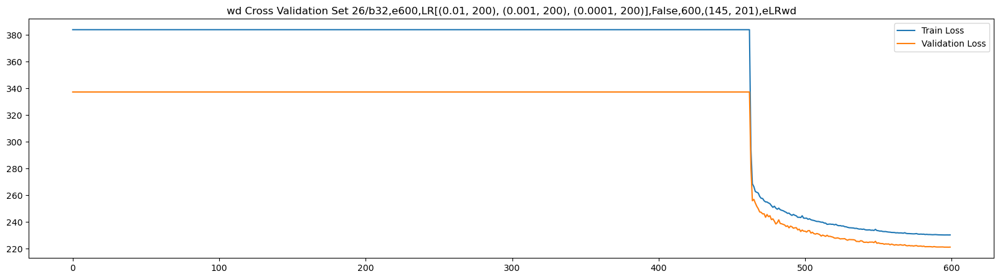

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,600,(246, 115),eLRwd


599 Tr:19.25 V:36.47 Te:56.36 29 35.1182 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


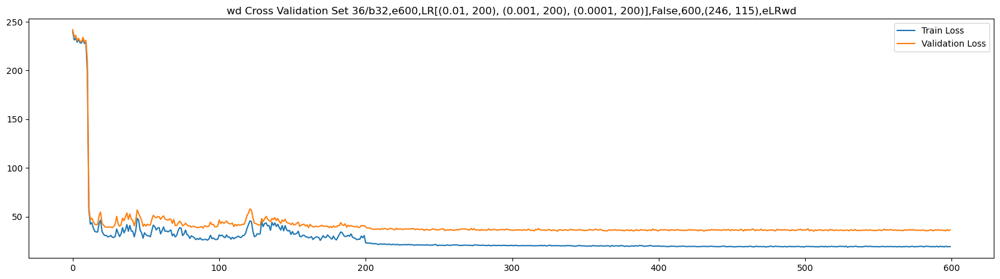

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(159.7017, device='cuda:0') tensor(169.2030, device='cuda:0') tensor(189.0675, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,600,(471, 322),eLRwd


599 Tr:17.47 V:39.18 Te:56.12 32 38.7439 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


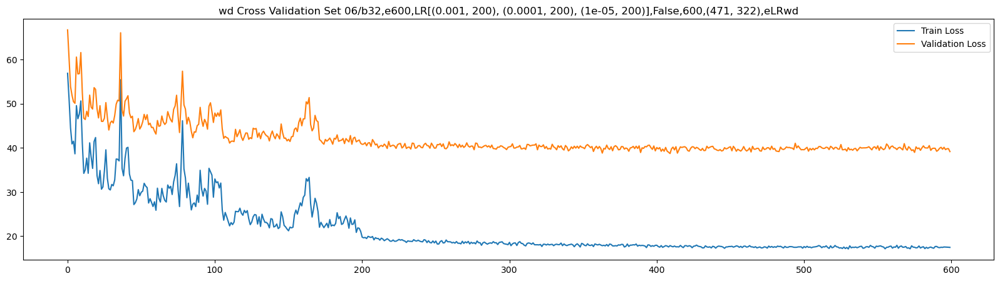

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,600,(422, 187),eLRwd


599 Tr:18.44 V:34.76 Te:57.85 34 34.3359 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


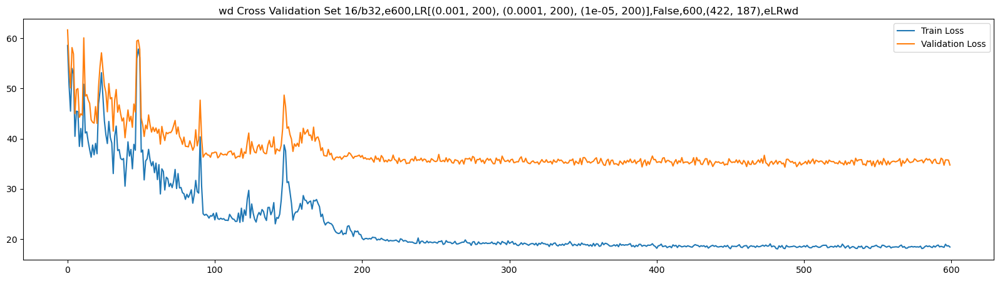

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,600,(145, 201),eLRwd


599 Tr:16.94 V:41.11 Te:56.12 22 39.7088 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


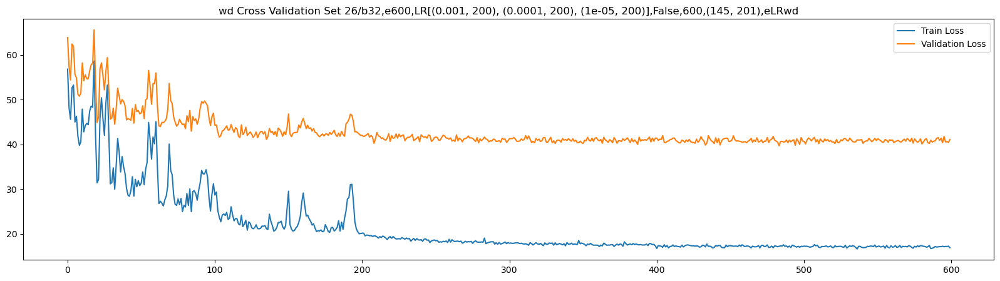

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,600,(246, 115),eLRwd


599 Tr:18.55 V:34.65 Te:56.76 32 34.2375 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.14it/s]


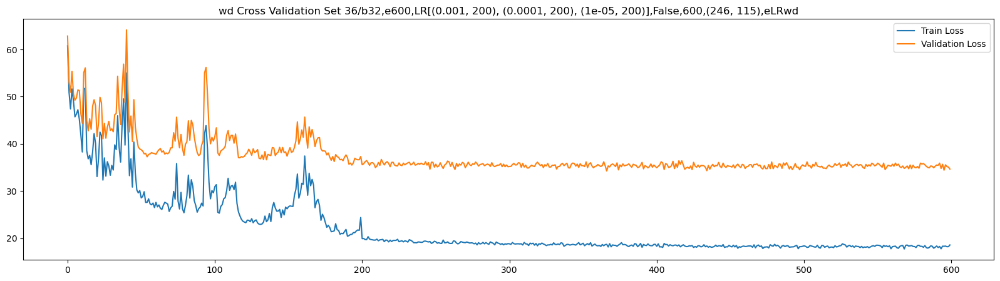

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(17.9779, device='cuda:0') tensor(36.7565, device='cuda:0') tensor(56.5060, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,600,(471, 322),eLRwd


599 Tr:25.34 V:42.44 Te:60.02 49 41.3882 1e-06: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


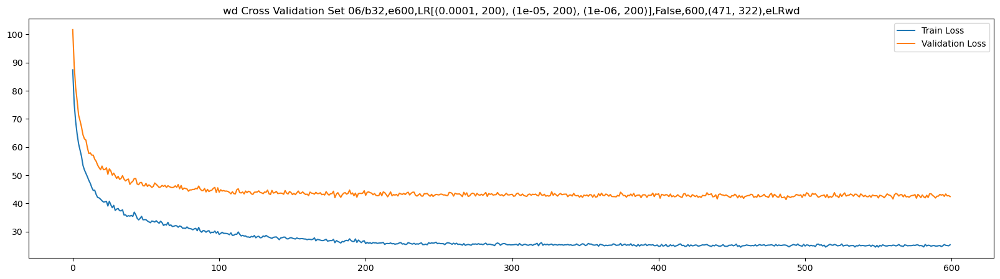

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,600,(422, 187),eLRwd


599 Tr:26.58 V:38.31 Te:61.29 43 37.5787 1e-06: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.14it/s]


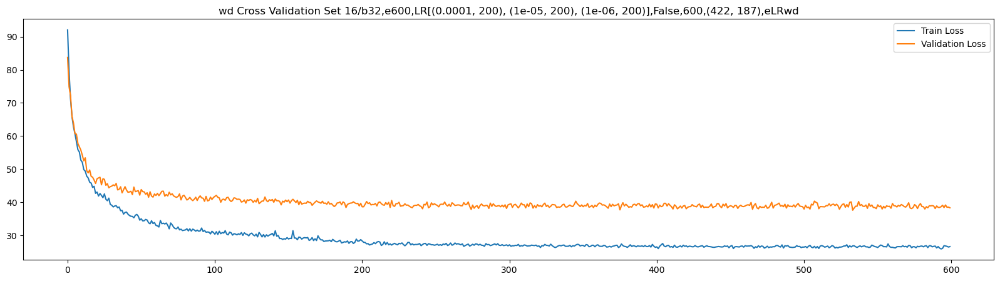

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,600,(145, 201),eLRwd


599 Tr:24.85 V:42.01 Te:60.25 41 41.1735 1e-06: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.15it/s]


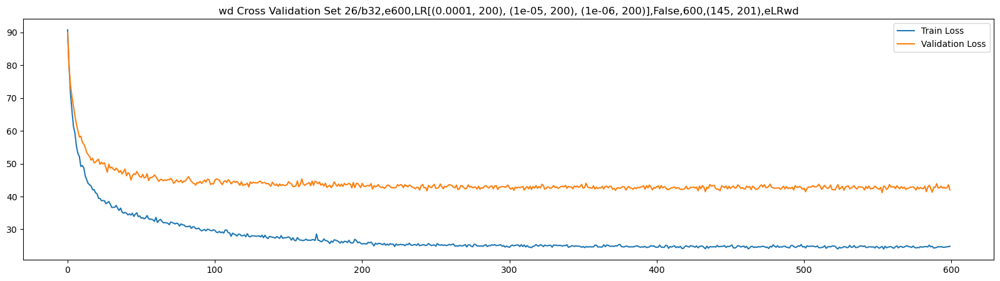

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,600,(246, 115),eLRwd


599 Tr:26.27 V:37.68 Te:61.02 46 37.3377 1e-06: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.17it/s]


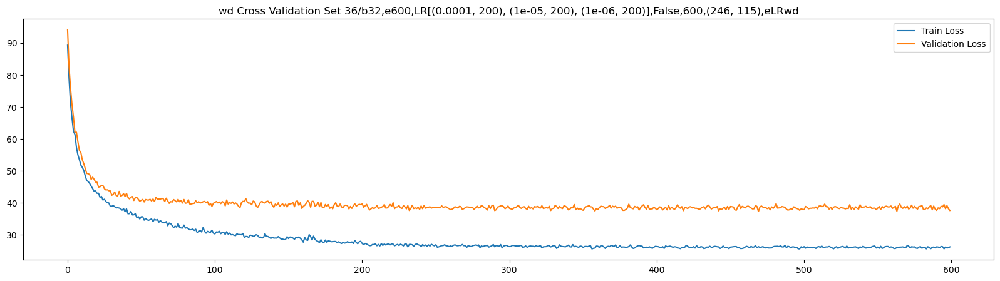

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(25.7826, device='cuda:0') tensor(39.3695, device='cuda:0') tensor(60.7113, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,600,(471, 322),eLRwd


599 Tr:37.71 V:48.4 Te:66.04 77 47.4772 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:57<00:00,  5.11it/s]


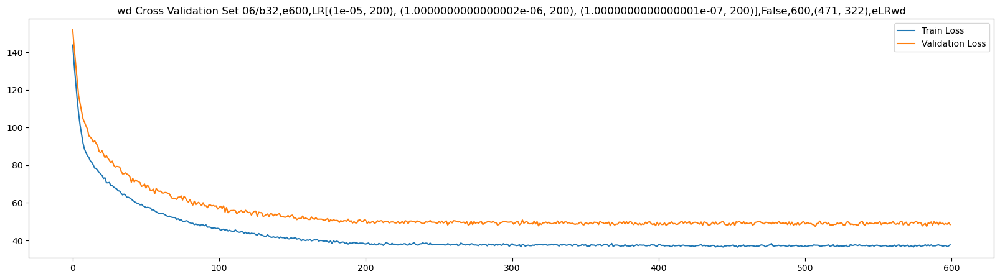

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,600,(422, 187),eLRwd


599 Tr:38.9 V:44.14 Te:66.49 63 42.4189 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:56<00:00,  5.15it/s]


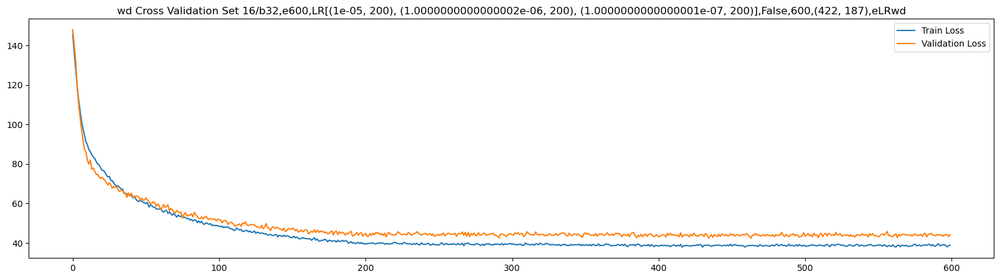

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,600,(145, 201),eLRwd


599 Tr:37.0 V:47.42 Te:64.71 67 46.3239 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:56<00:00,  5.14it/s]


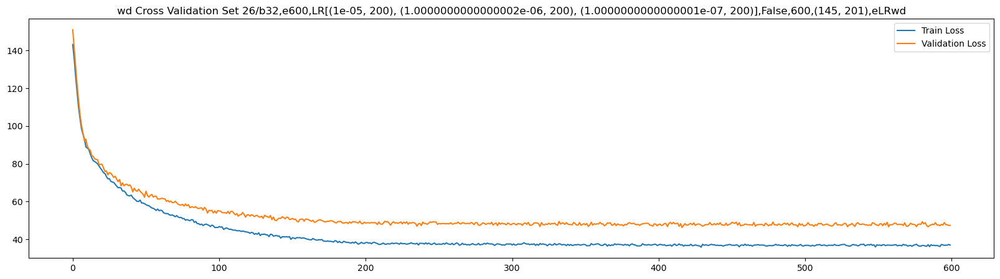

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,600,(246, 115),eLRwd


599 Tr:39.39 V:42.89 Te:65.93 83 41.5096 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:56<00:00,  5.14it/s]


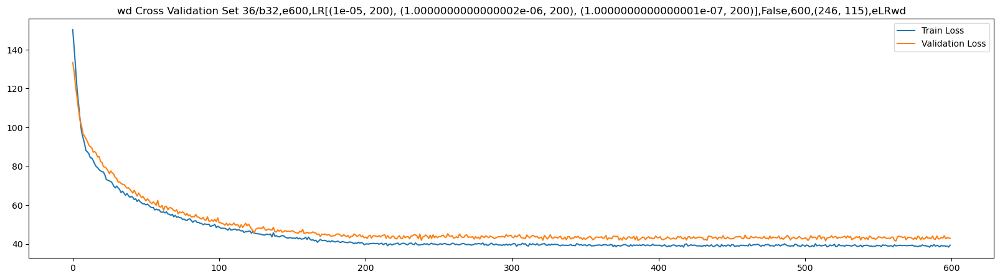

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(38.0619, device='cuda:0') tensor(44.4324, device='cuda:0') tensor(65.8563, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,600,(471, 322),eLRwd


599 Tr:70.18 V:82.55 Te:96.76 76 80.2789 1e-08: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.13it/s]


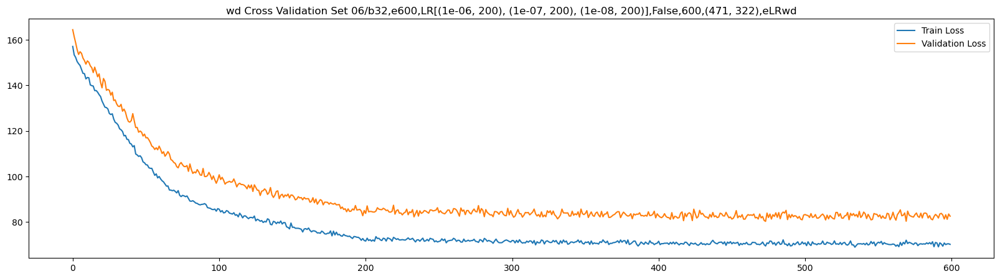

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,600,(422, 187),eLRwd


599 Tr:72.34 V:69.36 Te:92.32 85 67.0665 1e-08: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.17it/s]


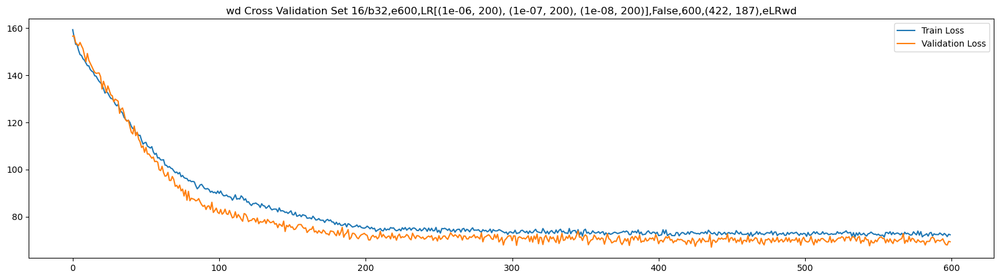

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,600,(145, 201),eLRwd


599 Tr:72.06 V:73.81 Te:94.95 86 72.5851 1e-08: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.13it/s]


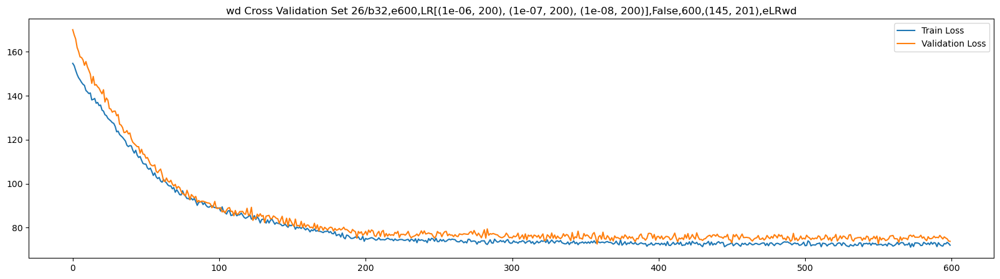

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,600,(246, 115),eLRwd


599 Tr:72.14 V:78.11 Te:97.0 82 75.0396 1e-08: 100%|███████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


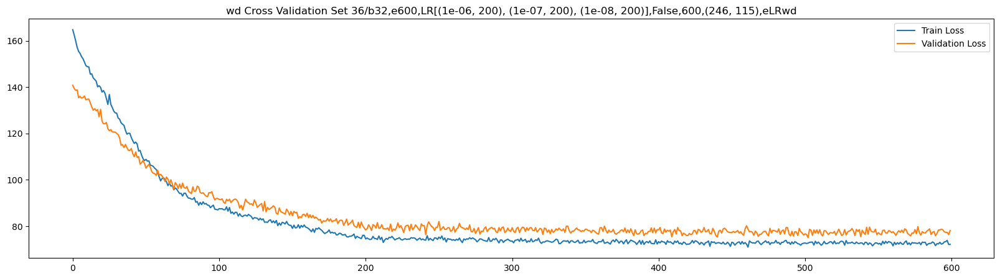

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(72.1213, device='cuda:0') tensor(73.7425, device='cuda:0') tensor(93.8871, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [153]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=1, stride=1),
    nn.LayerNorm((8, 301, 4)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=1),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 299, 2)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(2392, 2),
    ScaledSigmoid()
).cuda()
f = 600
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,700,(471, 322),eLRwd


599 Tr:506.49 V:512.36 Te:474.14 1 512.364 0.0001: 100%|███████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


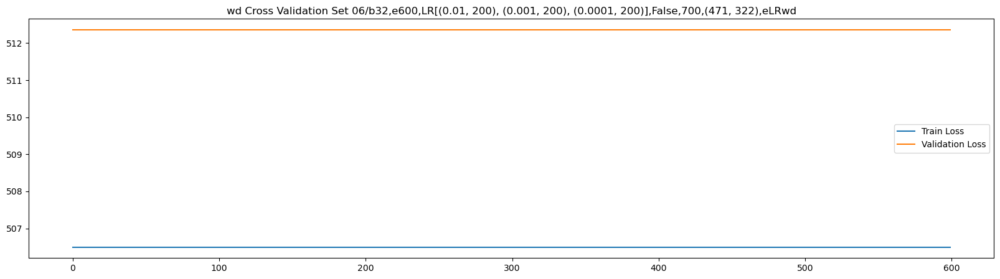

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,700,(422, 187),eLRwd


599 Tr:19.8 V:36.65 Te:58.12 42 35.0429 0.0001: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


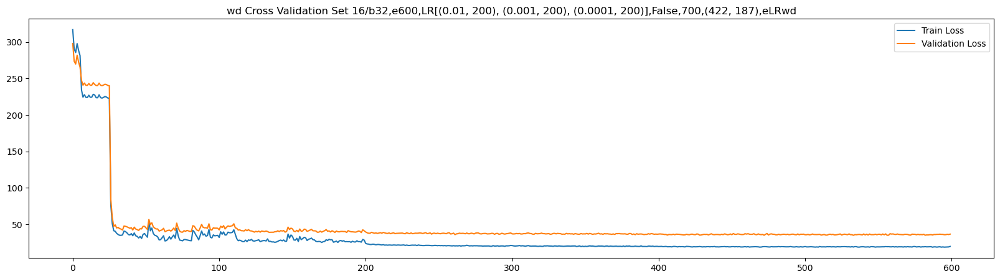

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,700,(145, 201),eLRwd


599 Tr:496.9 V:541.13 Te:474.14 1 541.1311 0.0001: 100%|███████████████████████████████████| 600/600 [01:56<00:00,  5.14it/s]


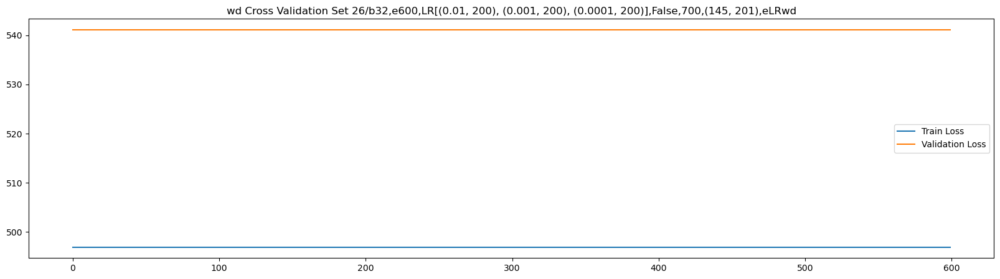

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,700,(246, 115),eLRwd


599 Tr:407.91 V:429.86 Te:441.41 1 429.8646 0.0001: 100%|██████████████████████████████████| 600/600 [01:56<00:00,  5.15it/s]


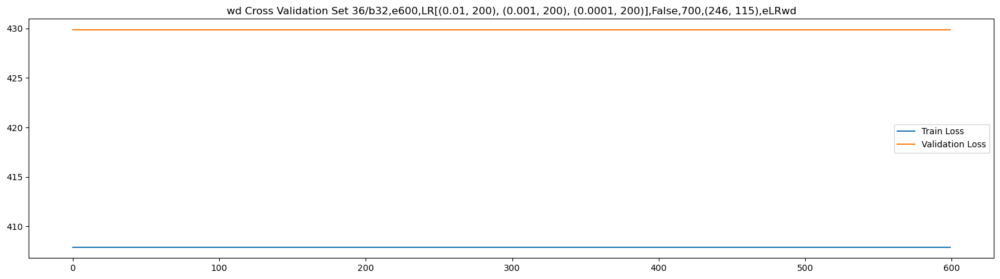

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(357.5739, device='cuda:0') tensor(379.6007, device='cuda:0') tensor(361.8687, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,700,(471, 322),eLRwd


599 Tr:16.77 V:39.46 Te:56.27 33 38.2647 1e-05: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


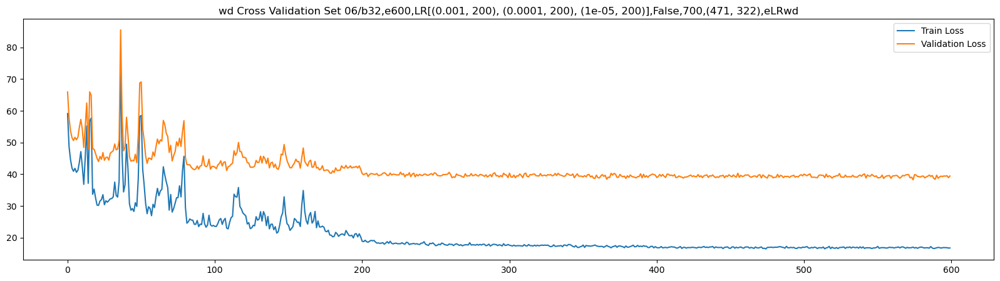

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,700,(422, 187),eLRwd


599 Tr:17.78 V:34.35 Te:57.13 28 33.9212 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.13it/s]


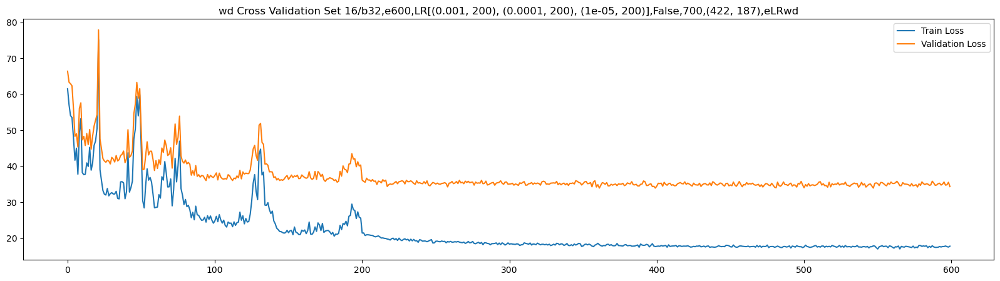

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,700,(145, 201),eLRwd


599 Tr:16.21 V:40.82 Te:56.8 25 39.4786 1e-05: 100%|███████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


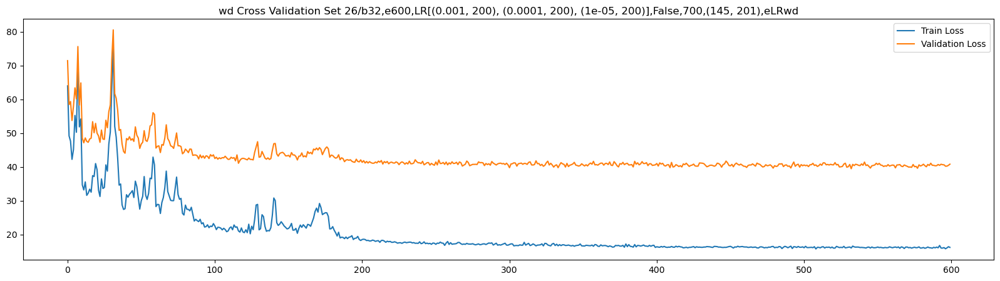

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,700,(246, 115),eLRwd


599 Tr:17.27 V:35.45 Te:57.63 29 34.7321 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.14it/s]


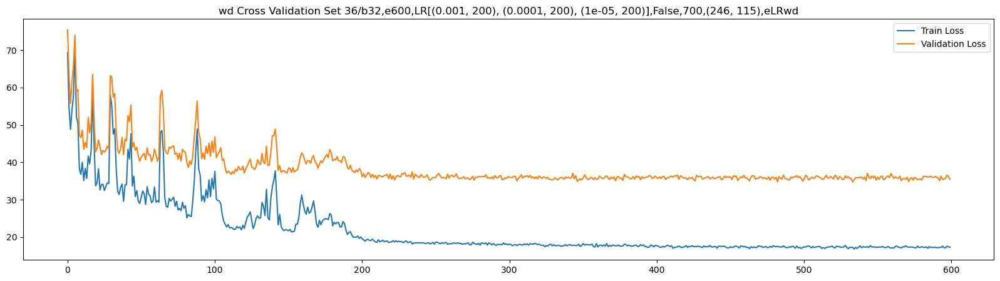

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(16.9906, device='cuda:0') tensor(36.5991, device='cuda:0') tensor(57.1852, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,700,(471, 322),eLRwd


599 Tr:24.02 V:42.45 Te:60.12 49 41.7339 1e-06: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


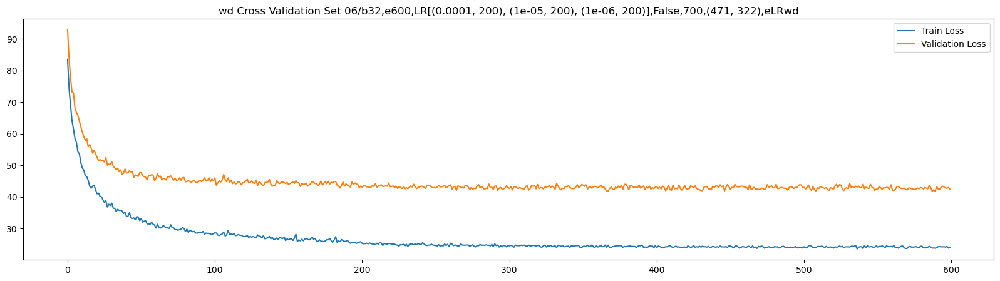

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,700,(422, 187),eLRwd


599 Tr:25.95 V:38.46 Te:60.88 46 37.7269 1e-06: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


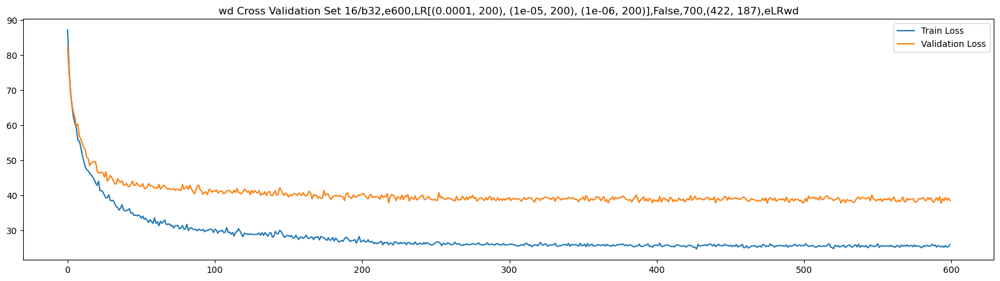

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,700,(145, 201),eLRwd


599 Tr:23.44 V:43.5 Te:59.95 54 40.8887 1e-06: 100%|███████████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


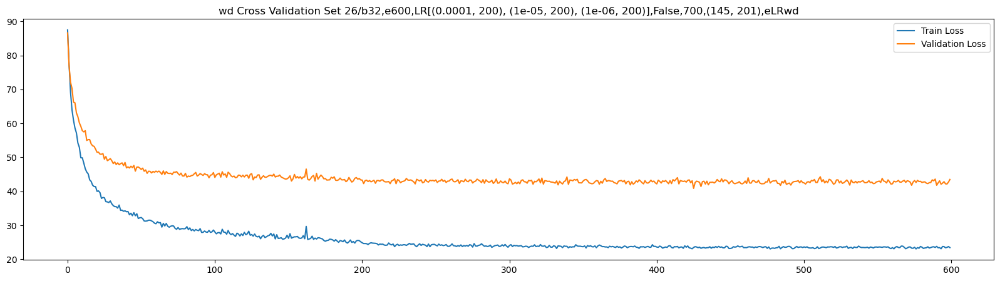

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,700,(246, 115),eLRwd


599 Tr:24.61 V:40.03 Te:62.75 49 38.3349 1e-06: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


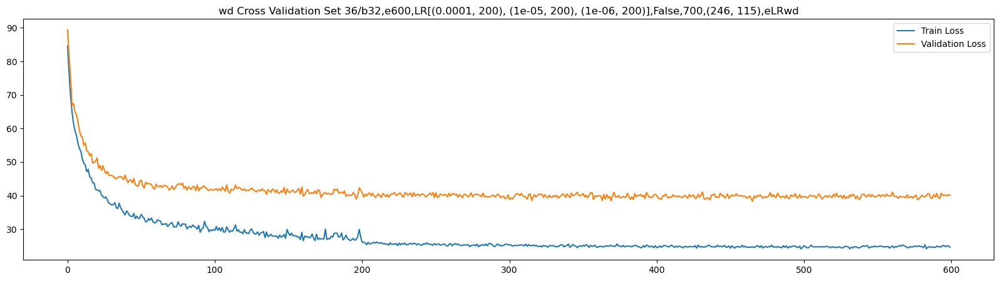

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(24.3224, device='cuda:0') tensor(39.6711, device='cuda:0') tensor(60.8731, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,700,(471, 322),eLRwd


599 Tr:35.85 V:48.85 Te:66.64 71 47.4935 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:58<00:00,  5.08it/s]


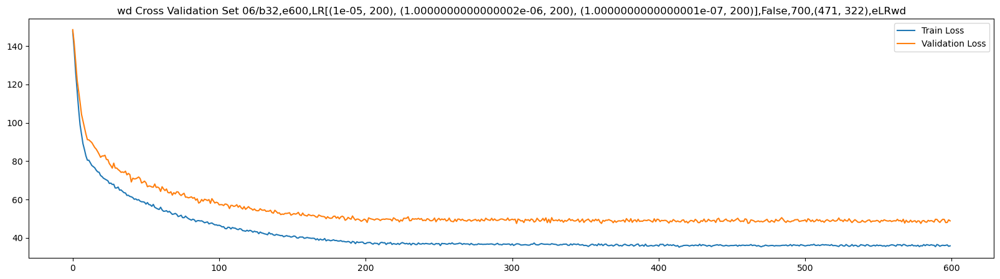

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,700,(422, 187),eLRwd


599 Tr:36.56 V:44.13 Te:66.58 60 42.8844 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:58<00:00,  5.07it/s]


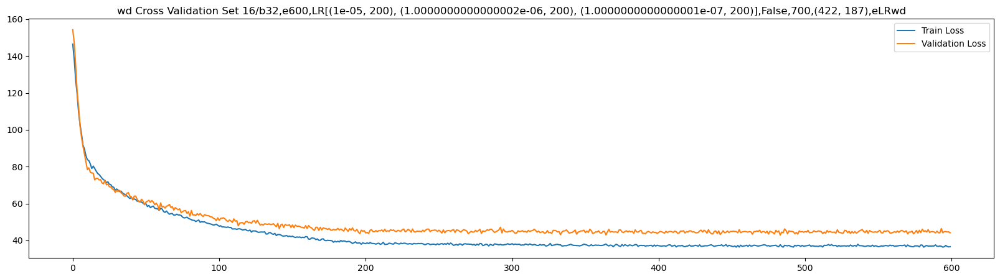

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,700,(145, 201),eLRwd


599 Tr:35.48 V:48.25 Te:64.97 68 47.0093 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:56<00:00,  5.14it/s]


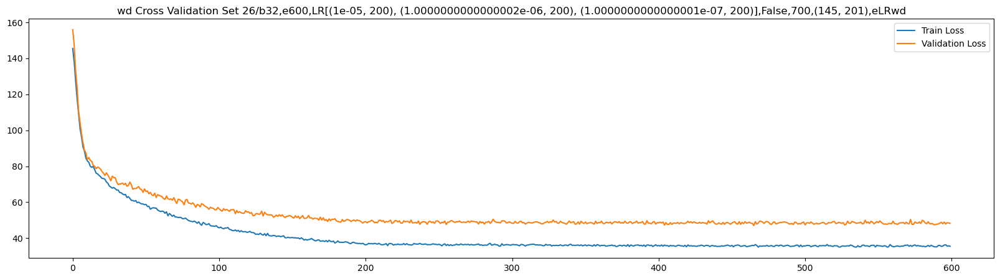

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,700,(246, 115),eLRwd


599 Tr:36.38 V:46.45 Te:66.87 81 44.3662 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:57<00:00,  5.10it/s]


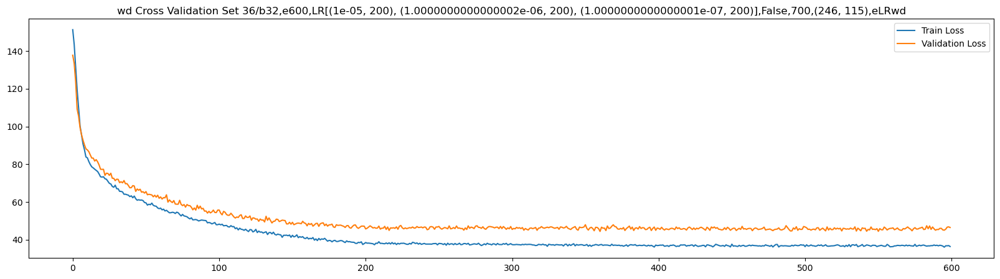

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(36.9244, device='cuda:0') tensor(45.4383, device='cuda:0') tensor(66.4033, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,700,(471, 322),eLRwd


599 Tr:69.73 V:79.46 Te:92.09 73 76.1155 1e-08: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


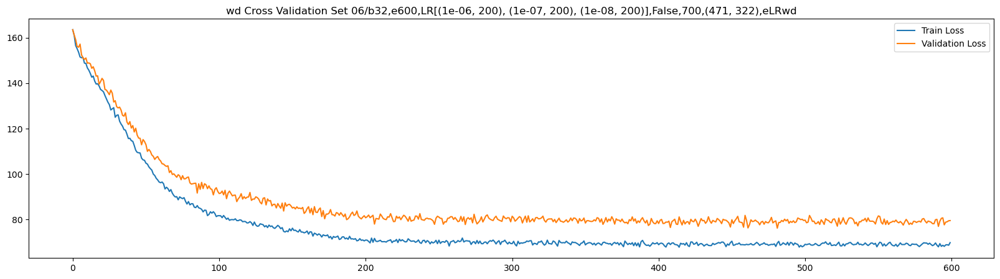

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,700,(422, 187),eLRwd


599 Tr:71.19 V:67.07 Te:90.9 82 66.768 1e-08: 100%|████████████████████████████████████████| 600/600 [01:57<00:00,  5.10it/s]


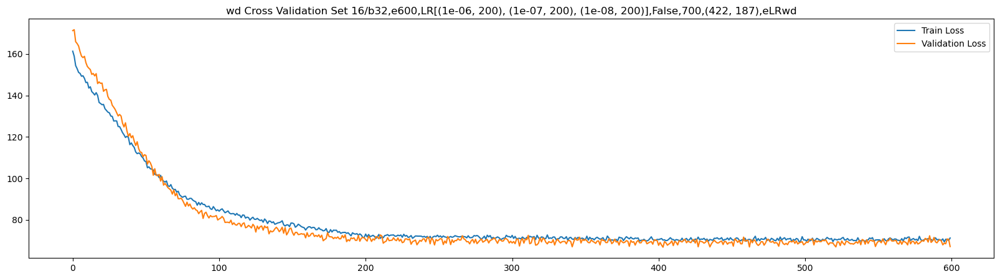

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,700,(145, 201),eLRwd


599 Tr:70.55 V:75.02 Te:93.73 82 71.5862 1e-08: 100%|██████████████████████████████████████| 600/600 [01:58<00:00,  5.08it/s]


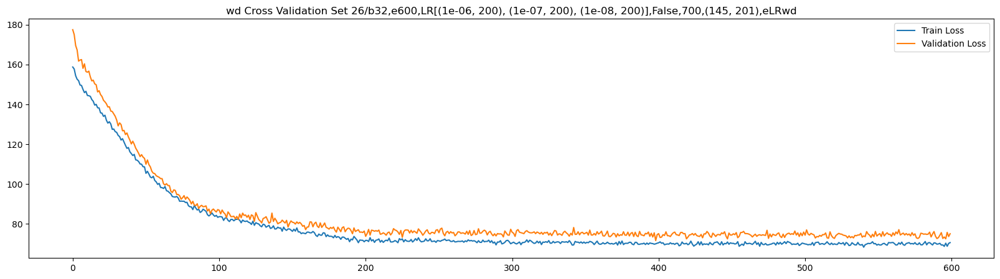

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,700,(246, 115),eLRwd


599 Tr:69.27 V:75.9 Te:90.74 67 72.3578 1e-08: 100%|███████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


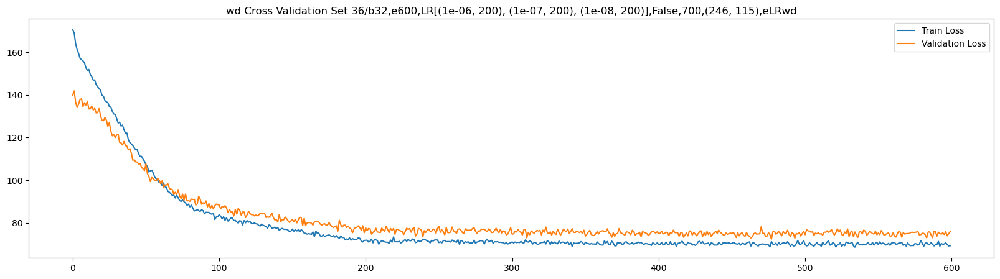

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(70.2201, device='cuda:0') tensor(71.7069, device='cuda:0') tensor(91.3347, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [154]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=1, stride=1),
    nn.LayerNorm((8, 351, 4)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=1),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 349, 2)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(2792, 2),
    ScaledSigmoid()
).cuda()
f = 700
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,800,(471, 322),eLRwd


599 Tr:18.28 V:39.39 Te:55.85 30 38.3837 0.0001: 100%|█████████████████████████████████████| 600/600 [01:56<00:00,  5.15it/s]


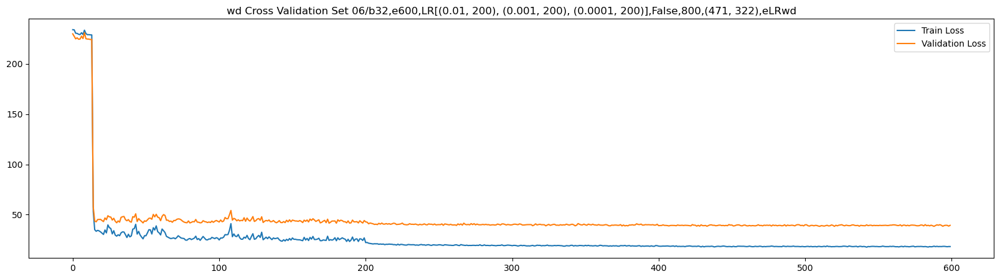

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,800,(422, 187),eLRwd


599 Tr:369.58 V:380.64 Te:405.49 1 380.6386 0.0001: 100%|██████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


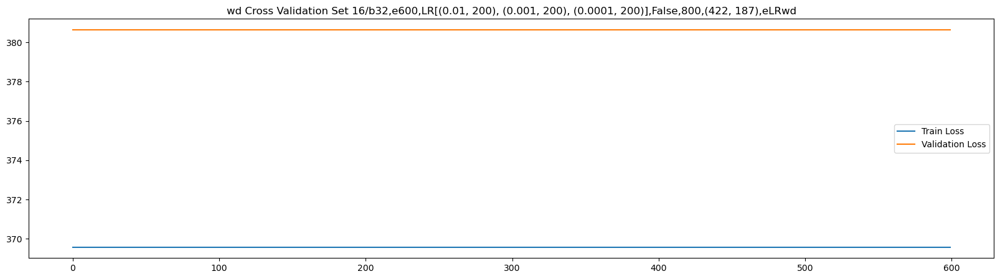

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,800,(145, 201),eLRwd


599 Tr:19.62 V:41.15 Te:56.81 21 39.8266 0.0001: 100%|█████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


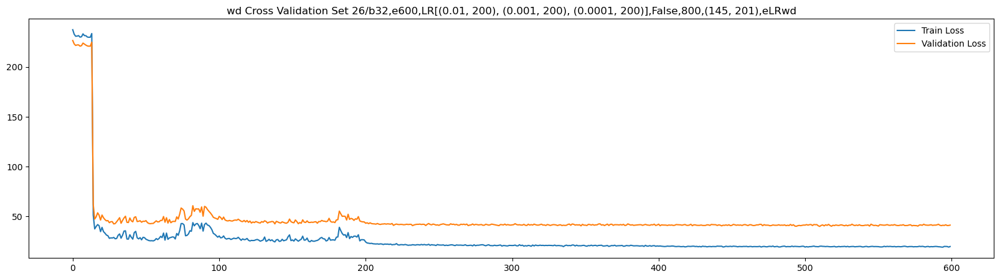

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,800,(246, 115),eLRwd


599 Tr:20.29 V:41.09 Te:61.89 26 39.1231 0.0001: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


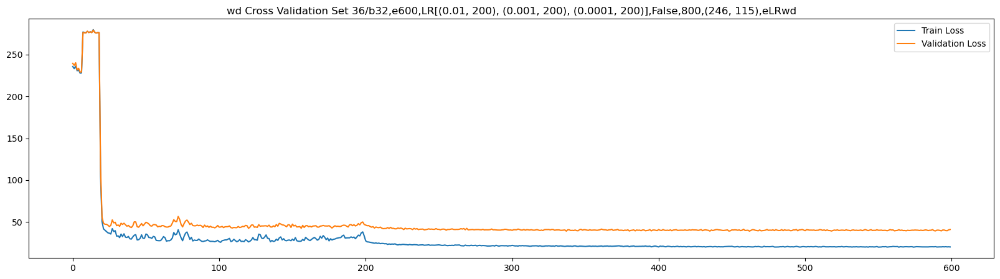

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(107.2130, device='cuda:0') tensor(124.4930, device='cuda:0') tensor(145.2700, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,800,(471, 322),eLRwd


599 Tr:18.57 V:39.45 Te:56.19 28 37.8591 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


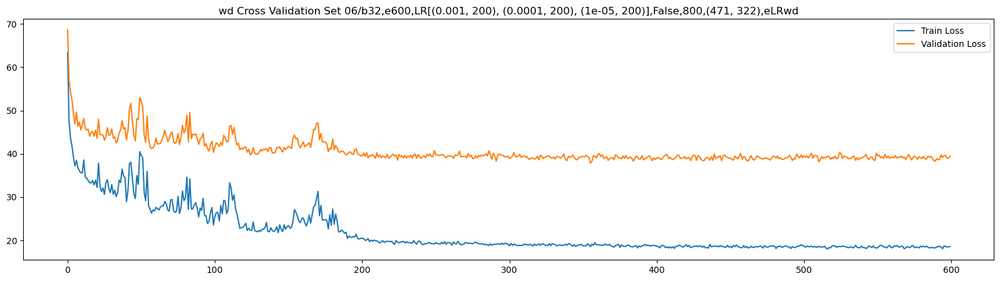

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,800,(422, 187),eLRwd


599 Tr:19.41 V:35.48 Te:56.97 32 34.0494 1e-05: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


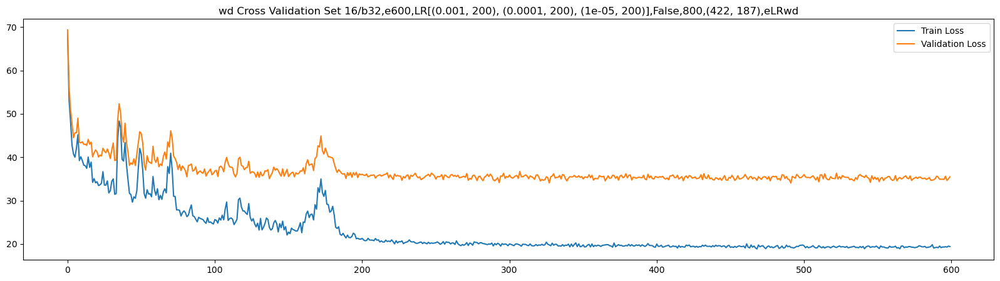

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,800,(145, 201),eLRwd


599 Tr:17.64 V:40.61 Te:56.2 25 39.4853 1e-05: 100%|███████████████████████████████████████| 600/600 [01:55<00:00,  5.20it/s]


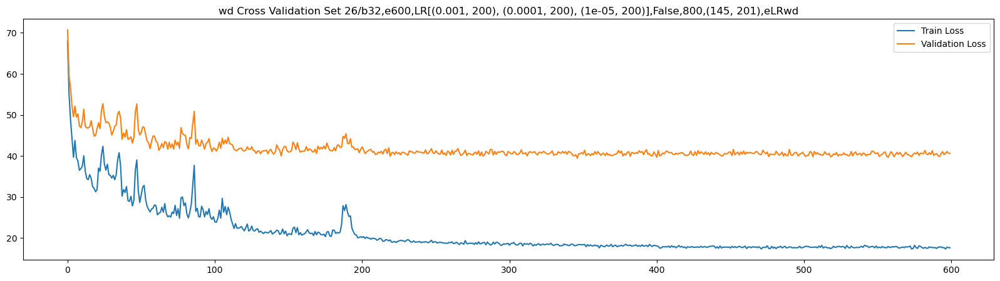

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,800,(246, 115),eLRwd


599 Tr:18.73 V:35.62 Te:57.11 29 34.0887 1e-05: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.17it/s]


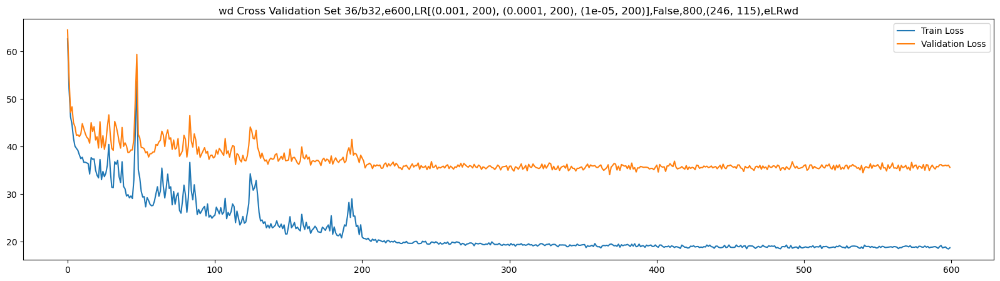

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(18.8838, device='cuda:0') tensor(36.3706, device='cuda:0') tensor(56.5077, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,800,(471, 322),eLRwd


599 Tr:26.31 V:41.72 Te:60.22 40 40.9736 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


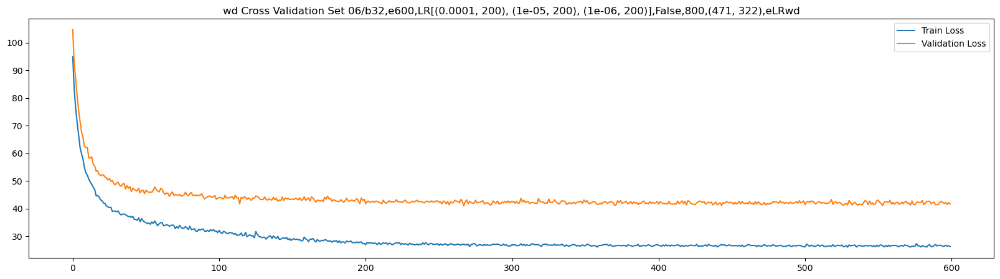

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,800,(422, 187),eLRwd


599 Tr:27.38 V:37.53 Te:60.24 47 36.1271 1e-06: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.15it/s]


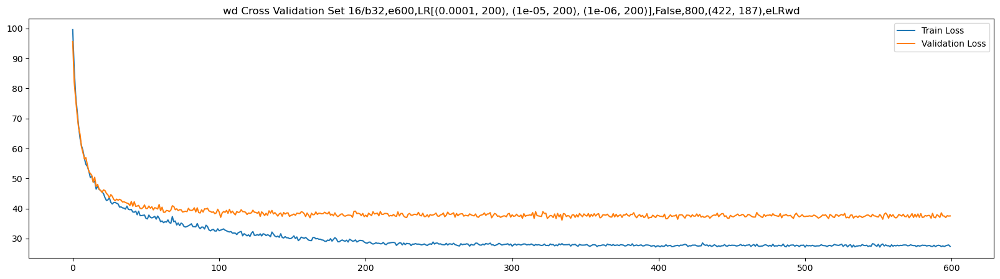

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,800,(145, 201),eLRwd


599 Tr:25.62 V:41.67 Te:58.28 44 40.6126 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


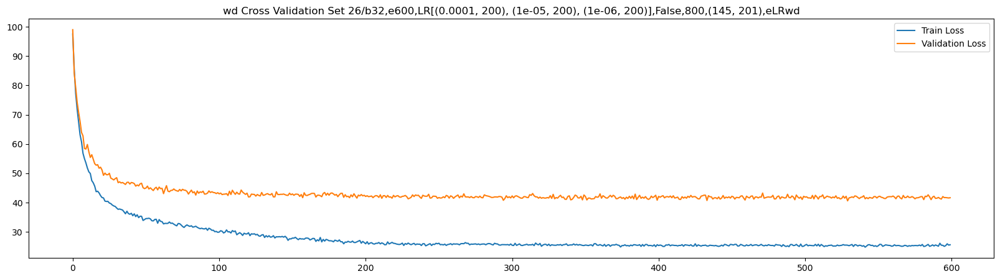

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,800,(246, 115),eLRwd


599 Tr:26.95 V:37.22 Te:59.91 49 36.2777 1e-06: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.18it/s]


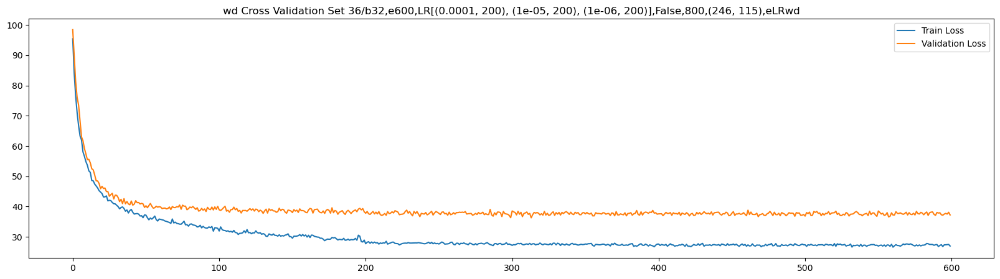

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(27.0599, device='cuda:0') tensor(38.4977, device='cuda:0') tensor(59.4017, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,800,(471, 322),eLRwd


599 Tr:38.45 V:48.59 Te:65.14 74 46.9323 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.17it/s]


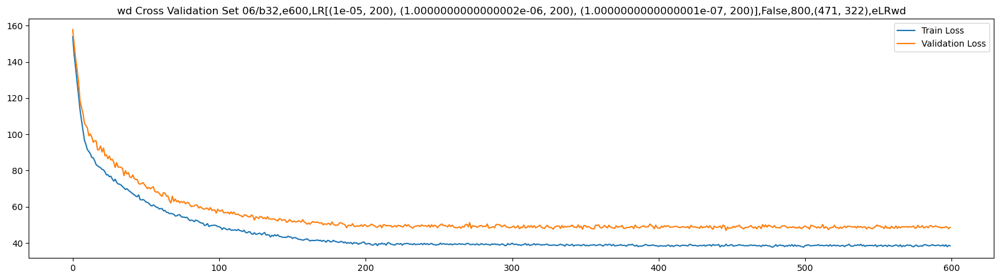

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,800,(422, 187),eLRwd


599 Tr:39.65 V:43.69 Te:66.11 73 41.4562 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:55<00:00,  5.17it/s]


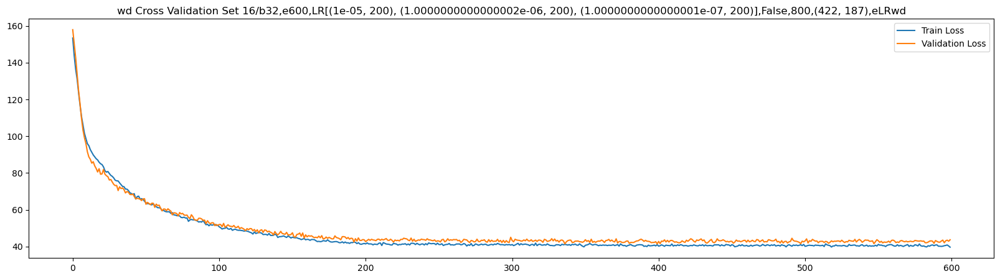

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,800,(145, 201),eLRwd


599 Tr:38.08 V:47.8 Te:64.54 83 46.1351 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:55<00:00,  5.17it/s]


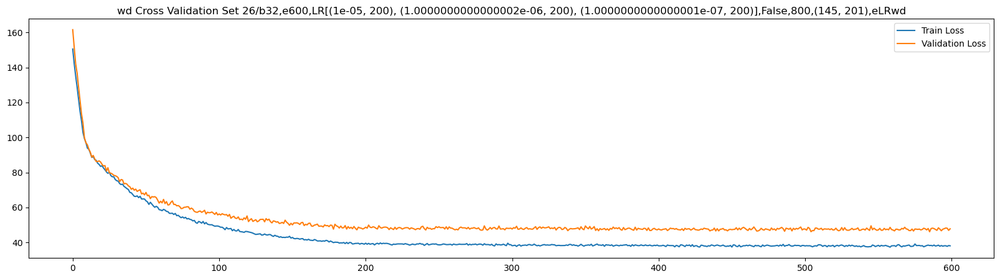

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,800,(246, 115),eLRwd


599 Tr:40.6 V:43.69 Te:66.66 88 41.5561 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:56<00:00,  5.16it/s]


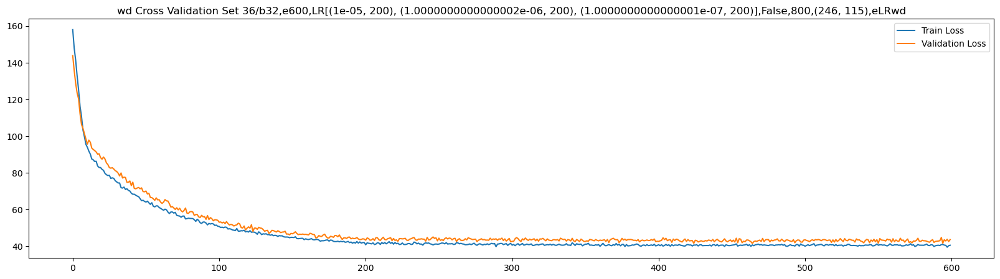

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(39.8801, device='cuda:0') tensor(44.0199, device='cuda:0') tensor(66.2771, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,800,(471, 322),eLRwd


599 Tr:78.21 V:87.03 Te:100.0 86 84.5321 1e-08: 100%|██████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


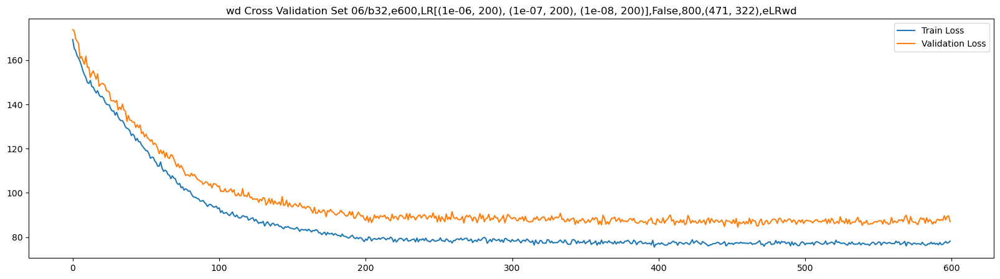

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,800,(422, 187),eLRwd


599 Tr:78.78 V:75.21 Te:100.13 80 73.3626 1e-08: 100%|█████████████████████████████████████| 600/600 [01:55<00:00,  5.21it/s]


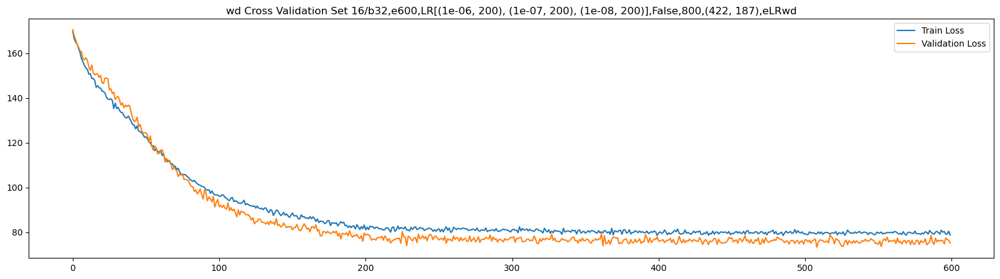

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,800,(145, 201),eLRwd


599 Tr:78.57 V:79.67 Te:98.06 95 77.0792 1e-08: 100%|██████████████████████████████████████| 600/600 [01:55<00:00,  5.19it/s]


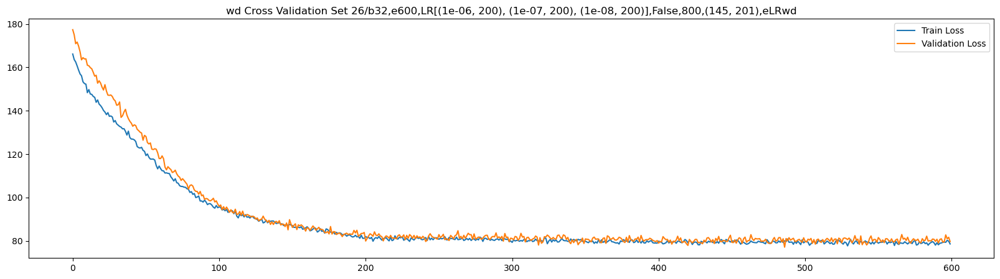

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,800,(246, 115),eLRwd


599 Tr:78.51 V:85.13 Te:101.23 78 81.6503 1e-08: 100%|█████████████████████████████████████| 600/600 [01:56<00:00,  5.16it/s]


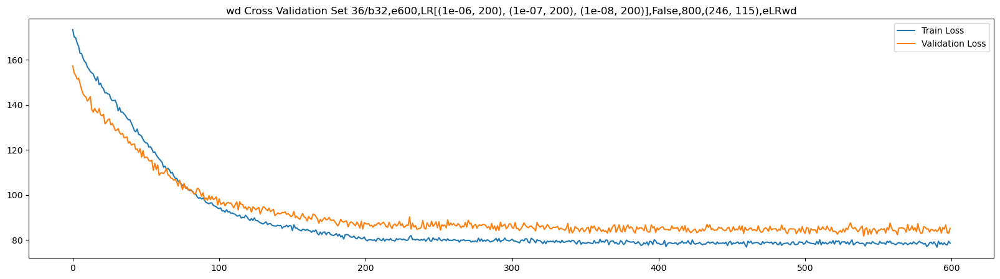

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(78.7544, device='cuda:0') tensor(79.1561, device='cuda:0') tensor(99.9258, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [155]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=1, stride=1),
    nn.LayerNorm((8, 401, 3)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=1),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 399, 1)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(1596, 2),
    ScaledSigmoid()
).cuda()
f = 800
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,100,(471, 322),eLRwd


599 Tr:372.54 V:371.76 Te:405.49 1 371.7629 0.0001: 100%|██████████████████████████████████| 600/600 [01:57<00:00,  5.10it/s]


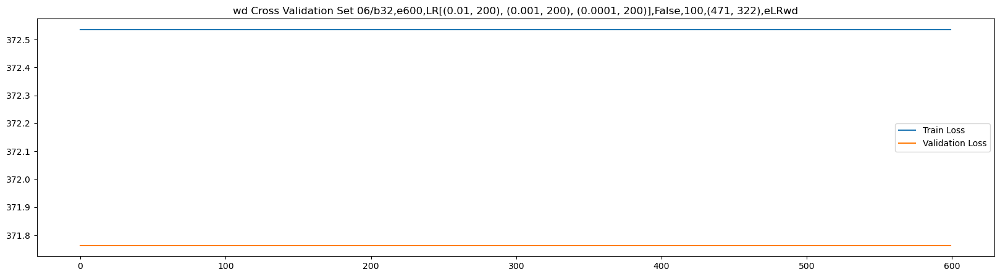

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,100,(422, 187),eLRwd


599 Tr:369.58 V:380.64 Te:405.49 1 380.6386 0.0001: 100%|██████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


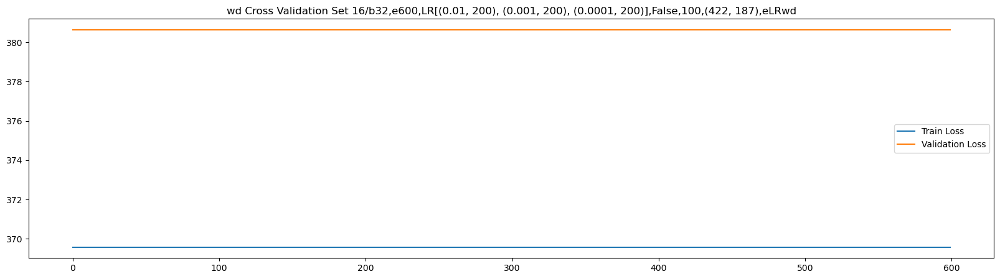

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,100,(145, 201),eLRwd


599 Tr:384.01 V:337.35 Te:405.49 1 337.3459 0.0001: 100%|██████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


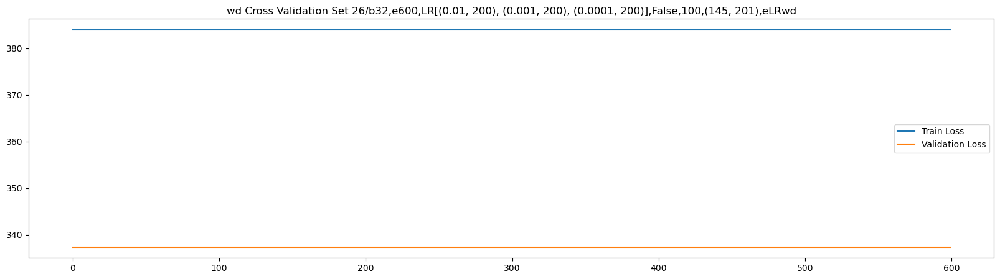

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,100,(246, 115),eLRwd


599 Tr:363.25 V:399.62 Te:405.49 1 399.6234 0.0001: 100%|██████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


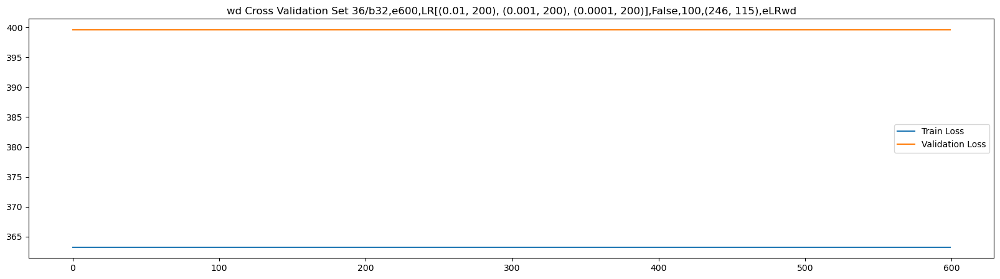

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(372.3427, device='cuda:0') tensor(372.3427, device='cuda:0') tensor(405.4949, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,100,(471, 322),eLRwd


599 Tr:17.3 V:40.17 Te:55.07 46 39.1604 1e-05: 100%|███████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


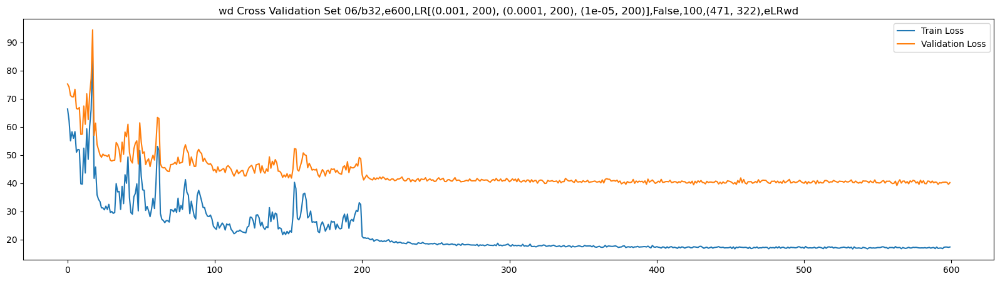

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,100,(422, 187),eLRwd


599 Tr:17.53 V:36.56 Te:55.91 32 35.5045 1e-05: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


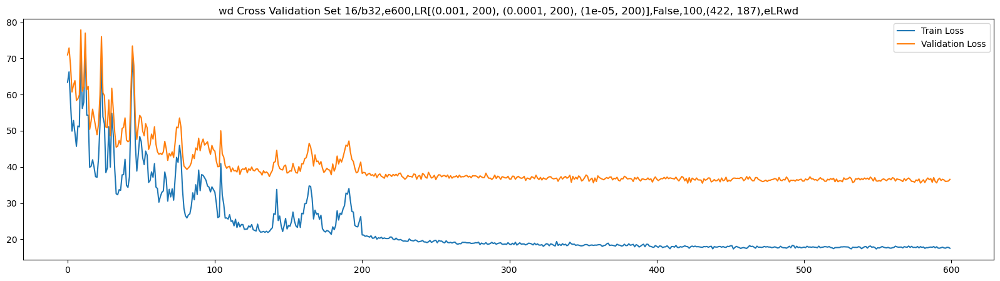

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,100,(145, 201),eLRwd


599 Tr:16.54 V:42.82 Te:56.63 36 42.0277 1e-05: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.11it/s]


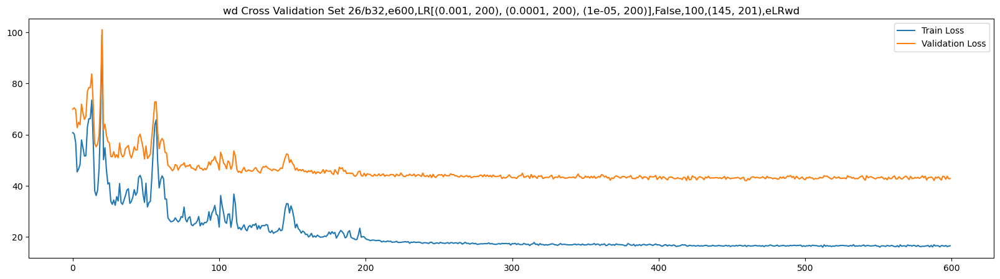

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,100,(246, 115),eLRwd


599 Tr:17.77 V:37.8 Te:56.16 33 36.6066 1e-05: 100%|███████████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


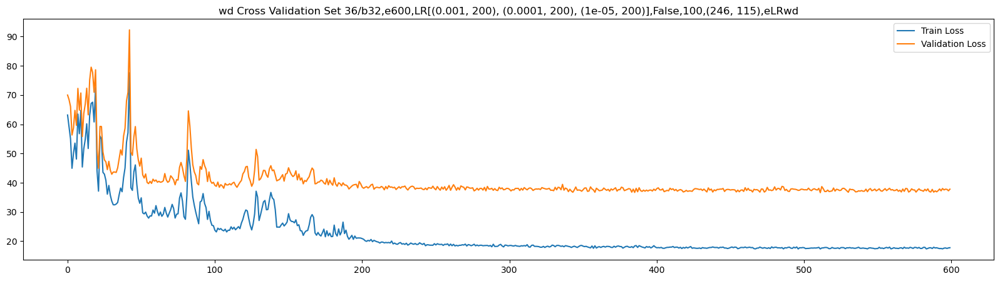

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(17.1146, device='cuda:0') tensor(38.3248, device='cuda:0') tensor(55.6207, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,100,(471, 322),eLRwd


599 Tr:22.74 V:45.34 Te:59.3 41 44.2259 1e-06: 100%|███████████████████████████████████████| 600/600 [01:57<00:00,  5.10it/s]


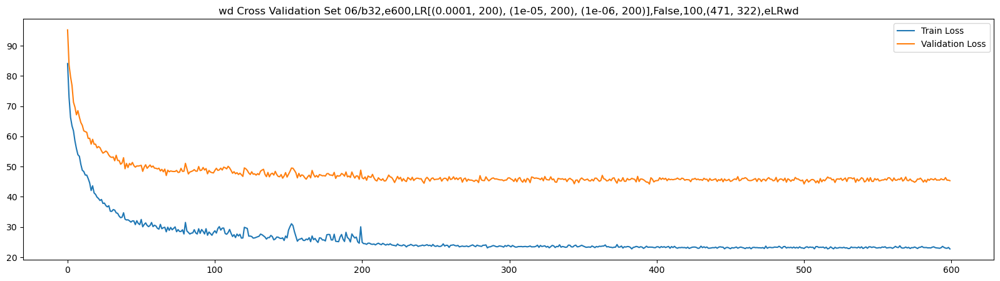

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,100,(422, 187),eLRwd


599 Tr:24.21 V:41.05 Te:61.01 41 39.8376 1e-06: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.10it/s]


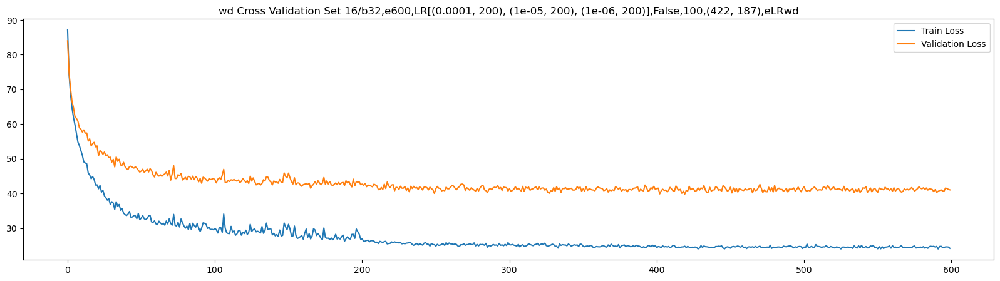

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,100,(145, 201),eLRwd


599 Tr:22.31 V:44.57 Te:59.84 50 43.3354 1e-06: 100%|██████████████████████████████████████| 600/600 [01:58<00:00,  5.08it/s]


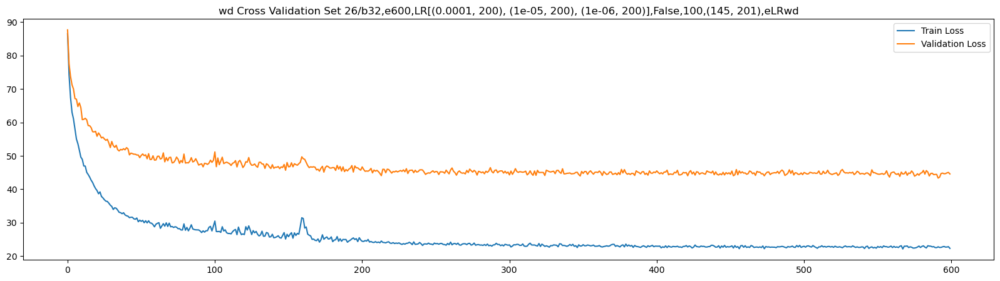

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,100,(246, 115),eLRwd


599 Tr:24.75 V:40.87 Te:61.28 43 40.034 1e-06: 100%|███████████████████████████████████████| 600/600 [01:58<00:00,  5.05it/s]


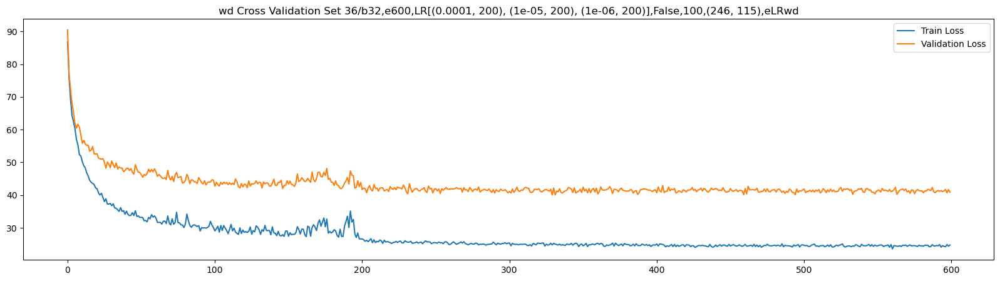

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(23.9320, device='cuda:0') tensor(41.8582, device='cuda:0') tensor(60.2188, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,100,(471, 322),eLRwd


599 Tr:34.1 V:52.99 Te:65.17 72 50.6915 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:59<00:00,  5.04it/s]


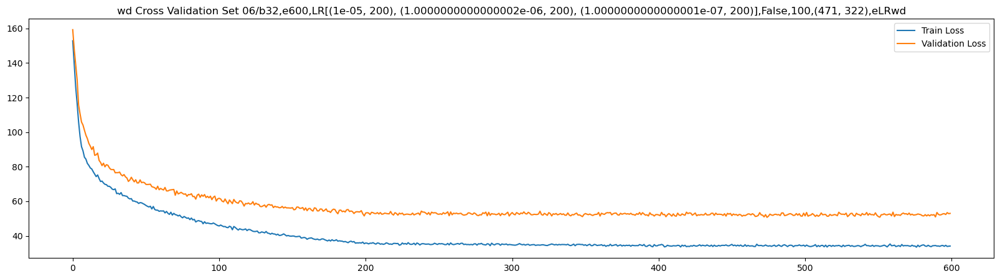

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,100,(422, 187),eLRwd


599 Tr:35.41 V:48.45 Te:66.38 66 46.6228 1.0000000000000001e-07: 100%|█████████████████████| 600/600 [01:59<00:00,  5.03it/s]


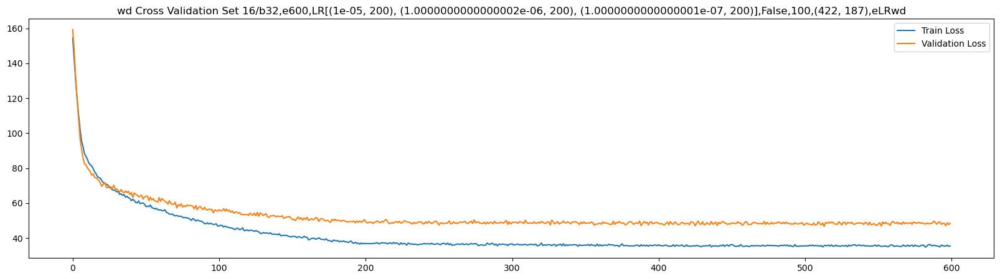

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,100,(145, 201),eLRwd


599 Tr:33.58 V:51.9 Te:65.36 57 50.4704 1.0000000000000001e-07: 100%|██████████████████████| 600/600 [01:59<00:00,  5.03it/s]


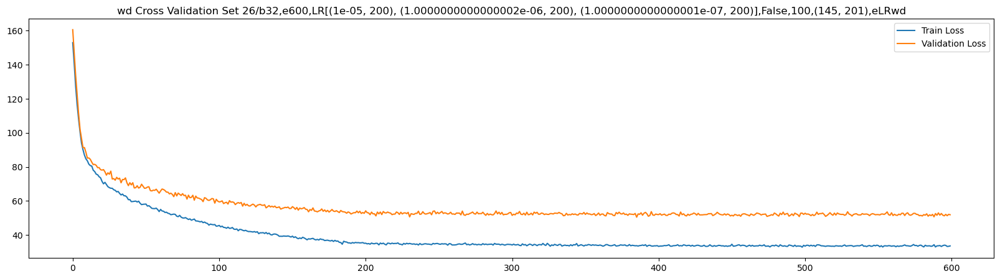

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,100,(246, 115),eLRwd


599 Tr:35.66 V:47.8 Te:68.7 71 47.0779 1.0000000000000001e-07: 100%|███████████████████████| 600/600 [01:59<00:00,  5.04it/s]


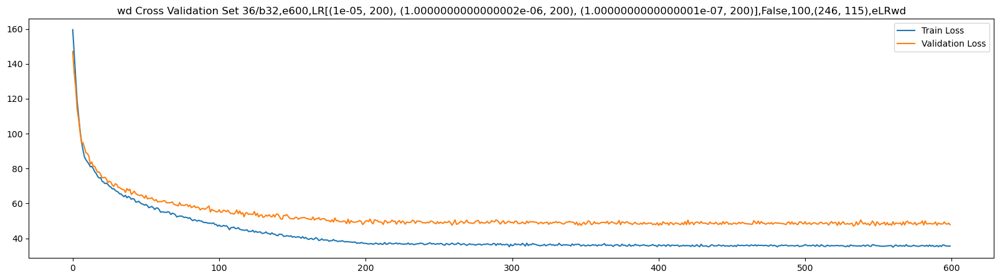

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(34.8637, device='cuda:0') tensor(48.7156, device='cuda:0') tensor(65.8360, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,100,(471, 322),eLRwd


599 Tr:67.49 V:77.97 Te:89.12 88 75.969 1e-08: 100%|███████████████████████████████████████| 600/600 [01:58<00:00,  5.05it/s]


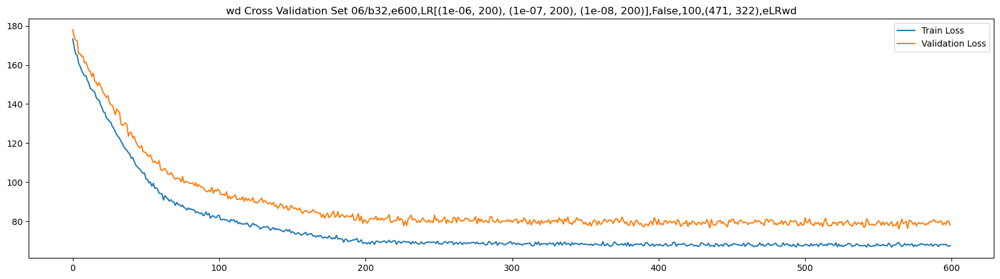

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,100,(422, 187),eLRwd


599 Tr:68.15 V:69.07 Te:88.97 82 66.5536 1e-08: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.12it/s]


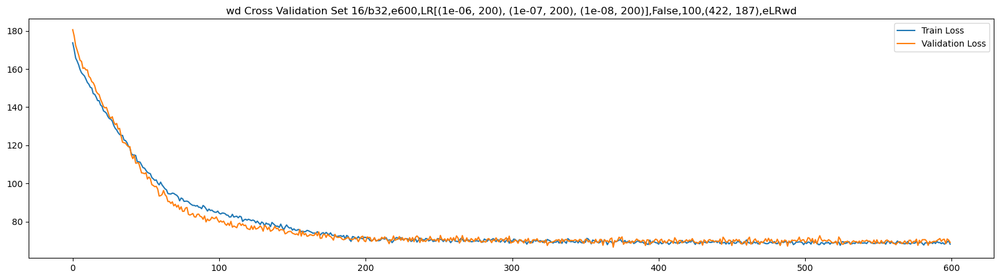

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,100,(145, 201),eLRwd


599 Tr:68.15 V:73.23 Te:89.63 81 72.7766 1e-08: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.10it/s]


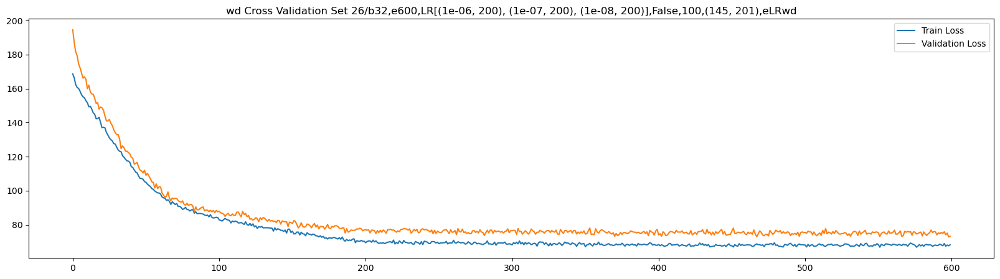

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,100,(246, 115),eLRwd


599 Tr:68.85 V:72.55 Te:90.71 84 69.3983 1e-08: 100%|██████████████████████████████████████| 600/600 [01:57<00:00,  5.10it/s]


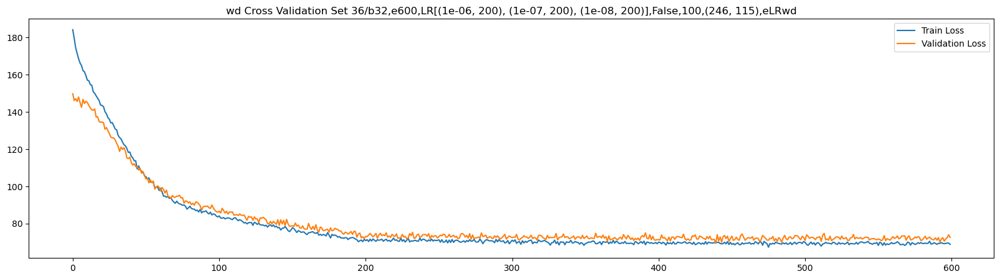

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(68.6279, device='cuda:0') tensor(71.1744, device='cuda:0') tensor(89.8220, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [156]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=1, stride=1),
    nn.LayerNorm((8, 51, 22)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=1),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 49, 20)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(3920, 2),
    ScaledSigmoid()
).cuda()
f = 100
for i in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

models_6/b32,e600,LR[(0.1, 200), (0.01, 200), (0.001, 200)],False,400,(471, 322),eLRwd


599 Tr:372.54 V:371.76 Te:405.49 1 371.7629 0.001: 100%|███████████████████████████████████| 600/600 [01:52<00:00,  5.33it/s]


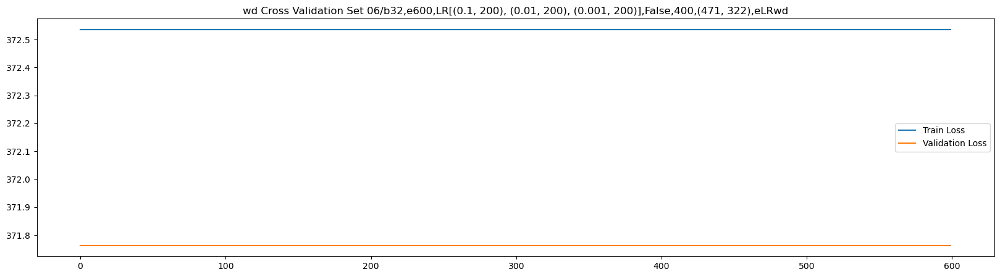

models_6/b32,e600,LR[(0.1, 200), (0.01, 200), (0.001, 200)],False,400,(422, 187),eLRwd


599 Tr:369.58 V:380.64 Te:348.6 1 315.4168 0.001: 100%|████████████████████████████████████| 600/600 [01:52<00:00,  5.33it/s]


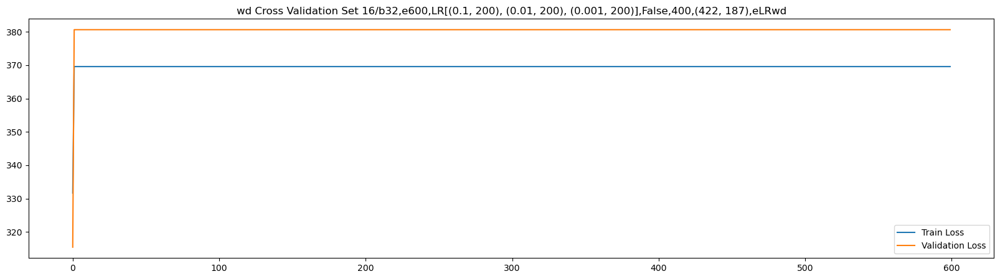

models_6/b32,e600,LR[(0.1, 200), (0.01, 200), (0.001, 200)],False,400,(145, 201),eLRwd


599 Tr:384.01 V:337.35 Te:346.16 2 287.7471 0.001: 100%|███████████████████████████████████| 600/600 [01:52<00:00,  5.33it/s]


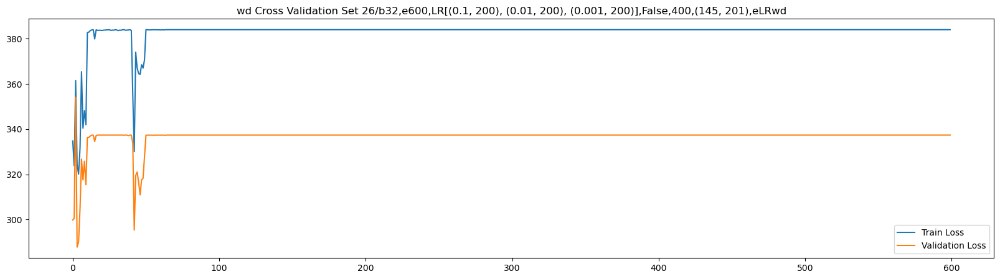

models_6/b32,e600,LR[(0.1, 200), (0.01, 200), (0.001, 200)],False,400,(246, 115),eLRwd


599 Tr:407.91 V:429.86 Te:441.41 2 429.8646 0.001: 100%|███████████████████████████████████| 600/600 [01:52<00:00,  5.32it/s]


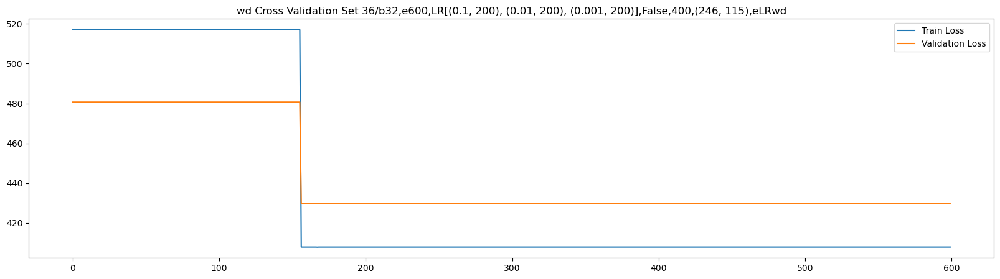

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(359.0669, device='cuda:0') tensor(351.1979, device='cuda:0') tensor(385.1914, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(471, 322),eLRwd
Using saved model ,eLRwd [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(17.7048, device='cuda:0') tensor(36.2135, device='cuda:0') 51      


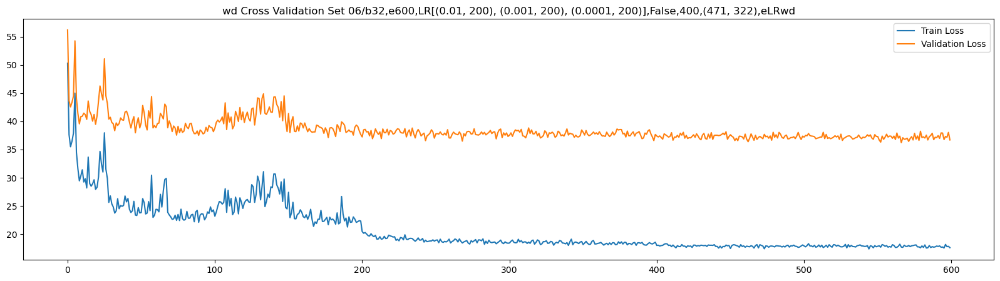

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(422, 187),eLRwd
Using saved model ,eLRwd [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(18.8666, device='cuda:0') tensor(31.8873, device='cuda:0') 54      


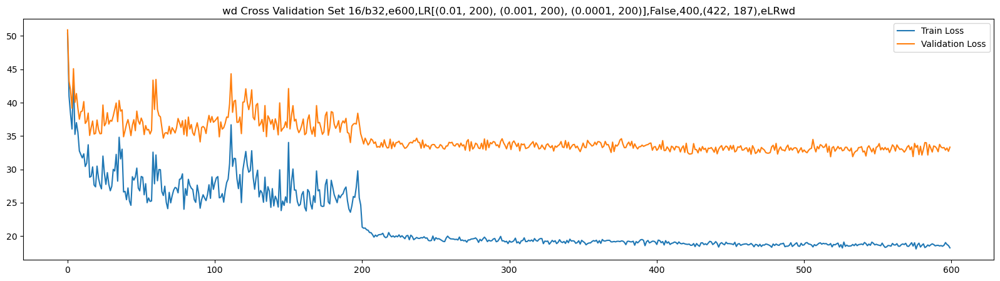

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(145, 201),eLRwd
Using saved model ,eLRwd [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(18.5801, device='cuda:0') tensor(38.1667, device='cuda:0') 52      


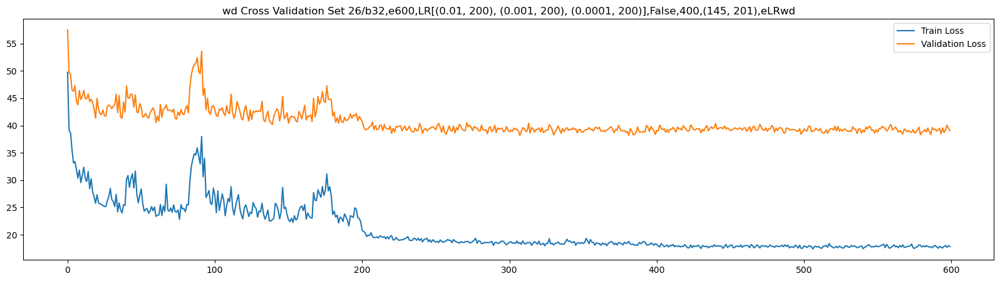

models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],False,400,(246, 115),eLRwd
Using saved model ,eLRwd [(0.01, 200), (0.001, 200), (0.0001, 200)] tensor(19.2300, device='cuda:0') tensor(33.2567, device='cuda:0') 53      


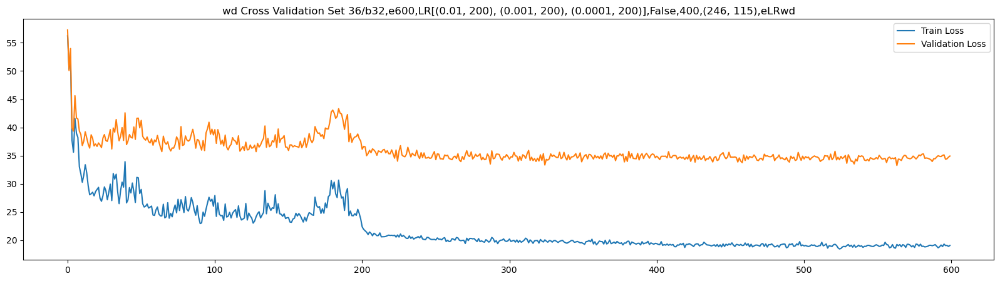

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(18.5954, device='cuda:0') tensor(34.8811, device='cuda:0') tensor(53.2492, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(471, 322),eLRwd
Using saved model ,eLRwd [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(19.6921, device='cuda:0') tensor(36.1660, device='cuda:0') 53      


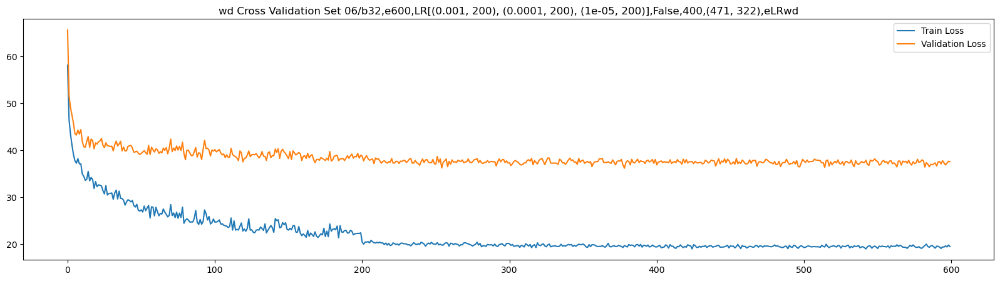

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(422, 187),eLRwd
Using saved model ,eLRwd [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(19.9979, device='cuda:0') tensor(32.6126, device='cuda:0') 55      


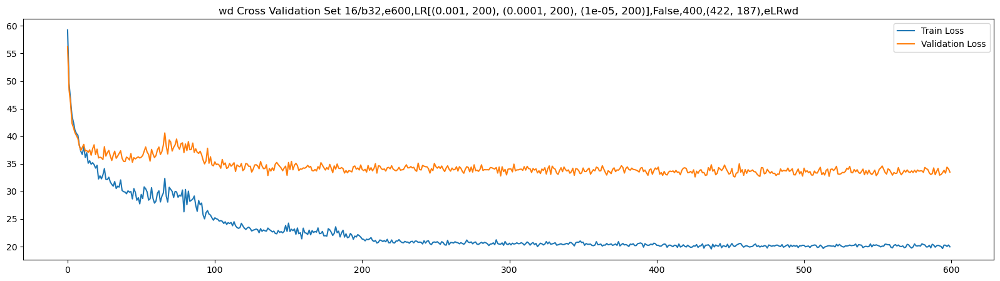

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(145, 201),eLRwd
Using saved model ,eLRwd [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(19.1103, device='cuda:0') tensor(37.6496, device='cuda:0') 52      


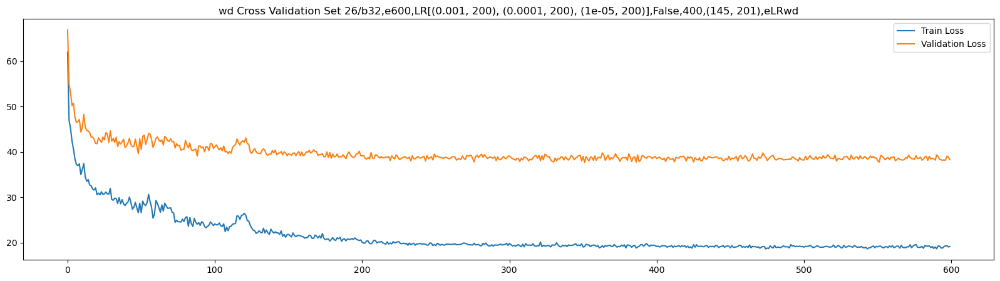

models_6/b32,e600,LR[(0.001, 200), (0.0001, 200), (1e-05, 200)],False,400,(246, 115),eLRwd
Using saved model ,eLRwd [(0.001, 200), (0.0001, 200), (1e-05, 200)] tensor(20.1333, device='cuda:0') tensor(33.4848, device='cuda:0') 55      


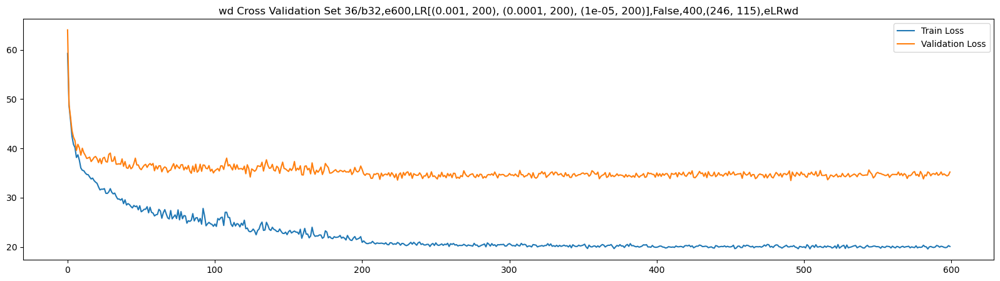

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(19.7334, device='cuda:0') tensor(34.9782, device='cuda:0') tensor(54.1557, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(471, 322),eLRwd
Using saved model ,eLRwd [(0.0001, 200), (1e-05, 200), (1e-06, 200)] tensor(27.5589, device='cuda:0') tensor(39.0345, device='cuda:0') 56      


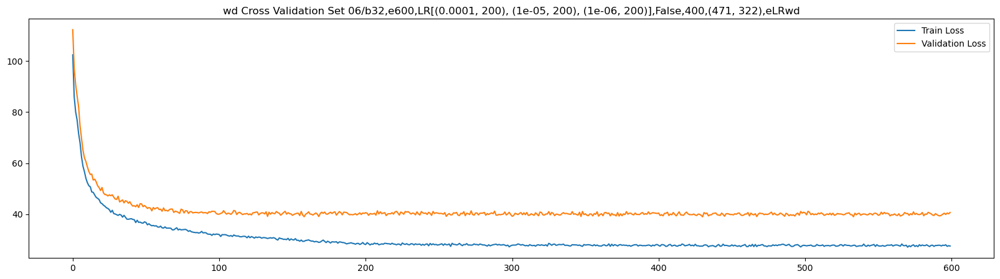

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(422, 187),eLRwd
Using saved model ,eLRwd [(0.0001, 200), (1e-05, 200), (1e-06, 200)] tensor(28.8236, device='cuda:0') tensor(34.5383, device='cuda:0') 57      


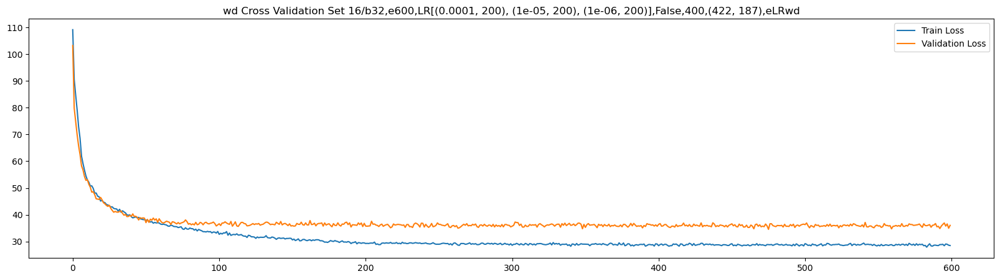

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(145, 201),eLRwd
Using saved model ,eLRwd [(0.0001, 200), (1e-05, 200), (1e-06, 200)] tensor(27.0632, device='cuda:0') tensor(39.6594, device='cuda:0') 54      


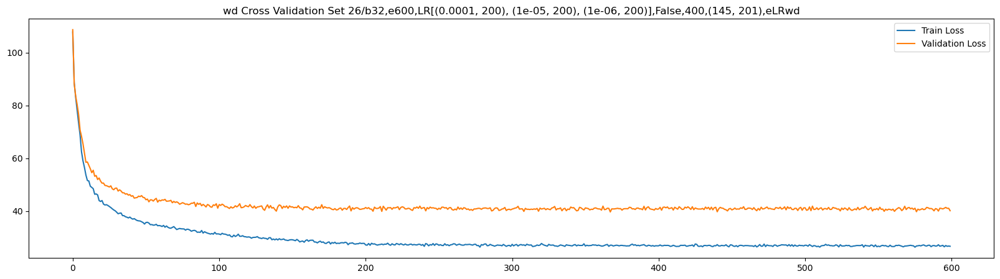

models_6/b32,e600,LR[(0.0001, 200), (1e-05, 200), (1e-06, 200)],False,400,(246, 115),eLRwd
Using saved model ,eLRwd [(0.0001, 200), (1e-05, 200), (1e-06, 200)] tensor(29.0004, device='cuda:0') tensor(35.1099, device='cuda:0') 57      


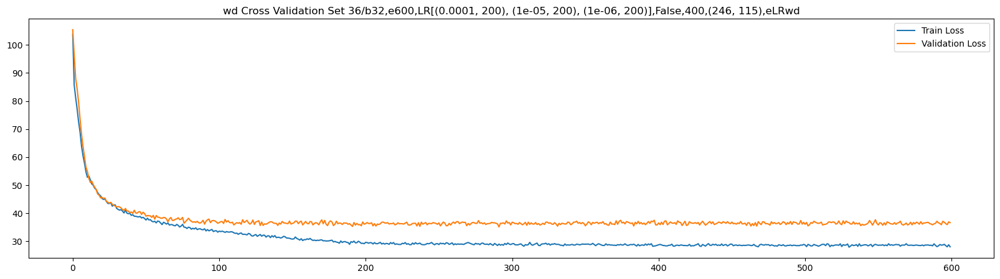

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(28.1115, device='cuda:0') tensor(37.0855, device='cuda:0') tensor(56.6090, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,400,(471, 322),eLRwd
Using saved model ,eLRwd [(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)] tensor(40.7821, device='cuda:0') tensor(45.1742, device='cuda:0') 64      


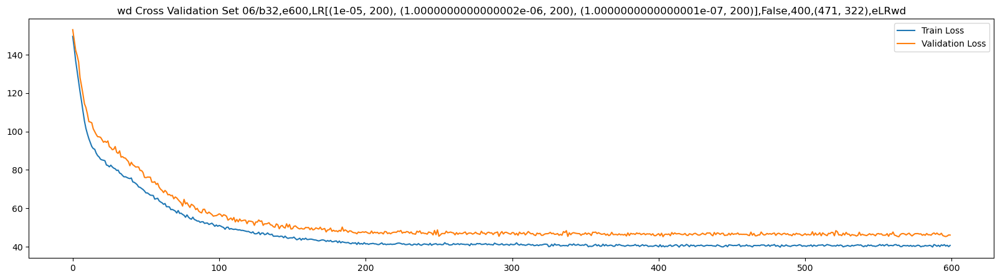

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,400,(422, 187),eLRwd
Using saved model ,eLRwd [(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)] tensor(42.4610, device='cuda:0') tensor(39.6983, device='cuda:0') 64      


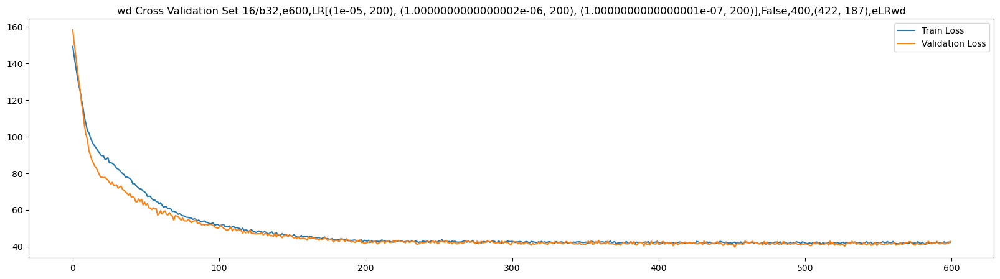

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,400,(145, 201),eLRwd
Using saved model ,eLRwd [(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)] tensor(39.7823, device='cuda:0') tensor(46.3894, device='cuda:0') 64      


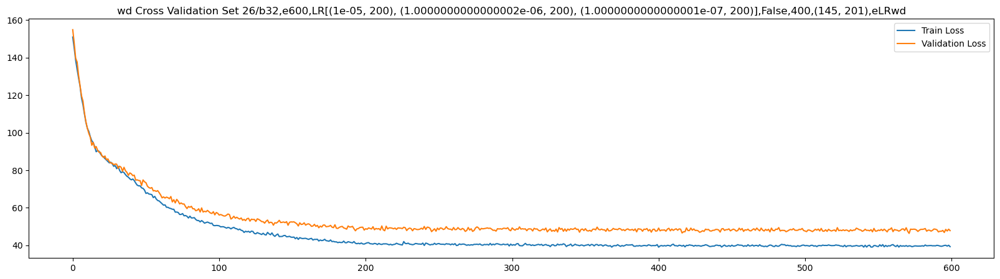

models_6/b32,e600,LR[(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)],False,400,(246, 115),eLRwd
Using saved model ,eLRwd [(1e-05, 200), (1.0000000000000002e-06, 200), (1.0000000000000001e-07, 200)] tensor(42.4059, device='cuda:0') tensor(40.8496, device='cuda:0') 65      


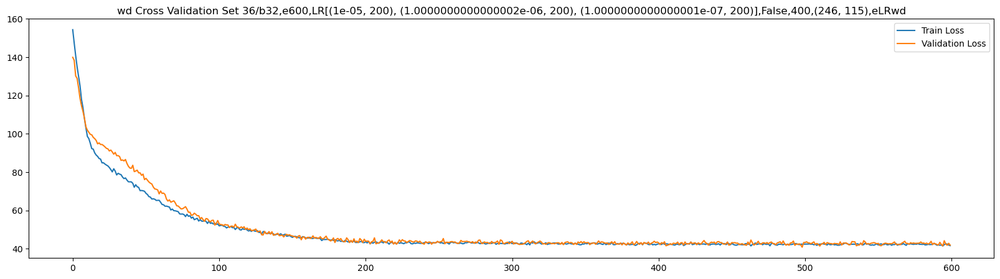

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(41.3578, device='cuda:0') tensor(43.0279, device='cuda:0') tensor(64.7107, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,400,(471, 322),eLRwd
Using saved model ,eLRwd [(1e-06, 200), (1e-07, 200), (1e-08, 200)] tensor(81.3436, device='cuda:0') tensor(90.1078, device='cuda:0') 110     


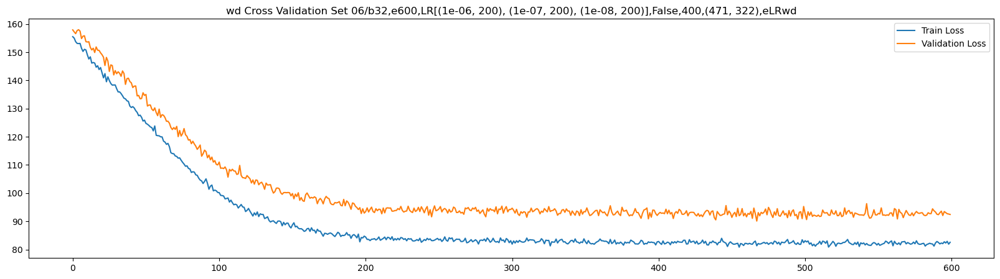

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,400,(422, 187),eLRwd
Using saved model ,eLRwd [(1e-06, 200), (1e-07, 200), (1e-08, 200)] tensor(87.2554, device='cuda:0') tensor(72.8964, device='cuda:0') 108     


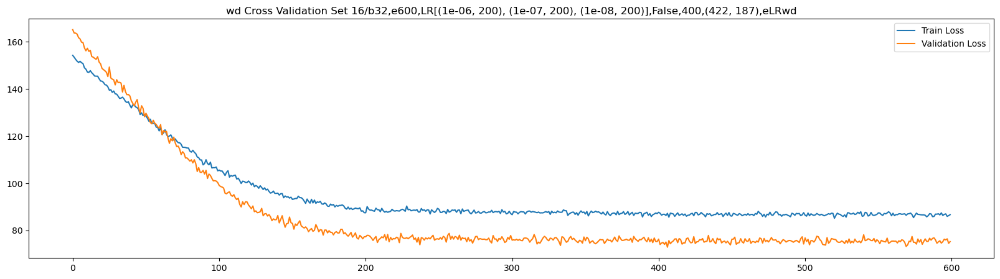

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,400,(145, 201),eLRwd
Using saved model ,eLRwd [(1e-06, 200), (1e-07, 200), (1e-08, 200)] tensor(85.0171, device='cuda:0') tensor(82.7945, device='cuda:0') 109     


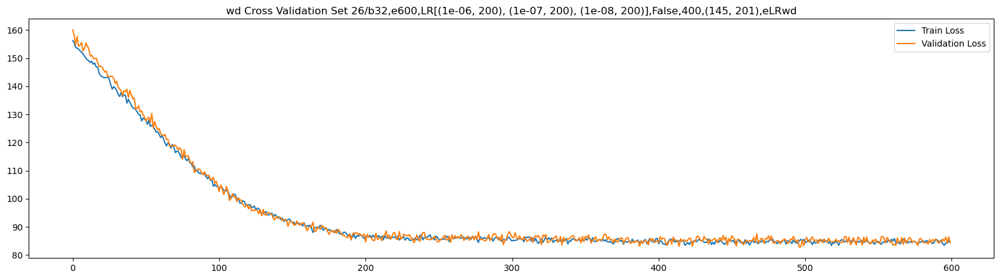

models_6/b32,e600,LR[(1e-06, 200), (1e-07, 200), (1e-08, 200)],False,400,(246, 115),eLRwd
Using saved model ,eLRwd [(1e-06, 200), (1e-07, 200), (1e-08, 200)] tensor(81.9853, device='cuda:0') tensor(89.2412, device='cuda:0') 110     


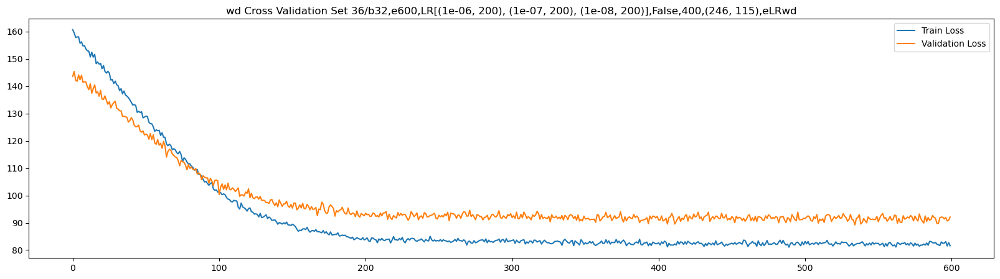

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
tensor(83.9003, device='cuda:0') tensor(83.7600, device='cuda:0') tensor(109.7340, device='cuda:0')
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [164]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=1),
    nn.LayerNorm((8, 199, 4)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 98, 1)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(392, 2),
    ScaledSigmoid()
).cuda()
f = 400
for i in [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001]:
    thing = test_model(model, train_valid_test_sets, mel_spect=False, f=f,
                     num_to_test=4, epochs=600, lr =[(i, 200), (i/10, 200), (i/100, 200)], gamma=0.99,
                      param="wd", saving="use_saved", plot_graph=True)

# Final testing data setup

In [174]:
print((test_set_bins[0]))
X_test_sets = [combined_waveforms[bin_indexes] for bin_indexes in test_set_bins]
Y_test_sets = [combined_positions[bin_indexes] for bin_indexes in test_set_bins]

tensor([3657, 3658, 3668, 3669, 3670, 3671, 3672, 3675, 3710, 3711, 3714, 3715,
        3722, 3723, 3724, 3725, 3726, 3727, 3728, 3729, 3730, 3731, 3732, 3733,
        3734, 3746, 3749, 3788, 3789, 3899, 3900, 3902, 3903, 3904, 3907, 3908,
        4031, 4134, 4135, 4137, 4140, 4141, 4266, 4267, 4268, 4632, 4633, 4634,
        4639, 4824, 4825, 4826, 4827, 4832, 4835, 4836, 4837, 4838, 4839, 4840,
        4841, 4842, 5023, 5030, 5031, 5032, 5076, 5093, 5153, 5154, 5155, 5156,
        5157, 5158, 5159, 5160, 5161, 5162, 5163, 5164, 5165, 5166, 5167, 5168,
        5169, 5170, 5171, 5489, 5490, 5491, 5493, 5494, 5495, 5496, 5497, 5498,
        5546, 5547, 5550, 5560, 5561, 5562, 5563, 5564, 5565, 5566, 5567, 5568,
        5569, 5572, 5586, 5587, 5588, 5590, 5651])


# Final Results

In [185]:
def final_train_model(model, data, batch_size=32, epochs=200, parameters="final", saving="", f=400,
                shuffle_data=True, save=False, verbose=True, lr=[(0.01, 200), (0.001, 200), (0.0001, 200)], final=False):
    torch.manual_seed(1)
    random.seed(1)
    X_train, Y_train, X_val, Y_val, X_tests, Y_tests = data
    model=model.cuda()
    X_train = torch.vstack([X_train, X_val]).cuda()
    Y_train = torch.vstack([Y_train, Y_val]).cuda()
    print(X_tests[0].shape)
    X_tests = [z_norm(spec(i.reshape(-1, 16, 1056), f=f).cuda()) for i in X_tests]
    Y_tests = [i.cuda() for i in Y_tests]
    
    test_loss_list = [[] for i in range(len(X_tests))]
    train_losses = []
    
    X_train = spec(X_train, f=f).cuda()
    
    # Normalize the data
    X_train = z_norm(X_train)

    parameters = f"models_6/b{batch_size},e{epochs},LR{lr},{f},{(int(Y_val[0, 0].item()), int(Y_val[0, 1].item()))}" + parameters
    print(parameters)
        
    if shuffle_data:
        perm=torch.randperm(len(X_train))
        X_train, Y_train = X_train[perm], Y_train[perm]
    
    optimizer = optim.Adam(params=model.parameters(), lr=lr[0][0])
    epochs = 0
    curr_lr = lr[0][0]
    lr_change_epochs = []
    for _, epoch_num in lr:
        lr_change_epochs.append(epochs)
        epochs += epoch_num
    pbar = tqdm(range(epochs), ncols=125)
    num_times_saved=0
    loss = nn.MSELoss()
    for epoch in pbar:
        if type(lr) != float:
            if epoch in lr_change_epochs:
                new_lr = lr[lr_change_epochs.index(epoch)][0]
                curr_lr = new_lr
                for g in optimizer.param_groups:
                    g['lr'] = new_lr
        for batch in range(len(X_train) // batch_size):
            model.train()
            optimizer.zero_grad()
            outputs_train = model(X_train[batch_size * batch: batch_size * (batch + 1)])
            
            batch_train_loss = loss(outputs_train, Y_train[batch_size * batch: batch_size * (batch + 1)])
            batch_train_loss.backward()
            optimizer.step()
        
        with torch.no_grad():
            train_loss = mae_loss(model(X_train), Y_train)
            for i in range(len(X_tests)):
                curr_test_loss = mae_loss(model(X_tests[i]), Y_tests[i])
                test_loss_list[i].append(curr_test_loss.detach().cpu().item())
        train_losses.append(train_loss.detach().cpu().item())
        
        pbar.set_description(str(epoch) +" Tr:"+ str(round(train_loss.item(), 2)) + str([round(test_loss_list[i][-1], 2) for i in range(len(X_tests))]))
    plt.plot(train_losses)
    plt.show()

    return model, train_losses, test_loss_list


torch.Size([115, 4, 4, 1056])
models_6/b32,e600,LR[(0.01, 200), (0.001, 200), (0.0001, 200)],400,(471, 322)final


599 Tr:19.55[29.19, 27.3, 29.36, 28.98, 28.68, 29.84, 31.87, 40.32, 109.11, 160.06]: 100%|█| 600/600 [02:29<00:00,  4.01it/s]


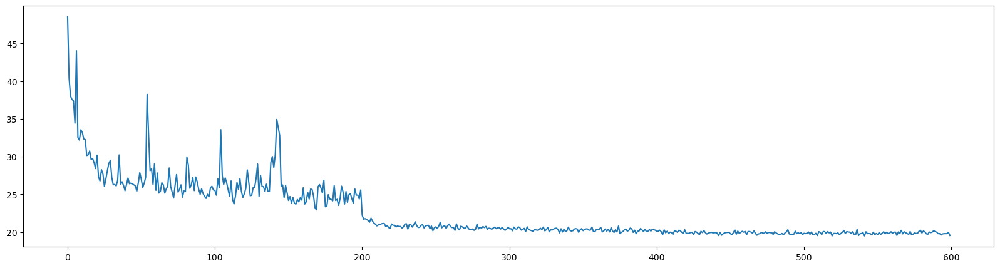

In [186]:
model = nn.Sequential(
    nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=1),
    nn.LayerNorm((8, 199, 4)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(in_channels=8, out_channels=4, kernel_size=2, stride=1),
    nn.LayerNorm((4, 98, 1)),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Flatten(),
    nn.Linear(392, 2),
    ScaledSigmoid()
).cuda()
f = 400

X_train, Y_train, X_val, Y_val, X_test, Y_test = train_valid_test_sets[0]

model, train_losses, test_loss_list=final_train_model(model, (X_train, Y_train, X_val, Y_val, X_test_sets, Y_test_sets), lr=[(0.01, 200), (0.001, 200), (0.0001, 200)], epochs=600)

torch.save((train_losses, test_loss_list), "models_6/final_results_spect.pt")


Bin 10: 160.05691528320312
Bin 9: 109.10699462890625
Bin 8: 40.31591033935547
Bin 7: 31.86861228942871
Bin 6: 29.840129852294922
Bin 5: 28.68334197998047
Bin 4: 28.97503662109375
Bin 3: 29.361848831176758
Bin 2: 27.302722930908203
Bin 1: 29.186391830444336
51.4697904586792


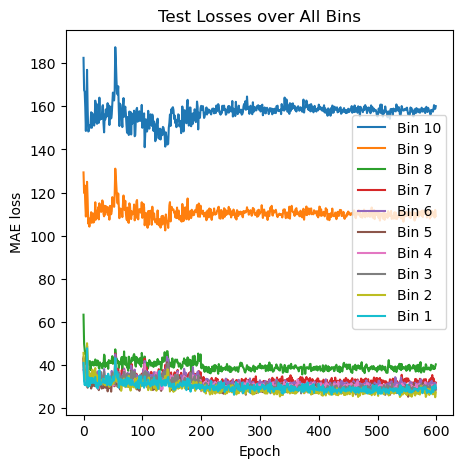

Bin 7: 31.86861228942871
Bin 6: 29.840129852294922
Bin 5: 28.68334197998047
Bin 4: 28.97503662109375
Bin 3: 29.361848831176758
Bin 2: 27.302722930908203
Bin 1: 29.186391830444336
[29.18600082397461, 27.30299949645996, 29.36199951171875, 28.975000381469727, 28.683000564575195, 29.84000015258789, 31.868999481201172, 40.316001892089844, 109.10700225830078, 160.0570068359375]
20.521808433532716


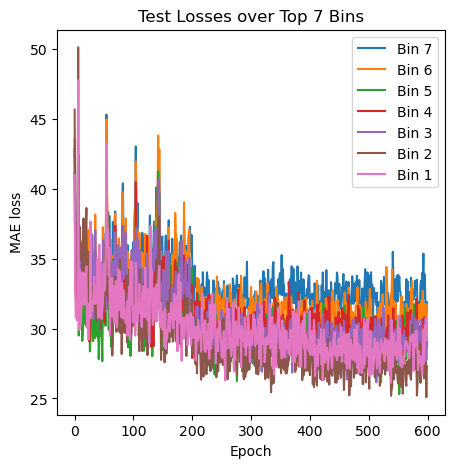

Final all test loss 51.4697904586792


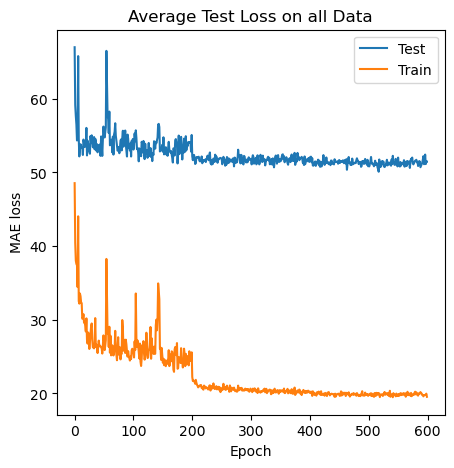

Final 7 test loss 29.316869190761018
Final train loss 19.54749870300293


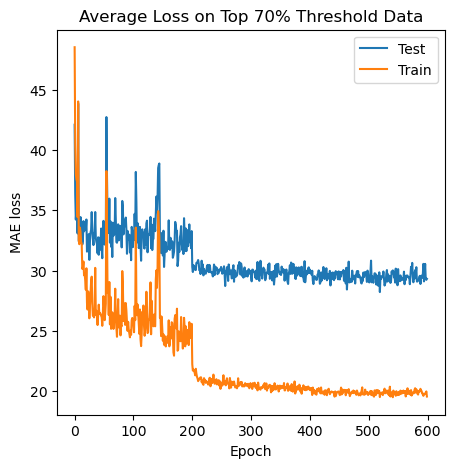

In [16]:
import torch
import matplotlib.pyplot as plt

train_losses, test_loss_list=torch.load("models_6/final_results_spect.pt")

plt.rcParams['figure.figsize'] = [5, 5]
# plt.plot(train_losses[:2000], label="Train Loss")
average = 0.0
things = []
for i, loss in reversed(list(enumerate(test_loss_list))):
    print(f"Bin {i+1}: {loss[-1]}")
    things.append(loss[-1])

    average+= loss[-1] / 10
    plt.plot(loss[:600], label=f"Bin {i+1}")

print(average)
plt.title("Test Losses over All Bins")
plt.legend()
plt.ylabel("MAE loss")
plt.xlabel("Epoch")
plt.show()

plt.rcParams['figure.figsize'] = [5, 5]
# plt.plot(train_losses[:2000], label="Train Loss")
average = 0.0

for i, loss in reversed(list(enumerate(test_loss_list[:7]))):
    print(f"Bin {i+1}: {loss[-1]}")
    average+= loss[-1] / 10
    plt.plot(loss[:600], label=f"Bin {i+1}")
print([(torch.round(torch.tensor(i)*10000).float()/1000).item() for i in reversed(things)])
print(average)
plt.title("Test Losses over Top 7 Bins")
plt.legend()
plt.ylabel("MAE loss")
plt.xlabel("Epoch")
plt.show()

all_loss = []
for i in range(600):
    average = 0.0
    for loss in test_loss_list:
        average+=loss[i]/10
    all_loss.append(average)
plt.title("Average Test Loss on all Data")
plt.plot(all_loss, label="Test")
print("Final all test loss", all_loss[-1])
plt.plot(train_losses, label="Train")
plt.legend()
plt.ylabel("MAE loss")
plt.xlabel("Epoch")

plt.show()
# print(torch.tensor(all_loss).sort())

all_loss7 = []
for i in range(600):
    average = 0.0
    for loss in test_loss_list[:7]:
        average+=loss[i]/7
    all_loss7.append(average)
plt.title("Average Loss on Top 70% Threshold Data")
plt.plot(all_loss7, label="Test")
print("Final 7 test loss", all_loss7[-1])
print("Final train loss", train_losses[-1])
plt.plot(train_losses, label="Train")
plt.legend()
plt.ylabel("MAE loss")
plt.xlabel("Epoch")
# print(torch.tensor(all_loss).sort())
plt.show()